# Início

In [1]:
#@title Configurações

import os
import numpy as np
import scipy as sp
!pip install numba==0.56.4
import numba as nb
import pandas as pd
import shapely as shp
import geopandas as gpd
import math
from math import ceil
import cmath
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import colorsys

gpu = os.environ["COLAB_GPU"]

if gpu:
  print("GPU conectada")
  import cupy as cp
  # import cupyx as cx
  # import dask
  # import numba as nb
  from cupy import fuse
  from cupy import asnumpy
  # from cupyx.scipy import sparse as sp
  from cupyx import rsqrt

else:
  print("Nenhuma GPU conectada")
  import numpy as cp
  # import dask
  #os.environ['NUMBA_ENABLE_CUDASIM'] = '1'
  from numba import vectorize as fuse
  from numpy import array as asnumpy
  # from scipy import sparse as sp
  # fuse
  def rsqrt(x): return cp.reciprocal(cp.sqrt(x))



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.6/34.6 MB 48.3 MB/s eta 0:00:00
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.41.1
    Uninstalling llvmlite-0.41.1:
      Successfully uninstalled llvmlite-0.41.1
  Attempting uninstall: numba
    Found existing installation: numba 0.58.1
    Uninstalling numba-0.58.1:
      Successfully uninstalled numba-0.58.1
GPU conectada


In [2]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install folium
!pip install mapclassify

In [3]:
!pip install pandapower
import pandapower as pp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 31.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 kB 9.8 MB/s eta 0:00:00
  Created wheel for pandapower: filename=pandapower-2.13.1-py3-none-any.whl size=10803674 sha256=6f6471aa1c8e3647fd716d40d7e5a0c3f864c1adb93e1c07c2267b6d3502bd82
  Stored in directory: /root/.cache/pip/wheels/6b/58/fb/c5c16044f0046e905e2fe55de3af6c0a43bfcc3219ed5d3af8
Successfully built pandapower


In [4]:
def problema(A):
  a = asnumpy(A)
  return np.argwhere((np.isnan(a)|np.isinf(a)))

# Álgebra vetorial

In [5]:
#@title Kernels


@fuse()
def norma(v):
  """
  Norma euclidiana de cada vetor na array v.
  """
  return cp.sqrt(cp.sum(cp.square(v), axis=-1))



@fuse()
def prodSca(A, B):
  """
  Produto escalar entre vetores de N dimensões.
  O produto escalar entre dois vetores v1 e v2 é calculado como a soma dos
  produtos dos elementos correspondentes: v1[0]*v2[0] + ... + v1[N-1]*v2[N-1]

  Parâmetros:
  -------
  - A (cupy.ndarray): Array de vetores de N dimensões. Pode ter qualquer forma.
  - B (cupy.ndarray): Outra array de vetores. Deve ter forma compatível com
      A, e os vetores devem ter N dimensões (ie, B.shape[-1] = N = A.shape[-1])

  Retorna:
  -------
  - cupy.ndarray: Array com os produtos escalares entre os vetores de A e os
      vetores correspondentes de B.
  """
  return cp.sum(A*B, axis=-1)



def cprod(A, B):
  """
  Produto escalar entre cada vetor na array A e cada vetor em B.

  Parâmetros:
  -------
  - A (cupy.ndarray): Array de vetores de N dimensões. Pode ter qualquer forma.
  - B (cupy.ndarray): Outra array de vetores de N dimensões. Também pode ter
      qualquer forma, contanto que B.shape[-1] = N = A.shape[-1]

  Retorna:
  -------
  - prod (cupy.ndarray): Produto escalar entre cada par de vetores.
      Tem forma A.shape[:-1]+B.shape[:-1]
  """

  N = A.shape[-1] # == B.shape[-1]

  formasings = A.shape[:-1] + (1,)*(B.ndim-1) + (N,)
  # A recebe um número de eixos de tamanho 1 ("singletons") suficiente para
  # tornar-se compatível com B.
  Asings = A.reshape(formasings).view()

  prod = prodSca(Asings, B)
  return prod


In [6]:
#@title Interseções

def perp(u) :
  """
  Retorna um vetor bidimensional perpendicular a 'u', igual a 'u' rotacionado
  90º no sentido anti-horário.

  Parâmetros:
  -----------
  - u (list-like): Um vetor de dois elementos

  Retorna:
  --------
  - v (array): Array de dois elementos que descreve um vetor igual a 'u'
      rotacionado 90º no sentido anti-horário.
  """
  v = np.empty_like(u)
  v[0] = -u[1]
  v[1] = u[0]
  return v



def seg_intersect(seg0, pts) :
  """
  Interseção entre as retas definidas pelos segmentos 'seg0' e 'pts'

  Parâmetros:
  -----------
  - seg0 (list-like): Array de forma (2,nd) representando uma sequência de dois
      pontos no espaço. Apenas os componentes x e y são considerados, e se nd>2,
      o resto é descartado.
  - pts (list-like): Array de forma (npts,nd) representando uma polyline, ou
      sequência de segmentos consecutivos.

  Retorna:
  --------
  - inter (array): Vetor de dois elementos na interseção entre as retas que
      estendem 'seg0' e 'pts'. Não necessariamente no interior destes segmentos.
      Se 'pts' contiver mais de dois pontos, e houver múltiplas interseções,
      retorna-se a mais próxima à origem de 'seg0'.

  """
  seg0 = asnumpy(seg0).reshape((2,-1))[:,:2]
  pts = asnumpy(pts)[:,:2]
  seg0 = seg0[:,:2];    pts = pts[:,:2]

  npts = len(pts)
  if npts > 2:
    inters = np.empty((npts-1,2))
    for p in range(npts-1):
      inters[p] = seg_intersect(seg0, pts[p:p+2])
    dists = np.linalg.norm(inters - seg0[0], axis=1)
    inters = inters[np.argsort(dists)]
    inter = inters[0]
    return np.array(inter)
  else:
    a1, a2 = seg0[0][:2], seg0[1][:2]
    b1, b2 = pts[0][:2], pts[1][:2]
    da = a2-a1
    db = b2-b1
    dp = a1-b1
    dap = perp(da)
    denom = np.dot(dap, db).astype(float)
    denom = denom if denom != 0 else -1
    num = np.dot(dap, dp)
    inter =  (num / denom)*db + b1
    return inter



def vetUnit(ls):
  """
  Dada uma LineString de dois pontos, retorna uma outra de comprimento igual a 1,
  e origem e direção iguais.

  Parâmetros:
  -----------
  - ls (shapely.LineString): LineString de dois pontos, representando um
      segmento de reta

  Retorna:
  --------
  - segUni (shapely.LineString): LineString de comprimento unitário com origem
      e direção iguais a 'ls'.
  """
  pta, ptb = asnumpy(ls.coords[0]), asnumpy(ls.coords[-1])
  vd = ptb - pta
  d = np.linalg.norm(vd)
  vduni = vd/d
  segUni = shp.LineString([shp.Point(pta), shp.Point(pta+vduni)])
  return segUni



def bisect(seg0, seg1):
  """
  Bissetriz do ângulo formado pelos segmentos 'seg0' e 'seg1'.

  Parâmetros:
  -----------
  - seg0 (list-like): Array de forma (2,nd) representando uma sequência de dois
      pontos no espaço. Apenas os componentes x e y são considerados, e se nd>2,
      o resto é descartado.
  - seg1 (list-like): Vide 'seg0'.

  Retorna:
  --------
  - segBS (array): Array de forma (2,2) representando um segmento de reta
      que é a bissetriz do ângulo formado pelos segmentos 'seg0' e 'seg1'. Ele
      tem origem na interseção das retas de 'seg0' e 'seg1', e comprimento unitário.
  """
  seg0 = asnumpy(seg0).reshape((2,-1))[:,:2]
  seg1 = asnumpy(seg1).reshape((2,-1))[:,:2]

  vd0, vd1 = seg0[1]-seg0[0], seg1[1]-seg1[0]
  vduni0 = vd0 / np.linalg.norm(vd0)
  vduni1 = vd1 / np.linalg.norm(vd1)

  bs = vduni0 + vduni1
  if bs.any():
    bs /= np.linalg.norm(bs)
  else:
    bs = perp(vd0)

  inter = seg_intersect(seg0, seg1)
  segBS = np.array([inter, inter+bs])
  return segBS

In [7]:
#@title Offset

def offset(segs, distoff, abertura=0.0):
  """
  Retorna um segmento de reta igual a 'seg', mas deslocado para a esquerda por
  uma distância 'distoff'.
  A 'esquerda' é definida pelo vetor unitário 'ortho', ortogonal a 'seg' e
  paralelo ao plano xy, obtido após rotacionar 'seg' no sentido anti-horário.

  Parâmetros:
  -------
  - segs: Segmento(s) de reta, representado(s) por uma array de forma
      formaseg+(2,3).
  - distoff (float ou np.ndarray): Distância de deslocamento para a esquerda.
      Pode ser um valor float ou uma array de forma qualquer. Se for array, para
      cada eixo que possuir, será adicionado um à forma do resultado final,
  - abertura (float ou np.ndarray, opcional): Razão entre os deslocamentos
      no início e no fim no segmento. Pode ser float ou uma array com a mesma
      forma de distoff.

  Retorna:
  -------
  - novo (np.ndarray): Segmentos de reta deslocados. Tem forma
      formaseg+distoff.shape+(2,3)

  """
  inicio = segs[...,0,:]
  fim = segs[...,1,:]
  vd = fim - inicio  # Vetor diretor

  vert = np.array([0,0,1])
  ortho = np.cross(vert, vd) # Rotação por 90º no sentido anti-horário
  ortho /= np.linalg.norm(ortho, axis=-1)[...,None]  # Normalização

  deltaini = ortho.reshape((1,)*distoff.ndim + ortho.shape) * distoff.reshape(distoff.shape+(1,)*vd.ndim)
  deltafim = ortho.reshape((1,)*distoff.ndim + ortho.shape) * (distoff*(1+abertura)).reshape(distoff.shape+(1,)*vd.ndim)
  novo = np.stack((inicio+deltaini, fim+deltafim), axis=-2)

  return novo


def offsetlinhas(central, entrefases, nfases=3, eixofases=-3):
  """
  Constrói as múltiplas fases e cabos de uma linha de transmissão a partir da
  fase central.

  Parâmetros:
  - central: Fase(s) central(is), em uma array de forma (..., 2, 3).
  - entrefases (float ou np.ndarray): Espaçamento entre fases adjacentes.
  - nfases (int, opcional): Número de fases a construir. Quase sempre 3.
  - eixofases (int, opcional): Eixo ao longo do qual as fases serão
      construídas. O padrão é -3.

  Retorna:
  - fases: Array que com as coordenadas de todas as fases de uma linha de
      transmissão. Se 'eixofases' tiver o valor padrão, terá forma
      central.shape[:-2] + (nfases, 2, 3)
  """

  central = np.array(central)
  central = central.reshape(central.shape[:-2]+(2,3))

  largura = np.array(entrefases)*(nfases-1)
  esq = offset(central, largura/2)
  dir = offset(central,-largura/2)

  fases = np.linspace(esq, dir, axis=eixofases, num=nfases)
  return fases


In [8]:
#@title Coordenadas cilíndricas (CPU)


# def prodSca(u, v):
#   return cp.einsum('...d, ...d', u, v)



# def norma(v):
#   return cp.sqrt(prodSca(v,v))



# Código em CUDA da função 'distsPares':
codigoDistsPares = '''
extern "C" __global__
void distsPares(const float* A, const float* B, float* dist, int tamA, int tamB) {
    int i = blockIdx.x * blockDim.x + threadIdx.x;
    int j = blockIdx.y * blockDim.y + threadIdx.y;

    if (i < tamA && j < tamB) {
        float quad = 0.0;
        for (int k = 0; k < 3; ++k) {
            float diff = A[i*3+k] - B[j*3+k];
            quad += diff * diff;
        }
        dist[i*tamB+j] = sqrt(quad);
    }
}
'''
distsPares = cp.RawKernel(codigoDistsPares, 'distsPares')

def cdist(A, B, bloco=(32,32)):
  """
  Distância euclidiana entre cada ponto em 'A' e cada ponto em 'B'

  Parâmetros:
  -------
  - A (cupy.ndarray): Array com vetores de três dimensões. Pode ter qualquer
      forma, contanto que a última dimensão (A.shape[-1]) seja 3.
  - B (cupy.ndarray): Outra array, que também pode ter qualquer forma.
  - bloco (tuple, opcional): O tamanho do bloco para o cálculo paralelo

  Retorna:
  -------
  - dists (cupy.ndarray): Array de forma A.shape[:-1]+B.shape[:-1]
      Se A[ia,:] = (ax, ay, az) e B[ib,:] = (bx, by, bz), então
      dists[ia, ib] = sqrt( (ax-bx)^2 + (ay-by)^2 +  (az-bz)^2 )
  """

  A = cp.ascontiguousarray(A, dtype=cp.float32)
  B = cp.ascontiguousarray(B, dtype=cp.float32)
  dists = cp.empty(A.shape[:-1] + B.shape[:-1], dtype=cp.float32)

  grid = ceil(A.size//3 / bloco[0]), ceil(B.size//3 / bloco[1])
  distsPares(grid, bloco, \
   (A.ravel(), B.ravel(), dists.ravel(), \
    A.size//3, B.size//3))

  return dists




def cilindricas(obs, segs, raios):
  """
  Calcula as 'coordenadas cilíndricas' entre cada ponto em 'obs' e cada segmento
  de reta em 'segs'.

  Parâmetros:
  -------
  - obs (array): Array de 'observadores', que são vetores de 3D onde calcula-se algo.
      Geralmente é uma grade de pontos regularmente espaçados, de forma (nx, ny, nz, 3).
  - segs (array): Array de forma (nsegs, 2, 3) com as coordenadas de início e
      fim das cargas lineares.
  - raios (array): Array de forma (nsegs,) com os raios dos segmentos. Para
      evitar erros de divisão por zero, em pontos localizados no interior de um
      cabo, a distância radial 'sr' é arredondada para o raio correspondente .

  Retorna:
  -------
  - pc: Array de forma (nx, ny, nz, nsegs) com as 'coordenadas axiais', que
      são as projeções de toda linha de um observador ao centro de um
      segmento sobre a reta que estende os segmento. Varia em sinal.
  - sr: Array de forma (nz, ny, nx, nsegs) com as distâncias radiais entre
      cada ponto observador e a reta que estende cada segmento.
  - d: Array de forma (nsegs,) com os comprimentos dos segmentos.
  """
  pta = segs[:,0,:]
  ptb = segs[:,1,:]
  ptc = (pta + ptb) / 2
  vd = ptb - pta
  d = norma(vd)
  vduni = vd / d[:, None]

  voc = ptc-obs[...,None,:]
  pc = prodSca(voc, vduni)
  voc -= pc[...,None]*vduni
  sr = cp.linalg.norm(voc, axis=-1)
  del voc
  sr = cp.where((sr<raios)&(cp.abs(pc)<=d/2), raios, sr)

  del pta, ptb, vd, vduni
  return pc, sr, d


# Eletromagnetismo

In [9]:
#@title CUDA

codigoCUDA = \
'''
#include <cuComplex.h>

__device__
float3 vadd(const float3& u, const float3& v) {
    return make_float3(u.x + v.x, u.y + v.y, u.z + v.z);
}
__device__
float3 vsub(const float3& u, const float3& v) {
    return make_float3(u.x - v.x, u.y - v.y, u.z - v.z);
}
__device__
float3 vmul(const float3& u, const float3& v) {
    return make_float3(u.x * v.x, u.y * v.y, u.z * v.z);
}
__device__
float3 vmulsca(const float3& v, float c) {
    return make_float3(c * v.x, c * v.y, c * v.z);
}
__device__
float3 media(const float3& u, const float3& v) {
    return make_float3((u.x + v.x)/2, (u.y + v.y)/2, (u.z + v.z)/2);
}
__device__
float vdot(const float3& u, const float3& v) {
    return u.x * v.x + u.y * v.y + u.z * v.z;
}
__device__
float3 vcross(const float3& u, const float3& v) {
  return make_float3(u.y*v.z-u.z*v.y, u.z*v.x-u.x*v.z, u.x*v.y-u.y*v.x);
}

__device__
float norma(const float3& v) {
    return sqrt(vdot(v, v));
}
__device__
float normalizar(float3& v) {
  float modv = norma(v);
  v = vmulsca(v, 1/(modv>0 ? modv : 1.0));
  return modv;
}





__device__
float3 ParOrt(const float3& obser, const float3& ptcentro, float3& vd,
              float3& vpara, float3& vort) {
    float3 ccyl; // Coordenadas cilindricas
    float3 vdif = vsub(obser, ptcentro);

    // Paralelo:
    float d = normalizar(vd);  // Comprimento do segmento de carga
    // Projetar o vetor diferenca sobre o vetor unitario paralelo:
    float pc = vdot(vdif, vd);
    // Multiplicar o vetor unitario por pc:
    vpara = vmulsca(vd, pc);

    // Ortogonal:
    vort = vsub(vdif, vpara);
    float sr = normalizar(vort);

    normalizar(vpara);
    //vd = vmulsca(vd, -1.0);

    ccyl.x = pc;
    ccyl.y = sr;
    ccyl.z = d;
    return ccyl;
}






__device__
float2 coefsPot(float sr, float pc, float d) {
    float2 P;

    // Coeficiente de qc:
    float pabs = abs(pc);
    float numerador = hypot(sr, pabs+d/2) + pabs+d/2;
    float denominador = hypot(sr, pabs-d/2) + pabs-d/2;
    P.x = log(numerador/denominador);

    // Coeficiente de dq:
    P.y = -pc * P.x;
    P.y += hypot(pc+d/2, sr);   // +sb
    P.y -= hypot(pc-d/2, sr);   // -sa

    return P;
}



extern "C" __global__
void calc_potential(float3* obs, float3* segs, float* raios,
                    cuFloatComplex* qc, cuFloatComplex* dq,
                    int metDasImagens,
                    int numobs, int nsegs,
                    cuFloatComplex* V) {

    int iob = blockIdx.x * blockDim.x + threadIdx.x;  // indice de obs
    int isg = blockIdx.y * blockDim.y + threadIdx.y;  //indice de segs

    if (iob < numobs && isg < nsegs) {

        // Dados geometricos
        float pc, sr, d;

        float3 pta = segs[isg * 2];
        float3 ptb = segs[isg * 2 + 1];

        float3 vpara, vort;
        float3 ptcentro = media(pta, ptb);
        float3 vd = vsub(ptb, pta); // Vetor diretor

        float3 ccyl;  // Coordenadas cilindricas
        ccyl = ParOrt(obs[iob], ptcentro, vd, vpara, vort);
        pc = ccyl.x;   // Coordenada axial
        sr = ccyl.y;  // Dist. radial
        d = ccyl.z;   // Comprimento do segmento

        int dentro = (sr<raios[isg] & (abs(pc)<abs(d/2))) ? 1 : 0;
        sr = dentro ? raios[isg] : sr;

        float2 P = coefsPot(sr, pc, d);
        float P_qc = P.x;
        float P_dq = P.y;

        if (metDasImagens)  {
          pta.z *= -1;  ptb.z *= -1;
          ptcentro = media(pta, ptb);
          vd = vsub(ptb, pta);
          ccyl = ParOrt(obs[iob], ptcentro, vd, vpara, vort);
          pc = ccyl.x;  sr = ccyl.y;  d = ccyl.z;

          float2 P_img = coefsPot(sr, pc, d);
          P_qc -= P_img.x;
          P_dq -= P_img.y;

          pta.z *= -1;  ptb.z *= -1;
        }

        atomicAdd(&V[iob].x, P_qc * qc[isg].x + P_dq * dq[isg].x); // real
        atomicAdd(&V[iob].y, P_qc * qc[isg].y + P_dq * dq[isg].y); // imag
    }
}



extern "C" __global__
void matCoefsPot(float3* obs, float3* segs, float* raios,
                    int metDasImagens,
                    int numobs, int nsegs,
                    float2* P) {

    int iob = blockIdx.x * blockDim.x + threadIdx.x;  // indice de obs
    int isg = blockIdx.y * blockDim.y + threadIdx.y;  //indice de segs

    if (iob < numobs && isg < nsegs) {

        // Dados geometricos
        float pc, sr, d;

        float3 pta = segs[isg * 2];
        float3 ptb = segs[isg * 2 + 1];

        float3 vpara, vort;
        float3 ptcentro = media(pta, ptb);
        float3 vd = vsub(ptb, pta); // Vetor diretor

        float3 ccyl;  // Coordenadas cilindricas
        ccyl = ParOrt(obs[iob], ptcentro, vd, vpara, vort);
        pc = ccyl.x;   // Coordenada axial
        sr = ccyl.y;  // Dist. radial
        d = ccyl.z;   // Comprimento do segmento

        int dentro = (sr<raios[isg] & (abs(pc)<abs(d/2))) ? 1 : 0;
        sr = dentro ? raios[isg] : sr;

        float2 Pthread = coefsPot(sr, pc, d);
        P[iob*nsegs + isg].x = Pthread.x;
        P[iob*nsegs + isg].y = Pthread.y;

        if (metDasImagens)  {
          pta.z *= -1;  ptb.z *= -1;
          ptcentro = media(pta, ptb);
          vd = vsub(ptb, pta);
          ccyl = ParOrt(obs[iob], ptcentro, vd, vpara, vort);
          pc = ccyl.x;  sr = ccyl.y;  d = ccyl.z;

          float2 P_img = coefsPot(sr, pc, d);
          P[iob*nsegs + isg].x -= P_img.x;
          P[iob*nsegs + isg].y -= P_img.y;

          pta.z *= -1;  ptb.z *= -1;
        }
    }
}





__device__
float coefsEPar_qc(float sr, float pc, float d) {
  float CPar_qc  = - rsqrtf(sr*sr + (pc+d/2)*(pc+d/2));   // -1/sb
  CPar_qc += rsqrtf(sr*sr + (pc-d/2)*(pc-d/2));           // +1/sa
  return CPar_qc;
}

__device__
float coefsEOrt_qc(float sr, float pc, float d) {
  float pa = pc-d/2;
  float pb = pc+d/2;
  float COrt_qc  = pb / sqrtf(sr*sr + pb*pb); // pb/sb
  COrt_qc -= pa / sqrtf(sr*sr + pa*pa);       //-pa/sa
  COrt_qc /= sr;
  return COrt_qc;
}


__device__
float coefsEPar_dq(float CPar_qc, float COrt_qc,
                        float sr, float pc, float d) {
  float CPar_dq = 0.0;
  CPar_dq += CPar_qc * pc;
  CPar_dq += COrt_qc * sr;  // - (pb/sb - pa/sa)

  // Termo igual a P_qc!:
  float pabs = abs(pc);
  float numerador = hypot(sr, pabs + d/2) + pabs + d/2;
  float denominador = hypot(sr, pabs - d/2) + pabs - d/2;
  float P_qc = log(numerador/denominador);
  CPar_dq -= P_qc;

  return CPar_dq;
}

__device__
float coefsEOrt_dq(float COrt_qc, float CPar_qc,
                        float sr, float pc, float d) {
  float COrt_dq = 0.0;
  COrt_dq += COrt_qc * pc;
  COrt_dq += CPar_qc * (-sr);
  return COrt_dq;
}





extern "C" __global__
void calc_campo(float3* obs, float3* segs, float* raios,
                    cuFloatComplex* qc, cuFloatComplex* dq,
                    float3 desde, float3 ate, int numobs, int nsegs,
                    cuFloatComplex* E) {

  int iob = blockIdx.x * blockDim.x + threadIdx.x;  // indice de obs
  int isg = blockIdx.y * blockDim.y + threadIdx.y;  // indice de segs

  if (iob < numobs && isg < nsegs) {

    // Dados geometricos
    float d, pc, sr;

    float3 obser = obs[iob];
    float3 pta = segs[isg * 2];
    float3 ptb = segs[isg * 2 + 1];
    float raio = raios[isg];

    float3 vpara, vort;
    float3 ptcentro = media(pta, ptb);
    float3 vd = vsub(ptb, pta); // Vetor diretor

    float3 ccyl;  // Coordenadas cilindricas
    ccyl = ParOrt(obser, ptcentro, vd, vpara, vort);
    pc = ccyl.x;   // Coordenada axial
    sr = ccyl.y;  // Dist. radial
    d = ccyl.z;   // Comprimento do segmento

    int dentro = (sr<raio & (abs(pc)<abs(d/2))) ? 1 : 0;
    sr = (sr<raio) ? raio : sr;

    // Componentes
    float CPar_qc, COrt_qc, CPar_dq, COrt_dq;
    CPar_qc = coefsEPar_qc(sr, pc, d) * (1-dentro);
    COrt_qc = coefsEOrt_qc(sr, pc, d) * (1-dentro);
    CPar_dq = coefsEPar_dq(CPar_qc, COrt_qc, sr, pc, d) * (1-dentro);
    COrt_dq = coefsEOrt_dq(COrt_qc, CPar_qc, sr, pc, d) * (1-dentro);

    // Amplitudes dos componentes paralelo e ortogonal do campo
    cuFloatComplex epar, eort;
    epar.x = CPar_qc*qc[isg].x + CPar_dq*dq[isg].x; // real
    epar.y = CPar_qc*qc[isg].y + CPar_dq*dq[isg].y; // imag
    eort.x = COrt_qc*qc[isg].x + COrt_dq*dq[isg].x;
    eort.y = COrt_qc*qc[isg].y + COrt_dq*dq[isg].y;

    // Campo no ponto atual devido a carga atual
    float3 Ereal, Eimag;
    Ereal = vadd(vmulsca(vd, epar.x), vmulsca(vort, eort.x));
    Eimag = vadd(vmulsca(vd, epar.y), vmulsca(vort, eort.y));


    // Acumular
    atomicAdd(&E[3*iob+0].x, Ereal.x);   atomicAdd(&E[3*iob+0].y, Eimag.x);
    atomicAdd(&E[3*iob+1].x, Ereal.y);   atomicAdd(&E[3*iob+1].y, Eimag.y);
    atomicAdd(&E[3*iob+2].x, Ereal.z);   atomicAdd(&E[3*iob+2].y, Eimag.z);
  }
}





const float permeab = 1.256637062 / 1000000;
const float pi = 3.141592;

__device__
float coefsB(float sr, float pc, float d) {
  float pa = pc-d/2;
  float pb = pc+d/2;
  float cb  = pb / sqrtf(sr*sr + pb*pb); // pb/sb
  cb -= pa / sqrtf(sr*sr + pa*pa);       //-pa/sa
  cb /= sr;
  return cb * permeab / (4*pi);
}


extern "C" __global__
void calc_campo_mag(float3* obs, float3* segs, float* raios,
                    cuFloatComplex* corr,
                    float3 desde, float3 ate, int numobs, int nsegs,
                    cuFloatComplex* B) {

  int iob = blockIdx.x * blockDim.x + threadIdx.x;  // indice de obs
  int isg = blockIdx.y * blockDim.y + threadIdx.y;  // indice de segs

  if (iob < numobs && isg < nsegs) {

    // Dados geometricos
    float d, pc, sr;

    float3 pta = segs[isg * 2];
    float3 ptb = segs[isg * 2 + 1];

    float3 vpara, vort;
    float3 ptcentro = media(pta, ptb);
    float3 vd = vsub(ptb, pta); // Vetor diretor

    float3 ccyl;  // Coordenadas cilindricas
    ccyl = ParOrt(obs[iob], ptcentro, vd, vpara, vort);
    pc = ccyl.x;   // Coordenada axial
    sr = ccyl.y;  // Dist. radial
    d = ccyl.z;   // Comprimento do segmento

    int dentro = (sr<raios[isg] & (abs(pc)<abs(d/2))) ? 1 : 0;
    sr = (sr<raios[isg]) ? raios[isg] : sr;

    // Coeficiente
    float cb = coefsB(sr, pc, d) * (1-dentro);

    // Amplitude do campo
    cuFloatComplex ampb;
    ampb.x = cb*corr[isg].x; // real
    ampb.y = cb*corr[isg].y; // imag

    // Direcao do campo
    float3 vfora = vcross(vd, vort);
    normalizar(vfora);

    // Campo no ponto atual devido a corrente atual
    float3 Breal, Bimag;
    Breal = vmulsca(vfora, ampb.x); // real
    Bimag = vmulsca(vfora, ampb.y); // imag


    // Acumular resultados de cada thread
    atomicAdd(&B[3*iob+0].x, Breal.x);   atomicAdd(&B[3*iob+0].y, Bimag.x);
    atomicAdd(&B[3*iob+1].x, Breal.y);   atomicAdd(&B[3*iob+1].y, Bimag.y);
    atomicAdd(&B[3*iob+2].x, Breal.z);   atomicAdd(&B[3*iob+2].y, Bimag.z);
  }
}



'''

# Compilar
modulo_CUDA = cp.RawModule(code=codigoCUDA, backend='nvcc')
# Funções
calc_potencial = modulo_CUDA.get_function('calc_potential')
calc_campo = modulo_CUDA.get_function('calc_campo')
calc_campo_mag = modulo_CUDA.get_function('calc_campo_mag')


calc_coefsPot = modulo_CUDA.get_function('matCoefsPot')

# Gráficos

In [10]:
#@title Plotar arrays

def plotarFunc(func, X=None,Y=None, desde=(-10, -10), ate=(10, 10), passo=1/10):
    x = np.linspace(desde[0], ate[0], int((ate[0]-desde[0])/passo))
    y = np.linspace(desde[1], ate[1], int((ate[1]-desde[1])/passo))
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)

    plt.figure(figsize=(8, 6))
    contour = plt.contourf(X, Y, Z, levels=20, cmap='coolwarm')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()


def plotarr(Arr, X=None, Y=None, prcent=None, vmin=None, vmax=None, \
            titulo='', unidade='', eixohoriz='x', eixovert='y', \
            cmap='viridis'):
  plt.figure(figsize=(8, 6))

  Arr = cp.squeeze(Arr)
  if cp.iscomplex(Arr).any():
    Arr = cp.absolute(Arr)

  if prcent is not None:
    if (vmin is None) and (vmax is None):
      vmin = cp.percentile(Arr, (100-prcent)/2)
      vmax = cp.percentile(Arr, (100+prcent)/2)

    if vmin is None: vmin = 0.0
    if vmax is None: vmax = cp.percentile(Arr, (100+prcent)/2)

    partedentro = cp.count_nonzero(\
                                  cp.logical_and((cp.absolute(Arr)>vmin), \
                                    (cp.absolute(Arr)<vmax))) \
                                    / Arr.size
    print(f'{100 * partedentro} % dos pontos estão entre {vmin} e {vmax}')

  Arr = asnumpy(Arr)

  X = np.arange(Arr.shape[0]+1) if X is None else asnumpy(X)
  Y = np.arange(Arr.shape[1]+1) if Y is None else asnumpy(Y)

  fig, ax = plt.subplots(1, 1)
  plot = ax.pcolormesh(X, Y, Arr.T, cmap=cmap, vmin=vmin, vmax=vmax)
  ax.set_aspect('equal')
  cbar = plt.colorbar(plot, ax=ax, format='%g '+unidade, shrink=0.8)

  ax.set_title(titulo)
  ax.set_xlabel(eixohoriz)
  ax.set_ylabel(eixovert)




def plotarr3D(Arr, X=None, Y=None, prcent=90, vmin=None, vmax=None, cmap='viridis'):
  ncomps = Arr.shape[-1]  # 3
  fig, axes = plt.subplots(1, ncomps, figsize=(8*ncomps, 6))

  Arr = asnumpy(cp.squeeze(Arr))

  if prcent is not None:
    if (vmin is None) and (vmax is None):
      vmin = cp.percentile(Arr, (100-prcent)/2)
      vmax = cp.percentile(Arr, (100+prcent)/2)
    if vmin is None: vmin = 0.0
    if vmax is None: vmax = cp.percentile(Arr, (100+prcent)/2)
    partedentro = cp.count_nonzero(\
                                  cp.logical_and((cp.absolute(Arr)>vmin), \
                                    (cp.absolute(Arr)<vmax))) \
                                    / Arr.size
    print(f'{100 * partedentro} % dos pontos estão entre {vmin} e {vmax}')


  X = np.arange(Arr.shape[0]+1) if X is None else asnumpy(X)
  Y = np.arange(Arr.shape[1]+1) if Y is None else asnumpy(Y)

  for comp in range(ncomps):
      ax = axes[comp]
      plot = ax.pcolormesh(X, Y, Arr[:, :, comp], cmap=cmap, vmax=vmax, vmin=vmin)
      ax.set_aspect('equal')
      plt.colorbar(plot, ax=ax)
      ax.set_xlabel('x')
      ax.set_ylabel('y')

  plt.tight_layout()
  plt.show()


def plotarr3DC(arrC, grade=None, cmap='seismic', vmin=None, vmax=None, prcent=90):
  Z = asnumpy(cp.squeeze(arrC))
  num_components = Z.shape[-1] * 2  # Double the number of components for real and imaginary parts

  fig, axes = plt.subplots(2, num_components // 2, figsize=(8*num_components // 2, 12))

  # vmax = max(np.percentile(Z.real, 95), np.percentile(Z.imag, 95))
  # vmin = min(np.percentile(Z.real, 5), np.percentile(Z.imag, 5))
  Zreim= cp.stack((arrC.real, arrC.imag))
  if (vmin is None) and (vmax is None):
    vmin = cp.percentile(Zreim, (100-prcent)/2)
    vmax = cp.percentile(Zreim, (100+prcent)/2)
  if vmin is None: vmin = 0.0
  if vmax is None: vmax = cp.percentile(Zreim, (100+prcent)/2)
  partedentro = cp.count_nonzero(cp.logical_and((cp.absolute(Zreim)>vmin), \
                                          (cp.absolute(Zreim)<vmax))) / Zreim.size
  print(f'{100 * partedentro} % dos pontos estão entre {vmin} e {vmax}')

  if grade is None:
      X, Y = tuple(np.indices(np.array(Z.shape[:-1])+1).astype(np.float32))
  else:
      gradeT = asnumpy(cp.squeeze(grade.T[:2]))
      X, Y = gradeT[0].T, gradeT[1].T

  for dim in range(Z.shape[-1]):
      real_ax = axes[0][dim]
      imag_ax = axes[1][dim]
      real_plot = real_ax.pcolormesh(X, Y, Z[:, :, dim].real, cmap=cmap, vmax=vmax, vmin=vmin)
      imag_plot = imag_ax.pcolormesh(X, Y, Z[:, :, dim].imag, cmap=cmap, vmax=vmax, vmin=vmin)
      real_ax.set_aspect('equal')
      imag_ax.set_aspect('equal')
      plt.colorbar(real_plot, ax=real_ax)
      plt.colorbar(imag_plot, ax=imag_ax)
      real_ax.set_xlabel('x')
      real_ax.set_ylabel('y')
      imag_ax.set_xlabel('x')
      imag_ax.set_ylabel('y')
      real_ax.set_title(f"Parte Real (Componente {('x','y','z')[dim]})")
      imag_ax.set_title(f"Parte Imaginária (Componente {('x','y','z')[dim]})")

  plt.tight_layout()
  plt.show()







def contorno(Z, desde, ate, passo, h, nivs=8, \
             prcent=90, vmin=None, vmax=None, cmap='seismic'):
  # grade = asnumpy(grade)
  fig, ax = plt.subplots()
  # X, Y = np.meshgrid(grade[:,0,0,0], grade[0,:,0,1])
  X, Y = np.mgrid[desde[0]:ate[0]:passo], np.mgrid[desde[1]:ate[1]:passo]

  Zabs = cp.absolute(Z)
  if Zabs.ndim > 3 and Zabs.shape[-1] == 3:
    Zabs = norma(Zabs) / cp.sqrt(2)
  Zabs = asnumpy(cp.squeeze(Zabs))
  vmin = np.percentile(Zabs, (100-prcent)/2) if vmin is None else vmin
  vmax = np.percentile(Zabs, (100+prcent)/2) if vmax is None else vmax
  partedentro = np.count_nonzero((Zabs>vmin) & (Zabs<vmax)) / Zabs.size
  print(f"{100*partedentro} % dos pontos estão entre {vmin} e {vmax}")
  Zabs = np.clip(Zabs, a_min=vmin, a_max=vmax)



  contour = ax.contourf(X, Y, Zabs.T, cmap=cmap, vmin=vmin, vmax=vmax, \
                    levels = [vmin+n*abs(vmax-vmin)/nivs for n in range(nivs+1)])

  cbar = plt.colorbar(contour, ax=ax)
  ax.set_aspect('equal')
  eixo = ('x','y','h')[2]
  ax.set_title(f"{eixo} = {h}")
  ax.set_xlabel('x')  #np.setdiff1d(('x','y','h'), (eixo,))[0])
  ax.set_ylabel('y')  #np.setdiff1d(('x','y','h'), (eixo,))[1])

  plt.show()





In [11]:
#@title Domínio de cores

# Recebe uma array de números complexos e preenche uma array de cores RGB.
# Primeiro o número é convertido em uma cor HSL, com o tom (H) igual ao
# argumento complexo, a saturação (S) igual a 1, e o valor (V) igual ao módulo.
# Em seguida, esta cor é convertida para o formato RGB.


def hsv_to_rgb(h, s, v):
    r, g, b = v.copy(), v.copy(), v.copy()

    i = (h*6.0).astype(np.int16)
    f = (h*6.0) - i

    p = (1.0 - s) # * v
    q = (1.0 - s*f) # * v
    t = (1.0 - s*(1.0-f)) # * v

    i = i%6

    r *= cp.select(((i==1), (i==2)|(i==3), (i==4)), (q, p, t), default=1.0)
    g *= cp.select(((i==0), (i==3), (i==4)|(i==5)), (t, q, p), default=1.0)
    b *= cp.select(((i==0)|(i==1), (i==2), (i==5)), (p, t, q), default=1.0)

    return asnumpy(cp.stack((r, g, b), axis=-1))



def Z2RGB(Z, limite=None, sat=None):

  h = cp.angle(Z)
  h /= 2*cp.pi
  h[h<0] += 1.0

  s = cp.ones_like(h) if sat is None else sat

  v = cp.absolute(Z)
  limite = cp.amax(v) if limite is None else limite
  cp.fmin(v, limite, out=v)
  v /= limite

  return hsv_to_rgb(h, s, v)



# Exibir a imagem gerada pela função Z2RGB(Z)
def dominioDeCores(ArrC, limite=None, grade=None, sat=None, prcent=90, ret=False):
  Z = cp.ascontiguousarray(cp.squeeze(ArrC.T))

  # vmin = np.percentile(Zabs, (100-prcent)/2) if vmin is None else vmin
  # vmax = np.percentile(Zabs, (100+prcent)/2) if vmax is None else vmax
  # print(f"{prcent}% dos pontos estão entre {vmin} e {vmax}")

  Zabs = cp.absolute(Z)
  if limite is None: limite = cp.percentile(Zabs, 90)
  parteabaixo = len(cp.argwhere(Zabs<limite)) / Z.size
  print(f'{100 * parteabaixo} % dos pontos estão abaixo de {limite},')
  Zmax = np.amax(asnumpy(Zabs))
  print(f"\nO maior valor calculado foi de {Zmax}, no índice ")
  print(np.unravel_index(np.argmax((asnumpy(Zabs))), Z.shape))
  Zmed = cp.average(Zabs)
  print(f"Este valor é {Zmax/Zmed} vezes superior à media, de {Zmed}.")

  del Zabs
  rgb = Z2RGB(Z, limite, sat)
  plt.imshow(rgb, origin='lower', aspect='equal')
  if ret: return rgb




def instanteMax(E):
  X, Y, Z = tuple(cp.absolute(E))
  a, b, c = tuple(cp.angle(E))
  C = (X**2*cp.cos(2*a) + Y**2*cp.cos(2*b) + Z**2*cp.cos(2*c))
  S = (X**2*cp.sin(2*a) + Y**2*cp.sin(2*b) + Z**2*cp.sin(2*c))
  del X, Y, Z, a, b, c
  angmax = cp.arctan2(-S, C) / 2
  del C, S
  return angmax

def mostrarCampo(E, V, limite=None, ret=False):
  E = E.T.view()
  V = V.T.view()
  fasormax = cp.exp(1j*instanteMax(E))

  semieixomax = cp.real(E*fasormax)
  semieixomax /= norma(semieixomax)
  projmax = prodSca(E, semieixomax)
  del semieixomax

  projmax *= cp.cos(cp.angle(V*fasormax))
  # projmax *= cp.where(cp.real(V*fasormax)>0, 1, -1)
  # projmax *= cp.cos(cp.angle(fasormax))

  # rgbpjmax = mostrar(projmax, limite=limE, ret=True)
  # projmax

  semieixomin = cp.imag(E*fasormax)
  semieixomin /= norma(semieixomin)
  projmin = prodSca(E, semieixomin)
  del semieixomin
  projmin *= cp.sin(cp.angle(V*fasormax))
  # projmin *= cp.where(cp.imag(V*fasormax)>0, 1, -1)
  # projmin *= cp.cos(cp.angle(fasormax))
  # rgbpjmin = mostrar(projmin, limite=limE, s=spjmin, ret=True)
  # del projmin

  del fasormax

  # razaoAxial = cp.absolute(projmax/projmin)
  # excentricidade = cp.sqrt(cp.real(1-razaoAxial**2))
  angEl = cp.arctan2(cp.absolute(projmin), cp.absolute(projmax))
  sat = 1 - angEl/(cp.pi/2)

  amplitude = norma(cp.absolute(cp.squeeze(E)))
  if limite is None:
    # limite = cp.percentile(cp.absolute(projmax), 90)
    limite = cp.percentile(amplitude, 90)

  # rgbpjmax = mostrar(projmax.T, limite=limite, sat=sat.T, ret=True)
  # rgbpjmin = mostrar(projmin.T, limite=limite, sat=sat.T, ret=True)

  h = cp.angle(cp.squeeze(projmax))
  h /= 2*cp.pi
  h[h<0] += 1.0
  s=cp.squeeze(sat)
  v=cp.clip(amplitude, a_min=0, a_max=limite)/limite

  rgb = hsv_to_rgb(h, s, v)

  del projmax, projmin
  # rgb = rgbpjmax + rgbpjmin
  # del rgbpjmax, rgbpjmin
  # rgb /= cp.amax(rgb)
  plt.imshow(rgb, origin='lower', aspect='equal')
  if ret: return rgb

In [12]:
#@title Vistas de diferentes planos

def vista(gdf, plano='xy', column=None, cmap=None):
  ihoriz, ivert = ord(plano[0].lower())-ord('x'), ord(plano[1].lower())-ord('x')
  permut = lambda x, y, z: ((x, y, z)[ihoriz], (x, y, z)[ivert])
  geomPermut = gdf.geometry.map(lambda geom: shp.ops.transform(permut, geom))
  gdfPermut = gdf.set_geometry(geomPermut)

  ax = gdfPermut.plot(column=column, cmap=cmap, aspect='equal')
  ax.set_xlabel(plano[0])
  ax.set_ylabel(plano[1])
  return ax



# Quatro vistas

def quatroVistas(segs, Vfase):
  segs = asnumpy(segs)
  Vfase = asnumpy(Vfase)

  fig = plt.figure(figsize=(10, 10))

  tons = np.angle(Vfase) / (2 * np.pi) % 1
  vals = np.absolute(Vfase) / np.amax(np.absolute(Vfase))


  # X-Z (Vista frontal)
  ax1 = fig.add_subplot(221)
  for seg, tom, val in zip(segs, tons, vals):
    rgb = mcolors.hsv_to_rgb((tom, 1, val))
    ax1.plot(seg[:, 0], seg[:, 2], color=rgb) # Tomar apenas os componentes X e Z
  ax1.set_title("Vista frontal (X-Z)")
  ax1.set_xlabel('X')
  ax1.set_ylabel('Z')
  ax1.set_ylim(bottom=0.0)
  ax1.set_aspect('equal')

  # Y-Z (Vista lateral direita)
  ax2 = fig.add_subplot(222, sharey=ax1)
  for seg, tom, val in zip(segs, tons, vals):
    rgb = mcolors.hsv_to_rgb((tom, 1, val))
    ax2.plot(seg[:, 1], seg[:, 2], color=rgb) # Tomar apenas os componentes Y e Z
  ax2.set_title("Vista lateral direita (Y-Z)")
  ax2.set_xlabel('Y')
  ax2.set_ylabel('Z')
  ax2.set_ylim(bottom=0.0)
  ax2.set_aspect('equal')

  # X-Y (Vista superior)
  ax3 = fig.add_subplot(223)
  for seg, tom, val in zip(segs, tons, vals):
    rgb = mcolors.hsv_to_rgb((tom, 1, val))
    ax3.plot(seg[:, 0], seg[:, 1], color=rgb) # Tomar apenas os componentes X e Y
  ax3.set_title("Vista superior (X-Y)")
  ax3.set_xlabel('X')
  ax3.set_ylabel('Y')
  ax3.set_aspect('equal')

  # Vista isométrica
  ax4 = fig.add_subplot(224, projection='3d')
  ax4.view_init(elev=35, azim=45)  # Ajustar ângulo
  for seg, tom, val in zip(segs, tons, vals):
    rgb = mcolors.hsv_to_rgb((tom, 1, val))
    ax4.plot(*zip(*seg), color=rgb)
  ax4.set_title("Vista isométrica")
  ax4.set_zlim(bottom=0.0)
  ax4.set_aspect('equal')


  plt.tight_layout()
  plt.show()


In [13]:
#@title Vista Isométrica

def isometrica(segs, Vfase=None, elev=None, azim=None):
  segs = asnumpy(segs).reshape((-1,2,3))

  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')

  if Vfase is not None:
    Vfase = asnumpy(Vfase)
    tons = (np.angle(Vfase) / (2 * np.pi)) % 1
    vals = np.absolute(Vfase) / np.amax(np.absolute(Vfase))
    for seg, tom, val in zip(segs, tons, vals):
      rgb_color = mcolors.hsv_to_rgb((tom, 1, val))  # Convert hue to RGB color
      ax.plot(*zip(*seg), color=rgb_color)
  else:
    for seg in segs:
      ax.plot(*seg.T, color='black', linewidth=0.1)

  ax.set_xlabel('X')
  ax.set_xlim(left=None, right=None)

  ax.set_ylabel('Y')
  ax.set_ylim(bottom=None, top=None)

  ax.set_zlabel('Z')
  ax.set_zlim(bottom=0)

  ax.set_aspect('equal')
  ax.view_init(elev=elev, azim=azim)
  plt.show()



def rodar(geoms, angulo, eixo='z'):
  """
  Rotaciona uma GeoSeries no espaço 3D.

  Parâmetros:
  -----------
  - geoms (GeoSeries): Uma GeoSeries de pontos, linhas ou polígonos.
  - angulo (float): O ângulo de rotação em graus.
  - eixo ({'x','y','z'}): O eixo de rotação.

  Returns:
    Uma GeoSeries das geometrias giradas.
  """

  # Converte o ângulo para radianos.
  angulo = np.radians(angulo)

  # Cria uma matriz de rotação.
  if eixo == 'x':
    matriz_rotacao = np.array([[1, 0, 0], [0, np.cos(angulo), -np.sin(angulo)], [0, np.sin(angulo), np.cos(angulo)]])
  elif eixo == 'y':
    matriz_rotacao = np.array([[np.cos(angulo), 0, -np.sin(angulo)], [0, 1, 0], [np.sin(angulo), 0, np.cos(angulo)]])
  elif eixo == 'z':
    matriz_rotacao = np.array([[np.cos(angulo), -np.sin(angulo), 0], [np.sin(angulo), np.cos(angulo), 0], [0, 0, 1]])

  # Aplica a matriz de rotação a cada geometria.
  rodadas = geoms.copy()
  for ig, g in geoms.items():
    if g.geom_type == 'Point':
      rodadas.at[ig] = shp.Point(np.dot(matriz_rotacao, asnumpy(g)))
    elif g.geom_type == 'LineString':
      rodadas.at[ig] = shp.LineString([np.dot(matriz_rotacao, asnumpy(point)) \
                                       for point in g.coords])
    elif g.geom_type == 'Polygon':
      rodadas.at[ig] = shp.Polygon([np.dot(matriz_rotacao, asnumpy(point)) \
                                    for point in g.exterior.coords])
    elif g.geom_type == 'MultiLineString':
      rodadas.at[ig] = shp.multilinestrings(\
                        [shp.LineString([np.dot(matriz_rotacao, asnumpy(point)) \
                                       for point in ls.coords]) for ls in g.geoms])
    elif g.geom_type == 'MultiPoint':
      rodadas.at[ig] = shp.multipoints(\
                  [shp.Point(np.dot(matriz_rotacao, asnumpy(pt))) for pt in g.geoms])

  return rodadas


def esferica(gs, theta=0, phi=90):
  """
  Rotaciona uma GeoSeries por um ângulo polar e um azimute.

  Parâmetros:
  -----------
  - gs (GeoSeries ou GeoDataFrame): Geometria a ser rotacionada.
  - theta (float): O ângulo de rotação em torno do eixo z, em graus.
  - phi (float): O ângulo de rotação em torno do eixo x, em graus, a partir de
      uma visão frontal; "latitude" da vista final.

  Retorna:
  -----------
  - novags (GeoSeries ou GeoDataFrame): Geometria rotacionada.
  """
  novags = gs.copy()
  if isinstance(novags, gpd.GeoDataFrame):
    novags.geometry = esferica(novags.geometry, theta, phi)
  elif isinstance(novags, gpd.GeoSeries):
    novags = rodar(novags, theta, eixo='z')
    novags = rodar(novags, phi-90, eixo='x')
  return novags

In [14]:
#@title Mapas interativos

def corRGB(fasores, vmax=None):
  fasorCor = np.array([cmath.polar(z) for z in fasores])
  vmax = np.average(fasorCor[:,0]) if vmax is None else vmax

  HSV = [(ang/(2*np.pi)%1, \
          min(amp, vmax)/vmax, \
         (1+min(amp, vmax)/vmax)/2)      for amp, ang in fasorCor]

  RGB = 255*np.array([colorsys.hsv_to_rgb(tom, sat, brilho) \
                        for tom, sat, brilho in HSV])
  return RGB.astype(int)

def RGBhex(fasores, vmax=None, prefix='#'):
  RGB = corRGB(fasores, vmax=vmax)
  return [prefix+f"{r:0{2}x}{g:0{2}x}{b:0{2}x}".upper() for r, g, b in RGB]


def notacaoFasor(z, unit=''):
  amp, ang = cmath.polar(z)
  ang = np.round((360*ang/(2*np.pi))%360).astype(int)
  return f"{amp:.2e} {unit} < {ang}º"




def permutarGeom(geoSerie, plano='xy'):
  ihoriz, ivert = ord(plano[0].lower())-ord('x'), ord(plano[1].lower())-ord('x')
  iorto = (max(ihoriz, ivert)+1)%3 if ivert==(ihoriz+1)%3 else (min(ihoriz, ivert)+1)%3
  permut = lambda x, y, z: ((x, y, z)[ihoriz], (x, y, z)[ivert], (x, y, z)[iorto])

  return geoSerie.map(lambda geom: shp.ops.transform(permut, geom))



def expl(gdfSegs, col=None, vmax=None, plano='xy'):
  gdfSegs = gdfSegs.dropna()
  gdfSegs = gdfSegs[~gdfSegs.geometry.is_empty]
  gdfSegs = gdfSegs.reset_index()

  if gdfSegs.geometry.has_z.any():
    geom = permutarGeom(gdfSegs.geometry, plano=plano)
  else: geom = gdfSegs.geometry

  gdfExpl = gpd.GeoDataFrame(index=gdfSegs.index, geometry=geom)

  for cl in gdfSegs.columns:
    if gdfSegs[cl].dtype.kind == 'c': # complex:
      gdfExpl[cl] = gdfSegs[cl].map(notacaoFasor)
    elif gdfSegs[cl].dtype == gdfSegs.geometry.dtype:
      pass
    else: # gdfSegs[cl].dtype.kind in 'iuf': #np.issubdtype(gdfSegs[cl].dtype, np.number):
      gdfExpl[cl] = gdfSegs[cl]

  # gdfExpl.reset_index(inplace=True)

  if col is None:
    return gdfExpl.explore()
  else:
    if col not in gdfExpl.columns:
      print(f"A coluna {col} não existe")
      return
    else: valsGraf = gdfSegs[col]
    # Não é gdfExpl[col], que possui strings no lugar de números complexos


    dtype = np.dtype(gdfSegs[col].values.dtype)

    if np.issubdtype(dtype, complex):
        return gdfExpl.explore(color=RGBhex(valsGraf, vmax))

    elif np.issubdtype(dtype, np.number):
        vmax = np.amax(valsGraf) if vmax is None else vmax
        return gdfExpl.explore(column=valsGraf, vmax=vmax)


    else:
        return gdfExpl.explore(column=valsGraf, categorical=True)


# expl(gdfSegsCarlos[['geometry']])

# Modelagem da subestação

In [15]:
#@title GeoDataFrame Circuitos


def gdfCircuitos(modelo, dfCamadas):
  """
  Cria um GeoDataFrame representando circuitos a partir de um desenho do AutoCAD.

  Parâmetros:
  ------------
  - modelo : ezdxf.document.Drawing
    O modelo DXF do qual extrair entidades de linha.
  - dfCamadas : DataFrame
    Um DataFrame contendo informações de camada para filtragem e mapeamento de
    atributos.

  Retorna:
  --------
  - circuitos : GeoDataFrame
      Um GeoDataFrame contendo dados de circuito extraídos do modelo do AutoCAD.
      A geometria de cada linha é um segmento de reta tridimensional, com
      coordenadas que correspondem às da fase central.
      As colunas de 'circuitos' são:
      - 'guia': shapely.LineString contendo um segmento de reta
      - 'base': Comprimento horizontal (ignorando a dimensão z) de 'guia'
      - 'ini': shapely.Point tridimensional com as coordenadas do início de 'guia'
      - 'fim': shapely.Point tridimensional com as coordenadas do fim de 'guia'
      - 'vdir': shapely.LineString com origem em 'ini', direção igual a 'guia', e comprimento 1
      - 'Camada': Nome da camada da entidade de origem. Usado para indexar o dataframe 'dfCamadas'.
      As colunas a seguir são extraídas de 'dfCamadas':
      - 'ACI': Índice da cor (AutoCAD Color Index) da camada
      - 'R', 'G', 'B': Valores RGB da cor representada por 'ACI'.
      - 'raio': Raio (em metros) dos cabos do circuito
      - 'Vlinha': Tensão de linha (em kV)
      - 'h': Altura em metros. Ignorada se a geometria do circuito tiver componentes z não-nulos
      - 'nfases': Número de fases. Quase sempre 3
      - 'dfase': Distância (em metros) entre fases adjacentes
      - 'ncabos': Número de cabos por fase
      - 'dcabo': Distância (em metros) entre cabos da mesma fase
      - 'tipo': Os valores permitidos são 'LT', 'conector', 'barramento', 'vertical'
      - 'dens': Densidade linear (em kg/m) dos cabos
      - 'crupt': Carga mecânica de ruptura (em N)
      - 'alpha': Índice de expansão térmica linear

  Descrição:
  ------------
    Esta função recebe um modelo do AutoCAD e um DataFrame com informações de camada como entrada.
    Ela extrai entidades de linha do modelo do AutoCAD com base em camadas especificadas e
    processa esses dados para criar um GeoDataFrame representando circuitos ou linhas. O
    GeoDataFrame resultante inclui vários atributos, como informações de camada,
    cores, comprimentos e pontos de início/fim para cada circuito.
  """
  Linhas = modelo[modelo.apply(lambda ent: ent['Layer'] in dfCamadas.index,\
                               axis=1)]
  Linhas = Linhas[Linhas.geometry.map(lambda g: g.geom_type)=='LineString']
  Linhas.reset_index(drop=True, inplace=True)

  coords = np.zeros([len(Linhas), 2, 3])
  for i, li in Linhas.iterrows():
    crds = asnumpy(li.geometry.coords)
    if crds.size==6: coords[i] = crds.reshape((2,3))
    elif crds.size==4: coords[i,:,:2] = crds.reshape((2,2))

    if 'h' in dfCamadas.loc[li['Layer']] and (coords[i,:,2]==np.array((0,0))).all():

      coords[i,:,2] = dfCamadas.loc[li['Layer'], 'h']
  coords = coords.round(3).reshape((-1,2,3))

  guias = gpd.GeoSeries(shp.multilinestrings(coords).geoms, name='guia')
  circuitos = gpd.GeoDataFrame(index=pd.RangeIndex(len(guias),name='Circuito'),\
                        geometry=guias, \
                        data={'Camada' : Linhas['Layer']}).rename_geometry('guia')

  for col in dfCamadas:
    circuitos[col] = dfCamadas.loc[circuitos['Camada']][col].reset_index(drop=True)

  if 'sequencia' not in circuitos:
    circuitos['sequencia'] = circuitos['nfases'].map(lambda nf: 'abcdef'[:nf])


  pontos = np.array(shp.multipoints(list(coords.reshape((-1,3)))).geoms)
  circuitos[['ini','fim']] = pd.DataFrame(pontos.reshape((-1,2)), dtype='geometry')
  circuitos['base'] = circuitos['guia'].length
  # circuitos = circuitos.query("base>0")
  circuitos.loc[circuitos['base']==0, 'tipo'] = 'vertical'

  # Remover linhas de comprimento 0
  circuitos['dh'] = circuitos['fim'].z - circuitos['ini'].z
  # Comprimento considerando a dimensão z:
  circuitos['comprimento'] = np.sqrt(circuitos.length**2 + circuitos['dh']**2)
  # Remover linhas de comprimento nulo
  circuitos = circuitos.query("comprimento>0")
  # Remover linhas com origem e direção iguais
  circuitos['vdir'] = circuitos['guia'].map(vetUnit)  # Direção
  circuitos = circuitos[~circuitos['vdir'].duplicated()]

  # Inserir circuitos verticais no fim
  circuitos = pd.concat([circuitos.query("base>0"),\
                          circuitos.query("base==0")]).set_geometry('guia')

  circuitos.index = pd.RangeIndex(len(circuitos), name='Circuito')
  return circuitos


In [16]:
#@title Nós

def dfNos(ckts, incluir_z=False):
  """
  Cria um GeoDataFrame representando nós a partir do GeoDataFrame de circuitos.

  Parâmetros:
  -----------
  - ckts : GeoDataFrame
      O GeoDataFrame gerado por 'gdfCircuitos', contendo diversas informações
      sobre circuitos.
  - incluir_z : bool, opcional
      Indica se as coordenadas z (elevação) devem ser incluídas no GeoDataFrame de nós.
      O padrão é False.

  Retorna:
  --------
  - nos : GeoDataFrame
      Um GeoDataFrame representando os nós do sistema.
      Ele contém as colunas:
      - 'geometry': shapely.Point representando a localização do nó.
      - 'entrando': Lista de circuitos que entram no nó.
      - 'saindo': Lista de circuitos que saem do nó.
      - 'contato': Lista de todos os circuitos conectados ao nó.
      - 'Vlinha': Nível de tensão de linha.
      - 'h' (opcional): Coordenada z (elevação) do nó (se 'incluir_z' for True).
  - ckts : GeoDataFrame
      O GeoDataFrame atualizado com informações adicionais sobre os nós e suas conexões.
      Ele adquire as colunas:
      - 'noini': Índice do nó no início de sua geometria
      - 'nofim': Índice do nó no fim
      - 'ante': Circuitos antecessores - isto é, terminando em 'noini'
      - 'prox': Circuitos sucessores - isto é, começando em 'nofim'

  Descrição:
  ------------
  Esta função recebe o GeoDataFrame de circuitos e cria um novo GeoDataFrame,
  representando os nós, ou pontos, na rede. Além disso, adiciona ao GeoDataFrame
  de entrada colunas que indicam os nós de entrada e saída de cada circuito,
  assim como os circuitos sucessores e antecessores de cada.
  """

  ini = gpd.GeoSeries(ckts['ini'].get_coordinates(include_z=incluir_z).apply(\
                                                  shp.Point, axis=1), name='ini')
  fim = gpd.GeoSeries(ckts['fim'].get_coordinates(include_z=incluir_z).apply(\
                                                  shp.Point, axis=1), name='fim')

  crdsnos = gpd.GeoSeries(pd.concat([ini, fim]).unique(), name='ponto')

  indnos = crdsnos.reset_index().set_index('ponto')['index']

  ckts['noini'] = indnos.loc[ini].values
  ckts['nofim'] = indnos.loc[fim].values

  entrando = {}
  saindo = {}
  for no in indnos.values:
    entrando[no] = []
    saindo[no] = []
  for ick, ckt in pd.concat([ini, fim], axis=1).iterrows():
    saindo[indnos.loc[ckt['ini']]].append(ick)
    entrando[indnos.loc[ckt['fim']]].append(ick)

  nos = gpd.GeoDataFrame(geometry=crdsnos)
  nos['entrando'] = nos.index.map(entrando)
  nos['saindo'] = nos.index.map(saindo)
  nos['contato'] = nos.apply(lambda no: no['entrando']+no['saindo'], axis=1)

  nos['Vlinha'] = nos['contato'].map(lambda li: ckts.loc[li[0], 'Vlinha'])

  if incluir_z:
    nos['h'] = nos.geometry.map(lambda pt: pt.z)


  ckts['ante'] = ckts['noini'].map(nos['entrando'])
  ckts['prox'] = ckts['nofim'].map(nos['saindo'])

  return nos, ckts




def tirarx(geom):
  coords = asnumpy(geom.coords)[:,1:]
  if len(coords)==1: return shp.Point(coords)
  else: return shp.LineString(coords)
def tirary(geom):
  coords = asnumpy(geom.coords)[:,::2]
  if len(coords)==1: return shp.Point(coords)
  else: return shp.LineString(coords)
def tirarz(geom):
  coords = asnumpy(geom.coords)[:,:2]
  if len(coords)==1: return shp.Point(coords)
  else: return shp.LineString(coords)

def cktsVerticais(ckts, nos2d):
  """
  Descrição:
  ------------
  Cria circuitos verticais que conectam todos os nós cujas coordenadas diferem
  apenas na dimensão z.

  Parâmetros:
  ------------
  - ckts: GeoDataFrame que descreve os circuitos da subestação.
  - nos2d: GeoDataFrame que descreve os nós da subestação, definidos por suas
    coordenadas x e y apenas.

  Retorna:
  ------------
  - nos3d: GeoDataFrame descrevendo os nós, definidos como pontos de três
    dimensões. Tende a ter mais linhas do que 'nos2d', pois lá os nós que
    diferem apenas na dimensão z são considerados como o mesmo.
  - ckts: GeoDataFrame atualizado para incluir os novos circuitos verticais.
    Além disso, as colunas 'noini' e 'nofim' são atualizadas para apontar para
    linhas de 'nos3d'.
  """

  # Cria de nos3d:
  nos3d, ckts = dfNos(ckts, incluir_z=True)

  # Inclui o índice do nó 2D correspondente a cada nó 3D:
  indnos2d = nos2d['geometry'].reset_index().set_index('geometry')
  nos3d['pt2d'] = indnos2d.loc[nos3d.geometry.map(tirarz)].values

  # Cria um mapeamento de nós 2D para nós 3D, associando cada nó 2D a uma lista
  # de nós 3D ordenados por sua altura (h) em ordem crescente:
  nos2dpara3d = {}
  for no2d in nos2d.index:
    nos2dpara3d[no2d] = list(nos3d[nos3d['pt2d']==no2d].sort_values('h').index.values)

  # Itera sobre 'nos2dpara3d' e cria conectores verticais (ckv) entre pares
  # consecutivos de nós 3D que compartilham o mesmo nó 2D. Em outras palavras,
  # Todos os nós que compartilham as coordenadas x e y passam a ser conectados.
  vrts = []
  for ino2d, linos3d in nos2dpara3d.items():
    for i in range(len(linos3d)-1):
      ckv = ckts.query("tipo=='conector'").iloc[0].copy()
      ckv.name=len(ckts) + len(vrts)
      ckv['tipo'] = 'vertical'
      ckv['Camada'] = '0'
      ckv['Vlinha'] = nos2d.loc[ino2d]['Vlinha']
      ckv['noini'] = linos3d[i]
      nos3d.at[ckv['noini'], 'saindo'].append(ckv.name)
      ckv['ante'] = nos3d.loc[ckv['noini'], 'entrando']
      ckv['ini'] = nos3d.loc[ckv['noini'], 'geometry']
      ckv['nofim'] = linos3d[i+1]
      nos3d.at[ckv['nofim'], 'entrando'].append(ckv.name)
      ckv['prox'] = nos3d.loc[ckv['nofim'], 'saindo']
      ckv['fim'] = nos3d.loc[ckv['nofim'], 'geometry']
      ckv['guia'] = shp.LineString([ckv['ini'], ckv['fim']])
      ckv['base'] = 0.0
      ckv['vdir'] = vetUnit(ckv['guia'])
      vrts.append(ckv)

  # Cria um GeoDataFrame para os novos conectores verticais
  vrts = pd.concat(vrts, axis=1).T[ckts.columns]

  # Adiciona os conectores verticais a 'ckts'
  ckts = gpd.GeoDataFrame(pd.concat([ckts, vrts]), geometry='guia')

  # Garante que as colunas 'ini' e 'fim' sejam GeoSeries
  ckts['ini'] = gpd.GeoSeries(ckts['ini'])
  ckts['fim'] = gpd.GeoSeries(ckts['fim'])

  # Remover linhas com origem e direção iguais
  ckts['vdir'] = ckts['guia'].map(vetUnit)  # Direção
  ckts = ckts[~ckts['vdir'].duplicated()]
  # Garante que o índice de 'ckts' tenha o nome 'Circuito'
  ckts = ckts.reindex(pd.RangeIndex(len(ckts), name='Circuito'))

  # Atualiza as colunas 'ante' (circuitos antecessores) e 'prox' (sucessores).
  ckts['ante'] = ckts['noini'].map(nos3d['entrando'])
  ckts['prox'] = ckts['nofim'].map(nos3d['saindo'])
  ckts['contato'] = ckts.apply(lambda ckt: ckt['ante']+ckt['prox'], axis=1)

  return nos3d, ckts

In [17]:
#@title Malhas

def criarMalha(nos3d, ckts, fontes, saidas, trafos, freq=60):
  """
  Constrói uma rede elétrica simulada utilizando a biblioteca pandapower,
  com base em dataframes que descrevem os componentes elétricos da subestação,
  e calcula o fluxo de potência por ela.

  Parâmetros:
  ------------
  - nos3d (GeoDataFrame): Descreve os nós da subestação, incluindo tensão
      de linha, circuitos entrando e saindo e posição 3D.
  - ckts (GeoDataFrame): Descreve os circuitos
  - fontes (GeoDataFrame): Descreve as entradas da subestação, incluindo a
      potência entrando e o nó ao qual estão conectadas.
  - saidas (GeoDataFrame): Descreve as saídas, ou conexões com a rede
      externa.
  - trafos (list): Lista de transformadores de potência, onde cada
      transformador é representado por um DataFrame que contém os nós aos
      quais ele está conectado, ordenados por tensão.
  - freq (float, opcional): Frequência da rede, em Hertz. Padrão é 60 Hz.

  Retorna:
  ------------
  - ma (pandapower.auxiliary.pandapowerNet): Objeto de rede pandapower com
      todos os elementos e configurações adicionados, incluindo a corrente
      fluindo por cada circuito
  """

  # Cria uma rede elétrica vazia com a frequência especificada.
  ma = pp.create_empty_network(f_hz=freq)

  # Os nós da rede são representados pelo objeto 'bus'
  for i, no in nos3d.iterrows():
    pp.create_bus(ma, no['Vlinha'], name=str(no.name), index=no.name)
  idxno = ma.bus.reset_index().set_index('name')['index']


  camadasCS = ('CS_MT', 'CS_AT')

  # Representa os circuitos da subestação:
  for ick, ckt in ckts[ckts['Camada'].map(lambda c: c not in camadasCS)].iterrows():
    comprimento_km = np.linalg.norm(asnumpy(ckt['fim'].coords).ravel() \
                        - asnumpy(ckt['ini'].coords).ravel(), axis=-1) / 1000
    mul = 0.1 / comprimento_km.min()
    pp.create_line(ma, idxno[str(ckt['noini'])], idxno[str(ckt['nofim'])], \
                  length_km = comprimento_km * mul, \
                  std_type="490-AL1/64-ST1A 220.0", \
                  name=str(ckt.name), index=ckt.name,\
                  conductor_outer_diameter_m = ckt['raio']*2)


  # Representa as chaves seccionadoras:
  for ick, ckt in ckts[ckts['Camada'].map(lambda c: c in camadasCS)].iterrows():
      pp.create_switch(ma, idxno[str(ckt['noini'])],idxno[str(ckt['nofim'])],'b',\
                       name=str(ckt.name), index=ckt.name)


  # Representa as fontes:
  for ifo, fo in fontes.iterrows():
    pp.create_gen(ma, fo['no'], p_mw=fo['p_mw'])

  # Representa as saídas:
  for isa, sa in saidas.iterrows():
    pp.create_ext_grid(ma, sa['no'])

  # Representa os trafos. Autotransformadores de três enrolamentos são
  # representados como a combinação de dois transformadores com o mesmo nó
  # de saída. Para os parâmetros 'sn_mva' (potência nominal aparente),
  # 'vkr_percent' (parte real da tensão relativa de curto-circuito),
  # 'vk_percent' (tensão de curto-circuito relativa), 'pfe_kw' (perdas no núcleo),
  # e 'i0_percent' (perdas em circuito aberto como porcentagem da corrente
  # nominal), utilizam-se valores padrão.
  for trf in trafos:
    nostrafo = nos3d.loc[trf].sort_values('Vlinha', ascending=False)
    if len(trf)==2:
      pp.create_transformer_from_parameters(ma, nostrafo.iloc[0].name, \
                                             nostrafo.iloc[1].name,\
      sn_mva=240, vn_hv_kv=nostrafo.iloc[0]['Vlinha'], vn_lv_kv=nostrafo.iloc[1]['Vlinha'],\
      vkr_percent=0.25, vk_percent=12, pfe_kw=60, i0_percent=0.05)
    elif len(trf)==3:
      pp.create_transformer_from_parameters(ma, nostrafo.iloc[0].name, \
                                             nostrafo.iloc[1].name,\
      sn_mva=240, vn_hv_kv=nostrafo.iloc[0]['Vlinha'], vn_lv_kv=nostrafo.iloc[1]['Vlinha'],\
      vkr_percent=0.25, vk_percent=12, pfe_kw=60, i0_percent=0.05)
      pp.create_transformer_from_parameters(ma, nostrafo.iloc[0].name, \
                                             nostrafo.iloc[2].name,\
      sn_mva=240, vn_hv_kv=nostrafo.iloc[0]['Vlinha'], vn_lv_kv=nostrafo.iloc[2]['Vlinha'],\
      vkr_percent=0.25, vk_percent=12, pfe_kw=60, i0_percent=0.05)


  # Executa a simulação do fluxo de potência na rede. Os componentes adicionados
  # anteriormente ganham novas colunas contendo os dados calculados.
  # pp.diagnostic(ma)
  pp.runpp(ma, algorithm='iwamoto_nr')
  return ma


In [18]:
#@title Ajustar cantos

def cosEntre(lsIn, lsOut):
  """
  Descrição
  ------------
  Esta função calcula o cosseno do ângulo entre duas linhas (segmentos de linha)
  no espaço 2D. Isso é feito através do cálculo do produto escalar dos vetores
  unitários correspondentes de cada uma.

  Parâmetros
  ------------
  - lsIn (shapely.LineString): Primeiro segmento de linha.
  - lsOut (shapely.LineString): Segundo segmento de linha.

  Retorna
  ------------
  - cosseno (float): Cosseno do ângulo entre as duas linhas.
  """
  guiain = asnumpy(lsIn.coords).reshape((2,3))
  vdin = (guiain[-1]-guiain[0])[:2]
  vdunitin = vdin / np.linalg.norm(vdin, axis=-1)
  guiaout= asnumpy(lsOut.coords).reshape((2,3))
  vdout = (guiaout[-1]-guiaout[0])[:2]
  vdunitout = vdout / np.linalg.norm(vdout, axis=-1)
  cosseno = np.dot(vdunitin, vdunitout)
  return cosseno


def guias1cabo(guias, incluir_z=False):
  """
  Descrição
  ------------
  Esta função processa dados de linhas (guias) para obter um único representante para cada conjunto de linhas agrupadas por fase. É utilizada para simplificar conjuntos de linhas que representam o mesmo caminho físico.

  Parâmetros
  ------------
  - guias (GeoSeries): Série de shapely.LineString de um segmento cada
      (chamados "guias") que descreve a geometria das diferentes fases de um
      mesmo segmento de linha de transmissão, e dos possíveis múltiplos cabos
      de cada fase. Seu índice é obrigatoriamente um MultiIndex com os níveis
      'Fase' (que quase sempre pode ter três valores distintos) e 'Cabo' (que
      quase sempre tem um ou dois valores distintos)
  - incluir_z (bool, opcional): Indica se as coordenadas 'z' devem ser incluídas.
      Padrão é False.

  Retorno
  ------------
  - guias1 (GeoSeries) Retorna uma série de LineString com exatamente uma guia
      para cada fase, definido como a média entre as coordenadas dos cabos de
      cada fase. O nível 'Cabo' do MultiIndex de 'guias' é eliminado.
  """
  guias1 = guias.get_coordinates(index_parts=True, include_z=incluir_z)
  guias1.index.names = list(guias1.index.names[:-1])+['level_2']
  levels = list(np.setdiff1d(guias1.index.names, 'Cabo'))
  guias1.reset_index(inplace=True)
  # O argumento "index_parts=True" de 'get_coordinates' insere um novo nível
  # ao MultiIndex de 'guias', chamado 'level_2', para distinguir entre as
  # coordenadas de início e fim de cada guia.

  # O método "unstack('level_2')" transforma o índice de colunas de 'guias1',
  # até então contendo apenas 'x', 'y', e talvez 'z', em um MultiIndex, e
  # 'level_2' passa a ser seu último nível. Desta forma, "guias1[('x',0)]" passa
  # a se referir às coordenadas x dos pontos de início de cada fase;
  # "guias1[('x',1)]", às coordenadas x dos fins, etc.
  grupos = guias1.groupby(levels)
  guias1 = grupos.mean().unstack('level_2')
  if incluir_z: guias1 = guias1.apply(lambda ckt: shp.LineString(\
                            [(ckt[('x',0)],ckt[('y',0)],ckt[('z',0)]), \
                             (ckt[('x',1)],ckt[('y',1)],ckt[('z',1)])]), axis=1)
  else: guias1 = guias1.apply(lambda ckt: shp.LineString(\
                            [(ckt[('x',0)],ckt[('y',0)]), \
                             (ckt[('x',1)],ckt[('y',1)])]), axis=1)
  return guias1



def separador(crux, cabos):
  """
  Descrição
  ------------
  Calcula uma linha que representa o ponto de separação entre dois conjuntos de cabos.

  Parâmetros
  ------------
  - crux (list-like): Lista com dois índices, representando o par de cabos a
      separadar.
  - cabos: GeoDataFrame dos cabos, incluindo suas linhas (guias).

  Retorno
  ------------
  - sep (LineString): representando o ponto de separação entre os dois conjuntos de cabos.
  """
  # GeoSeries com as guias do circuito crux[0], simplificada com a função
  # 'guias1cabo' para ter apenas um cabo por fase, e portanto três elementos no total:
  guias0 = cabos.loc[crux[0], 'guia'].reset_index(['Fase','Cabo'])
  guias0['Fase'] = cabos.loc[crux[0], 'ordfase'].values
  guias0 = gpd.GeoSeries(guias0['guia'].values, \
                         index=pd.MultiIndex.from_frame(guias0[['Fase','Cabo']]))
  guias0 = guias1cabo(guias0).sort_index()


  # GeoSeries com as guias de crux[1]
  guias1 = cabos.loc[crux[1], 'guia'].reset_index(['Fase','Cabo'])
  guias1['Fase'] = cabos.loc[crux[1], 'ordfase'].values
  guias1 = gpd.GeoSeries(guias1['guia'].values, \
                         index=pd.MultiIndex.from_frame(guias1[['Fase','Cabo']]))
  guias1 = guias1cabo(guias1).sort_index()

  pts = np.empty((2, 2)) # Lista de pontos, da esquerda para a direita
  pts[0] = seg_intersect(guias0.iloc[0].coords, guias1.iloc[0].coords)
  pts[1] = seg_intersect(guias0.iloc[-1].coords, guias1.iloc[-1].coords)

  sep = shp.LineString([pts[0], pts[-1]])
  return sep



def ajustarCantos(ckts, cabos, nos):
  """
  Ajusta os conexões entre circuitos, para que seus cabos encontrem-se
  nas coordenadas corretas

  Parâmetros:
  - ckts (GeoDataFrame): GeoDataFrame dos circuitos
  - cabos (GeoDataFrame): GeoDataFrame sobre os cabos de cada circuito
  - nos (GeoDataFrame): GeoDataFrame sobre os nós da rede.

  Retorna:
  - GeoDataFrame: Depois de 'cabos' ser atualizado tal que os cabos da mesma
      fase de dois circuitos conectados se encontrem, retornam-se as colunas
      geométricas 'ini', 'fim', e 'guia'.
  """

  # Ajustar cruzamentos (nós onde pares de circuitos se cruzam com um ângulo
  # acima de 45º)

  nos['pares'] = nos.apply(lambda no: \
              pd.MultiIndex.from_product([no['entrando'], no['saindo']]), axis=1)

  nos['cruzamentos']=nos['pares'].map(lambda pares: [par for par in pares \
    if abs(cosEntre(ckts.loc[par[0],'guia'], ckts.loc[par[1],'guia'])) < 1/np.sqrt(2) \
      and len(cabos.loc[par[0]])>1 ])

  nos['crux0'] = nos['cruzamentos'].map(lambda li: None if li==[] else li[0])


  nos['sepcrux'] = nos['crux0'].dropna().map(lambda x: separador(x, cabos))

  for ino, no in nos[~nos['sepcrux'].isna()].iterrows():
    for ik, cabo in cabos.loc[no['entrando']].iterrows():
      cabos.at[ik,'fim'] = shp.Point(\
        list(seg_intersect(cabo['guia'].coords, no['sepcrux'].coords))\
                                    +[cabos.at[ik,'fim'].z])
      cabos.at[ik,'guia'] = shp.LineString([cabos.at[ik,'ini'], cabos.at[ik,'fim']])

    for ik, cabo in cabos.loc[no['saindo']].iterrows():
      cabos.at[ik,'ini'] = shp.Point(\
        list(seg_intersect(cabo['guia'].coords, no['sepcrux'].coords))\
                                    +[cabos.at[ik,'ini'].z])
      cabos.at[ik,'guia'] = shp.LineString([cabos.at[ik,'ini'], cabos.at[ik,'fim']])


  # for ino, crux in nos['crux0'].dropna().items():
  #   guias0 = guias1cabo(cabos.loc(crux[0], 'guia'))
  #   guias1 = guias1cabo(cabos.loc(crux[1], 'guia'))
  #   inter = guias0.reset_index().apply(lambda g: \
  #        shp.Point(seg_intersect(g['guia'], guias1.loc[\
  #         (g['Fase'], min(g['Cabo'], len(guias1.loc[[g['Fase']]])-1))])), axis=1)
  #   cinter = inter.centroid
  #   if shp.distance(ckts.loc[crux[0], 'ini'], cinter) < shp.distance(ckts.loc[crux[1], 'fim'], cinter):
  #     cabos.at[crux[0], 'ini'] = inter
  #   else: cabos.at[crux[0], 'fim'] = inter
  #   cabos.at[crux[0], 'guia'] = cabos.apply(lambda co: \
  #                             shp.LineString([co['ini'], co['fim']]), axis=1)



  # Ajustar "encontros paralelos" (nós que não foram tratados pela seção acima):

  # Encontrar "Circuitos principais" de cada nó (o primeiro encontrado que seja
  # de tipo 'LT' ou 'barramento')
  nos['inPrinc'] = nos['entrando'].map(lambda li: [ckt for ckt in li \
                        if ckts.loc[ckt,'tipo'] in ('LT','barramento')])
  nos['inPrinc'] = nos['inPrinc'].map(lambda li: None if li==[] else li[0])

  nos['outPrinc'] = nos['saindo'].map(lambda li: [ckt for ckt in li \
                        if ckts.loc[ckt,'tipo'] in ('LT','barramento')])
  nos['outPrinc'] = nos['outPrinc'].map(lambda li: None if li==[] else li[0])

  # "Pontos principais" (coordenadas dos inícios ou fins dos cabos do "circuito
  # principal, dependendo se ele está entrando ou saindo). Todos os outros
  # circuitos conectados a um nó com esta coluna preenchida terão suas
  # coordenadas igualadas a 'ptsPrinc' na extremidade adequada, a não ser que já
  # tenham sido tratados na seção anterior
  nos['ptsPrinc'] = nos['inPrinc'].dropna().map(lambda ick: cabos.loc[ick,'fim'])
  nos['ptsPrinc'].fillna(nos['outPrinc'].dropna().map(lambda ick: cabos.loc[ick,'ini']), inplace=True)

  # Em nós onde não entra ou sai nenhum circuito de tipo 'LT' ou 'barramento',
  # escolhe-se qualquer circuito como "principal"
  nos['ptsPrinc'].fillna(nos['entrando'].map(\
           lambda li: None if li==[] else li[0]).dropna().map(\
                  lambda ent: cabos.loc[ent,'fim']), inplace=True)
  nos['ptsPrinc'].fillna(nos['saindo'].map(\
           lambda li: None if li==[] else li[0]).dropna().map(\
                  lambda sa: cabos.loc[sa,'ini']), inplace=True)

  # Versão alternativa de 'ptsPrinc' que necessariamente tem apenas um cabo por
  # fase:
  nos['pts1c'] = nos['ptsPrinc'].dropna().map(lambda pts: \
            pts.get_coordinates().groupby('Fase').mean().apply(shp.Point, axis=1))

  # Em todos os nós que contenham 'ptsPrinc' e não tenham sido tratados na seção
  # "Ajustar cruzamentos", iguala-se as coordenadas dos cabos entrando ou saindo
  # a 'ptsPrinc'.
  for ino, no in nos[~nos['ptsPrinc'].isna() & nos['crux0'].isna()].iterrows():
    for ik, cabo in cabos.loc[no['entrando']].iterrows():
      if ckts.loc[ik[0], 'ncabos']==1:
        cabos.at[ik,'fim'] = shp.Point(\
                  list(*no['pts1c'].loc[ik[1]].coords)[:2]+[cabos.at[ik,'fim'].z])
      else: cabos.at[ik,'fim'] = shp.Point(\
              list(*no['ptsPrinc'].loc[ik[1:]].coords)[:2]+[cabos.at[ik,'fim'].z])
      cabos.at[ik,'guia'] = shp.LineString([cabos.at[ik,'ini'], cabos.at[ik,'fim']])

    for ik, cabo in cabos.loc[no['saindo']].iterrows():
      if ckts.loc[ik[0], 'ncabos']==1:
        cabos.at[ik,'ini'] = shp.Point(\
                  list(*no['pts1c'].loc[ik[1]].coords)[:2]+[cabos.at[ik,'ini'].z])
      else: cabos.at[ik,'ini'] = shp.Point(\
              list(*no['ptsPrinc'].loc[ik[1:]].coords)[:2]+[cabos.at[ik,'ini'].z])
      cabos.at[ik,'guia'] = shp.LineString([cabos.at[ik,'ini'], cabos.at[ik,'fim']])

  return cabos[['ini','fim','guia']]

In [19]:
#@title GeoDataFrame Cabos

def coordsCabos(ckt):
  """
  Descrição
  ------------
  Calcula e retorna as coordenadas geográficas dos cabos de um circuito. Ela
  leva em consideração o número de fases e de cabos por fase, além dos
  espaçamentos entre eles.

  Parâmetros
  ------------
  - ckt (Series): Uma seríe Pandas contendo dados sobre um circuito, incluindo
      obrigatoriamente:
      - 'guia' (LineString): Um segmento de reta com as coordenadas da fase
          central do circuito
      - 'nfases' (int): Número de fases elétricas, quase sempre igual a 3
      - 'dfase' (float): Distância entre fases adjacentes
      - 'ncabos' (int): Número de cabos por fase
      - 'dcabo' (float): Distância entre cabos da mesma fase

  Retorna:
      - guias (GeoSeries): Série geoespacial contendo as LineString
          representando os cabos das diferentes fases do circuito. Possui um
          MultiIndex com os níveis ['Fase','Cabo']
  """
  indice=pd.MultiIndex.from_product([range(ckt['nfases']),range(ckt['ncabos'])],\
                                      names=['Fase', 'Cabo'])

  largfs = ckt['dfase']*(ckt['nfases']-1) if ckt['dfase']>0 else 0
  largcb = ckt['dcabo']*(ckt['ncabos']-1) if ckt['dcabo']>0 else 0

  offsetsfases = largfs*(np.linspace(1/2,-1/2, num=ckt['nfases']))
  offsetscabos = largcb*(np.linspace(1/2,-1/2, num=ckt['ncabos']))
  offs = offsetsfases[:,None] + offsetscabos

  cabos = offset(asnumpy(ckt['guia'].coords), offs)
  cabos = shp.multilinestrings(cabos.reshape((-1,2,3))).geoms

  guias = gpd.GeoSeries(cabos, index=indice, name='guia')
  return guias


def fasor(cabos):
  """
  Descrição
  ------------
  Calcula e retorna os fasores complexos associados a cada cabo de um conjunto
  de cabos.

  O fasor é usado para calcular tensões e correntes de fase, que são valores
  complexos cujo argumento representa a defasagem da senoide correspondente
  em relação à senoide equivalente da primeira fase (neste programa, sempre
  a fase mais à esquerda de um circuito).

  Parâmetros:
  ------------
  - cabos (GeoDataFrame): Descreve os cabos da subestação

  Retorna:
  ------------
  - fasores (Series): Série que contém os fasores complexos para cada cabo. O
      primeiro da série é sempre igual a 1, e normalmente as fases seguintes
      são iguais a -1/2 + (sqrt(3)/2)j e -1/2 - (sqrt(3)/2)j.
      Seu índice é igual ao de 'cabos', e se houver mais de um cabo por fase,
      'fasores' terá valores repetidos.

  """
  fases = cabos.index.get_level_values('Fase')
  argumentos = asnumpy(2*np.pi * fases / cabos['nfases']).astype('float64')*1j
  fasores = np.exp(argumentos)
  fasores = pd.Series(index=cabos.index, data=fasores, dtype=complex)
  return fasores



def catenarizar(cabos, segspm=1):
  cabos = cabos.copy()

  cats = cabos['tipo'].map(lambda tipo: tipo not in ('barramento','vertical'))
  cats = cats & (cabos['base']>1e-2)

  cabos.loc[cats & cabos['dens'].isna(), 'dens'] = 0.1626 # Densidade linear
  cabos.loc[cats & cabos['crupt'].isna(), 'crupt'] = 13000  # Carga de ruptura
  cabos.loc[cats & cabos['alpha'].isna(), 'alpha'] = 2e-5 # Coeficiente de expansão linear
  cabos.loc[cats & cabos['TempC'].isna(), 'TempC'] = 30.  # Temperatura em graus Celsius

  cabos['base'] = cabos['guia'].length  # Comprimento horizontal
  cabos['dh'] = cabos['fim'].z - cabos['ini'].z # Diferença de altura entre extremidades
  cabos['w'] = cabos['dens'] * sp.constants.g # Peso por unidade de comprimento
  cabos['tracmax'] = cabos['crupt']/2 # Tração máxima

  # Afundamento à temperatura de 0ºC, presumida a menor possível,
  # e em que ocorre a maior tração possível, ignorando outras forças além da
  # gravidade. Utiliza-se a fórmula "afnd = w*b^2/(8*T)", obtida em
  # https://www.electricalengineeringinfo.com/2015/01/what-is-sag-tension-in-electrical-transmission-lines.html
  cabos['afnd0C'] = (cabos['w']*cabos['base']**2 / (8*cabos['tracmax'])).where(cabos['dh']==0)

  # Em cabos com extremidades em alturas diferentes, presume-se por simplicidade
  # que o vértice se encontra na extremidade mais baixa, e portanto
  cabos.loc[cabos['dh']!=0, 'afnd0C'] = np.abs(cabos['dh'])

  # O coeficiente de afundamento 'a' pode ser visto como o "fator de expansão"
  # entre uma catenária qualquer e a "catenária unitária" dada pela função
  # "y = cosh(x)". Desta forma, dados o afundamento e a base de um trecho de
  # catenária qualquer, o código a seguir busca um trecho geometricamente
  # semelhante a ele na "catenária unitária", e retorna a razão entre as bases
  # do trecho real e do semelhante. Para encontrar a do semelhante, observa-se
  # que sua extremidade direita deve, além de estar sobre a catenária
  # "y = cosh(x)-1" (onde 'y' é a distância vertical ao vértice), também estar
  # sobre a linha "y = x * afnd/(base/2)" - isto é, a razão entre a altura e
  # largura do trecho deve ser igual à do trecho real. Subtraindo as duas
  # equações, obtém-se uma cuja raiz não-trivial é igual a metade da base do
  # trecho semelhante.
  fcat = lambda x, afnd, base: np.cosh(x)-1 - afnd/(base/2) * x
  dfcatdx = lambda x, afnd, base: np.sinh(x) - afnd/(base/2)
  cabos['a0C'] = cabos[cats].apply(lambda co: \
                        (co['base']/2) / sp.optimize.newton(fcat, 10, dfcatdx, \
                                              args=(co['afnd0C'], co['base'])),\
                                                    axis=1)
  # Comprimento do cabo à temperatura de 0ºC
  cabos['S0C'] = 2 * cabos['a0C']*np.sinh(cabos['base']/2 / cabos['a0C'])

  # Comprimento do cabo após sofrer expansão térmica
  cabos['S'] = (1+cabos['alpha']*cabos['TempC']) * cabos['S0C']


  # Para obter o coeficiente de afundamento 'a' à temperatura real, modifica-se
  # a equação do comprimento de arco usada para 'S0C', e aplica-se a
  # substituição de variável inva = 1/a. A expressão resultante, exibida a
  # seguir, é então resolvida por um método numérico.
  finva = lambda inva, base, S: 2*np.arcsinh(inva*S/2) - base*inva
  dfdinva=lambda inva, base, S: 1/math.sqrt((inva*S/2)**2+1)*S - base
  amin = cabos['a0C'].min()
  for ind, co in cabos[cats].iterrows():
    cabos.at[ind, 'a'] = 1 / sp.optimize.root_scalar(finva, \
                              args=(co['base'],co['S']), fprime=dfdinva,\
                              bracket=(1/co['a0C'], 10/amin)).root

  cabos['a'].fillna(0.0, inplace=True)

  # Transformar os cabos em catenárias.
  # Os segmentos de reta que os representam são divididos em 'npts' pontos
  # igualmente espaçados, e subtrai-se da altura de cada um o valor adequado.
  for idx, co in cabos[cabos['base']>0].iterrows():
    npts = int(1+segspm*ceil(co['base']))
    x = np.linspace(0, co['base'], num=npts)
    pts = shp.LineString(co['guia'].interpolate(x)).coords._coords
    if co['dh']==0:
      x = np.linspace(-co['base']/2, co['base']/2, num=npts)
    else:
      x = np.linspace(0, co['base']/2, num=npts) * np.sign(co['dh'])
      x.sort()
    if co['a']==0.0: z=np.array(0.0)
    else:
      z = co['a'] * np.cosh(x/co['a'])
      if co['dh']==0: z-= z.max()
      else: z -= co['a'] + x*co['dh']/(co['base']/2)
    cabos.at[idx, 'flechamax'] = -z.min()
    pts[...,2] += z
    cabos.at[idx, 'guia'] = shp.LineString(pts)

  cabos['guia'] = cabos['guia'].where(cabos['base']>0, \
              cabos.loc[cabos['base']==0, 'guia'].map(lambda g: \
                  shp.LineString(np.linspace(g.coords[0], g.coords[1], \
                      num=ceil(abs(g.coords[1][2]-g.coords[0][2])/segspm + 1)))))

  cabos.drop(['dens','crupt','alpha','TempC','dh','w','tracmax','afnd0C','a0C',\
             'S0C'], axis=1, inplace=True)

  return cabos





def gdfCabos(ckts, nos2d, nos3d, segspm=1):
  """
  Descrição:
  ------------
  Produz e ajusta os dados de cada cabo na subestação, em um GeoDataFrame

  Enquanto a função 'gdfCircuitos' representa a malha elétrica de forma mais
  abstrata, com entidades que representam linhas trifásicas inteiras como simples
  segmentos de reta, esta função produz uma representação realista de cada cabo.
  Sua geometria consiste em LineStrings em forma de catenária quando necessário,
  e quantidades como tensão e corrente são representados por fasores complexos,
  cujo argumento depende da fase do cabo.

  Parâmetros:
  ------------
  - ckts (GeoDataFrame): Informações dos circuitos.
  - nos2d (GeoDataFrame): Informações dos nós em 2D.
  - nos3d (GeoDataFrame): Informações dos nós em 3D.
  - segspm (int, opcional): Número de segmentos por metro, usado na geração de
      catenárias. Padrão é 1.

  Retorna:
  ------------
  - cabos (GeoDataFrame): Informações dos cabos, incluindo geometria,
      propriedades elétricas e conexões.

  Processo:
  ------------
  1. Processa cabos não verticais ajustando suas geometrias com base nos
      circuitos.
  2. Ajusta os cabos verticais com base nas informações dos nós 3D.
  3. Combina os dados dos cabos verticais e não verticais.
  4. Calcula valores elétricos como fasores e tensões de fase.
  5. Ajusta conexões entre cabos, definindo cabos anteriores e posteriores.
  6. Calcula a distância horizontal entre os pontos iniciais e finais dos cabos.
  7. Realiza a catenarização dos cabos com base no número de segmentos por metro.
  8. Retorna o GeoDataFrame dos cabos com todas as informações atualizadas.

  """
  # ckts = ckts.query("tipo!='vertical")

  geomCabosNV = ckts.query("tipo!='vertical'").apply(coordsCabos,\
                                                axis=1).stack(['Fase', 'Cabo'])

  cabos = gpd.GeoDataFrame(data={'guia':geomCabosNV}).set_geometry('guia')
  cabos['ini'] = cabos['guia'].map(lambda g: shp.Point(g.coords[0]))
  cabos['fim'] = cabos['guia'].map(lambda g: shp.Point(g.coords[-1]))
  cabos.index.names = ['Circuito','Fase','Cabo']


  cabos.reset_index(['Fase','Cabo'], inplace=True)
  for ick, ckt in ckts.query("tipo!='vertical'").iterrows():
    seq = np.array([(ord(char)-ord('a'),)*ckt['ncabos'] for char in \
                       ('abc' if pd.isnull(ckt['sequencia']) else str(ckt['sequencia']))])
    cabos.at[ick, 'Fase'] = seq.flatten()
  cabos['ordfase'] = cabos['Fase']
  cabos['arg'] = 360 * (cabos['Fase'] / ckts.loc[cabos.index, 'nfases'])
  cabos.set_index(['Fase','Cabo'], append=True, inplace=True)
  cabos.sort_index(inplace=True)
  indice = cabos.index
  geomCabosNV.index = indice


  cabos[['ini','fim','guia']] = ajustarCantos(ckts, cabos, nos2d)
  geomCabosNV = cabos['guia']

  geomCabosV = gpd.GeoSeries(index=pd.MultiIndex.from_product(\
   [ckts.query("tipo=='vertical'").index, [0,1,2], [0]], names=['Circuito','Fase','Cabo']),\
                             name='guia')

  for ick, cktv in ckts.query("tipo=='vertical'").iterrows():
    entrando = nos3d.loc[cktv['noini'], 'entrando']
    saindo = nos3d.loc[cktv['noini'], 'saindo']
    if entrando!=[] and min(entrando) in geomCabosNV.index:
      indguiasin = min(entrando)
      guiasin = guias1cabo(geomCabosNV.loc[indguiasin], incluir_z=True)
      ptsin = guiasin.map(lambda gui: shp.Point(gui.coords[-1]))
    else:
      indguiasin = min(saindo)
      guiasin = guias1cabo(geomCabosNV.loc[indguiasin], incluir_z=True)
      ptsin = guiasin.map(lambda gui: shp.Point(gui.coords[0]))

    entrando = nos3d.loc[cktv['nofim'], 'entrando']
    saindo = nos3d.loc[cktv['nofim'], 'saindo']
    if saindo!=[] and min(saindo) in geomCabosNV.index:
      indguiasout = min(saindo)
      guiasout = guias1cabo(geomCabosNV.loc[indguiasout], incluir_z=True)
      ptsout = guiasout.map(lambda gui: shp.Point(gui.coords[0]))
    else:
      indguiasout = min(entrando)
      guiasout = guias1cabo(geomCabosNV.loc[indguiasout], incluir_z=True)
      ptsout = guiasout.map(lambda gui: shp.Point(gui.coords[-1]))


    geomCabosV.at[ick] = pd.concat([ptsin, ptsout], axis=1).apply(shp.LineString, axis=1)

  geomCabos = gpd.GeoSeries(pd.concat([cabos['guia'], geomCabosV]))

  indice = geomCabos.index
  ickt = indice.get_level_values('Circuito')

  dados = ckts.loc[ickt].set_index(indice)


  # dados.reset_index(['Fase','Cabo'], inplace=True)
  # for ick, ckt in ckts.iterrows():
  #   seq = [ord(char)-ord('a') for char in \
  #                      ('abc' if pd.isnull(ckt['sequencia']) else str(ckt['sequencia']))]
  #   dados.at[ick, 'Fase'] = seq
  # dados.set_index(['Fase','Cabo'], append=True, inplace=True)
  # indice = dados.index
  # geomCabos.index = indice
  # print(indice)


  cols=['Vlinha','Camada','raio','raf','dens','crupt','alpha','TempC','tipo']
  dados=dados.assign(**{col : None for col in np.setdiff1d(cols,dados.columns.values)})
  cabos = gpd.GeoDataFrame( index=indice, \
                            data = dados[['Vlinha','Camada','raio','raf',\
                                        'dens','crupt','alpha','TempC','tipo']])

  cabos['fasor'] = fasor(dados).astype(complex)
  cabos['Vfase'] = (cabos['fasor'] * dados['Vlinha'] / math.sqrt(3)).astype(complex)
  cabos['Vfase'] *= math.sqrt(2)  # Amplitude da tensão; a cada instante, a
    # tensão em um cabo é Re(cabo['Vfase'] * exp(2j*pi*f * t))
  if 'i' in dados:
    cabos['i'] = (dados['i'] * cabos['fasor']).astype(complex) / dados['ncabos']
    cabos['i'] *= math.sqrt(2) # Amplitude da corrente; a cada instante, a
    # corrente em um cabo é Re(cabo['i'] * exp(2j*pi*f * t))
  cabos['guia'] = geomCabos
  cabos['ini'] = cabos['guia'].map(lambda g: shp.Point(g.coords[0]))
  cabos['fim'] = cabos['guia'].map(lambda g: shp.Point(g.coords[-1]))

  cabos['ante'] = None;   cabos['prox'] = None
  for (ic,fa,co), cabo in cabos.iterrows():
    cabos.at[(ic,fa,co), 'ante'] = \
      [(px,fa,(co if ckts.at[px,'ncabos']>=ckts.at[ic,'ncabos'] else 0)) \
          for px in ckts.at[ic, 'ante']]
    cabos.at[(ic,fa,co), 'prox'] = \
      [(px,fa,(co if ckts.at[px,'ncabos']>=ckts.at[ic,'ncabos'] else 0)) \
          for px in ckts.at[ic, 'prox']]


  cabos['base'] = cabos['guia'].length # Distância horizontal entre início e fim

  cabos = catenarizar(cabos, segspm)

  return cabos.set_geometry('guia')



In [20]:
#@title DataFrame Segmentos

def dfSegmentos(dfcabos, metDasImagens=True):
  """
  Descrição
  ------------
  Com base no GeoDataFrame de cabos, cria um DataFrame que descreve cada
  segmento de reta contido em sua geometria. Os segmentos herdam algumas das
  características do cabo de origem, como raio e tensão. Além disso, com a
  função 'metSimulacaoCargas', calcula-se a distribuição de cargas elétricas lineares
  necessária para produzir potenciais elétricos na superfície dos segmentos
  iguais a suas tensões de fase.

  Parâmetros:
  ------------
  - dfcabos (GeoDataFrame): GeoDataFrame gerado por 'gdfCabos' com informações
      dos cabos, incluindo a geometria e propriedades elétricas.

  Retorna:
  ------------
  - dfTotal (DataFrame): DataFrame contendo informações detalhadas de cada
      segmento dos cabos, incluindo geometria (na forma de suas coordenadas de
      início e fim) e propriedades elétricas, incluíndo densidade de carga
      linear ('qc') e variação na densidade do início ao fim do segmento ('dq').
  """

  # Elimina duplicatas nos índices dos cabos.
  dfcabos = dfcabos.loc[dfcabos.index.drop_duplicates()]

  nomegeom = dfcabos.geometry.name

  # Cria um DataFrame com as coordenadas dos pontos inicial e final de cada
  # segmento dos cabos.
  ind = pd.MultiIndex.from_product([('coords',), ('pta','ptb'), ('x','y','z')])
  dfcr = pd.DataFrame(columns=ind)
  pta = dfcabos['guia'].map(lambda g: \
                shp.multipoints(g.coords[:-1])).get_coordinates(include_z=True)
  ptb = dfcabos['guia'].map(lambda g: \
                shp.multipoints(g.coords[1:])).get_coordinates(include_z=True)
  dfcr = pd.concat([pta, ptb], axis=1, keys=[('coords','pta'),('coords','ptb')])

  # O índice herdado de 'cabos' passa a ser um conjunto de colunas, e 'dfcr'
  # passa a ser indexado por um simples índice inteiro
  dfcr.reset_index(level=['Circuito', 'Fase', 'Cabo'], \
          names=[('ind', 'ckt'), ('ind', 'fase'), ('ind', 'cabo')], \
          inplace=True)

  # Vetor Diretor
  vd = dfcr.coords['ptb'].values - dfcr.coords['pta'].values
  # Calcula a distância entre os pontos de cada segmento.
  dfcr['d'] = np.linalg.norm(vd, axis=-1)

  # Associa as propriedades elétricas dos cabos aos respectivos segmentos.
  indcabos = pd.MultiIndex.from_frame(dfcr['ind'])
  dfcr['raio'] = dfcabos.loc[indcabos, 'raio'].values
  dfcr['Vfase'] = dfcabos.loc[indcabos, 'Vfase'].values
  dfcr['i'] = dfcabos.loc[indcabos, 'i'].values
  # for col in dfcabos.drop('guia', axis=1):
  #   dfcr[col] = dfcabos.loc[indcabos, col].values

  # Calcula cargas elétricas em cada segmento.
  dfcr[[('Q','qc',''),('Q','dq','')]] = metSimulacaoCargas(\
                    cp.array(dfcr.coords.values, dtype='float64').reshape((-1, 2, 3)), \
                    cp.array(dfcr['Vfase'].values, dtype='complex128'), \
                    cp.array(dfcr['raio'].values, dtype='float64'),\
                    metDasImagens=metDasImagens)

  return dfcr



def metSimulacaoCargas(segs, Vfase, raios, obs_por_seg=2, metDasImagens=True):
  """
  Calcula as densidades de carga no DataFrame Q, de 'nsegs' linhas, onde
   Q['qc'] são as densidades médias de carga linear em cada segmento.
   Q['dq'] são as diferenças entre as densidades no fim e no início
    de cada segmento.

  Parâmetros:
  -----------
  - segs (array): Array de forma (nsegs, 2, 3) com as coordenadas de início e fim
      das cargas elétricas lineares.
  - Vfase (array): Array de forma (nsegs,) com as tensões de fase na superfície
      de cada segmento de carga.
  - raios (array): Array de forma (nsegs,) com os comprimentos dos segmentos
      carregados. No interior dos segmentos, ignorando o efeito de outras cargas,
      o potencial é igual ao da superfície. Devido a isto, a "distância radial"
      destes pontos será substituída pelo raio.
  - obs_por_seg (int, opcional): Número de observações por segmento. Padrão 2.
      Para cada segmento, 'obs_por_seg' pontos igualmente espaçados em seu
      interior serão adicionados à array 'obs' de pontos de observação. A array
      'V' com as tensões nestes pontos consiste simplesmente na tensão dada
      em 'Vfase' repetida 'obs_por_seg' vezes por linha.
  - metDasImagens (bool): Se True, aplica-se o método das imagens, onde
      garante-se que o potencial será zero sobre o chão adicionando
      cargas virtuais no subsolo, a profundidades iguais às das cargas reais
      correspondentes, e de sinal oposto.

  Retorna:
  --------
  - Q (DataFrame): Descrição da distribuição de cargas nos segmentos. Possui
      'nsegs' linhas, cada uma correspondendo a um segmento, e duas colunas:
      - qc (complex): Densidades médias de carga linear em cada segmento.
      - dq (complex): diferenças entre as densidades no fim e no início
          de cada segmento.

  Observações:
  ------------
  Isto é feito construindo e então invertendo o tensor de coeficientes de
  potencial 'P', de forma (nsegs, obs_por_seg, nsegs, 2). Esta é geralmente a
  operação mais lenta desde projeto.
  """

  observadores = cp.linspace(segs[:,0], segs[:,1], axis=1,\
                            endpoint=False, num = obs_por_seg+1)[:, 1:]
  formaobs = observadores.shape[:-1] # (nsegs, obs_por_seg)
  V = cp.broadcast_to(Vfase[:,None], formaobs)
  # V passa a ter formaobs, por broadcasting.
  # ie, todo elemento de V é repetido [obs_por_seg] vezes em cada linha

  # P = coefsP(observadores, segs, raios, metDasImagens=metDasImagens)
  numobs = observadores.size//3
  nsegs = len(segs)

  P = cp.empty((numobs*nsegs,2), dtype='float32')

  threadsperblock = (32,32)
  blockspergrid = (numobs//threadsperblock[0]+1, \
                  nsegs//threadsperblock[1]+1)
  calc_coefsPot(blockspergrid, threadsperblock, \
                (cp.array(observadores.reshape((-1,3)), dtype='float32'), \
                cp.array(segs.reshape((-1,3)), dtype='float32'), \
                cp.array(raios, dtype='float32'),\
                metDasImagens, numobs, nsegs,  \
                P))
  P = P.reshape(formaobs+(nsegs,2))


  if V.size == 2*len(segs): # P é quadrada)
    Q = cp.linalg.tensorsolve(P, V)
  else:
    Q = cp.linalg.lstsq(P, V)[0]
  del P

  Q = pd.DataFrame(columns=['qc', 'dq'], data=asnumpy(Q))
  return Q



In [21]:
#@title Outros componentes elétricos


def gdfFontes(modelo, camadasFontes, nos):
  """
  Cria um GeoDataFrame de fontes de potência com base no modelo DXF e
  em uma tabela de camadas específica.

  Parâmetros:
  ------------
  - modelo (GeoDataFrame): GeoDataFrame produzido a partir do modelo DXF da
      subestação, através da função geopandas.read_file.
  - camadasFontes (DataFrame): DataFrame mapeando camadas que representam
      conjuntos de fontes às suas propriedades, como potência fornecida.
  - nos (GeoDataFrame): GeoDataFrame dos nós, com uma coluna 'geometry'
      representando suas coordenadas tridimensionais.

  Retorna:
  ------------
  - fontes (GeoDataFrame): Contém geometria, o nome da camada de origem,
      e o nó ao qual cada fonte se conecta.

  """

  # Filtra as entidades no modelo que pertencem às camadas de fontes:
  entsFontes = modelo[modelo['Layer'].map(lambda la: la in camadasFontes.index)]
  entsFontes.reset_index(drop=True, inplace=True)
  entsFontes['geometry'] = entsFontes['geometry'].exterior

  # Calcula o centro geométrico de cada entidade de fonte (originalmente um
  # círculo, convertido pelo geopandas como uma LineString):
  centros = entsFontes.centroid.get_coordinates(include_z=True).round(3)
  centros['z'] = entsFontes.geometry.map(lambda ls: ls.coords[0][-1]).round(3)
  entsFontes['centro'] = centros.apply(shp.Point, axis=1)

  # Cria um GeoDataFrame representando cada fonte, com um buffer ao redor
  # do centro para facilitar interseções:
  fts = []
  for i, ent in entsFontes.iterrows():
    fonte = gpd.GeoDataFrame(index=[i], geometry=[ent['centro'].buffer(1)],\
                             data={'Camada':[ent['Layer']], 'centro':ent['centro']})
    fts.append(fonte)
  fontes = pd.concat(fts, axis=0)
  fontes.index = pd.RangeIndex(len(fontes))

  # Associa as propriedades das camadas de fontes às fontes identificadas:
  fontes = pd.concat([fontes, camadasFontes.loc[fontes['Camada']].reset_index(drop=True)], \
                     axis=1)

  # Associa cada fonte ao nó mais próximo no GeoDataFrame dos nós:
  sindex = nos['geometry'].sindex
  fontes['no'] = fontes['geometry'].map(lambda pt: sindex.query(pt.buffer(2e-2), \
                                                    predicate='intersects')[0])
  return fontes



def listaTrafos(modelo, nos):
  """
  Identifica e descreve transformadores de dois ou três enrolamentos presentes
  no modelo DXF. Neste modelo, os terminais de um mesmo transformador são
  representados por círculos que se cruzam, e cujos centros coincidem com nós
  de circuitos. Esta função agrupa estas entidades em uma lista de GeoDataFrames,
  cada um dos quais representa os nós de um transformador. O modelo elétrico
  propriamente dito será gerado pelo módulo pandapower, na função 'criarMalha'.

  Parâmetros:
  - modelo (GeoDataFrame): GeoDataFrame produzido a partir do modelo DXF da
      subestação, através da função geopandas.read_file.
  - nos (GeoDataFrame): GeoDataFrame dos nós, com uma coluna 'geometry'
      representando suas coordenadas tridimensionais.

  Retorna:
  - trafos (List[GeoDataFrame]): Lista de GeoDataFrames, cada um representando
      os nós de um transformador, ordenados por tensão.

  """

  sindexnos = nos.sindex

  # Filtra as entidades que representam nós de transformadores:
  entsNos = modelo[modelo.apply(lambda ent: ent['Layer']=='Trafos', axis=1)]
  entsNos.reset_index(drop=True, inplace=True)
  entsNos['geometry'] = entsNos['geometry'].exterior

  if len(entsNos)==0: return []

  # Calcula o centro geométrico de cada entidade (originalmente um círculo,
  # convertido pelo geopandas como uma LineString):
  centros = entsNos.centroid.get_coordinates(include_z=True).round(3)
  centros['z'] = entsNos.geometry.map(lambda ls: ls.coords[0][-1]).round(3)
  entsNos['centro'] = gpd.GeoSeries(centros.apply(shp.Point, axis=1))

  # GeoDataFrame para todos os terminais de transformador. Assim como no modelo
  # original, sua geometria consiste em círculos.
  terminais = gpd.GeoDataFrame(index=entsNos.index, \
            geometry=entsNos['centro'].buffer((entsNos.bounds['maxx'] \
                                                 - entsNos.bounds['minx'])/2),\
            data={'Camada':entsNos['Layer'], 'centro':entsNos['centro']})

  # Associa cada terminal de transformador ao nó mais próximo.
  terminais['no'] = terminais['centro'].map(lambda c: sindexnos.query(c.buffer(2e-2))[0])

  # Agrupa os terminais:
  sindex = terminais.sindex
  groups = []
  for i, circ in terminais.iterrows():
    # Encontrar círculos que se intersectam
    indsPossiveis = list(sindex.intersection(circ.geometry.bounds))
    possiveis = terminais.iloc[indsPossiveis]
    intersecs = possiveis[possiveis.intersects(circ.geometry)]
    # Excluir a auto-interseção
    intersecs = intersecs.drop(i)

    # Adicionar ao grupo se ainda não estiver presente
    if not any(i in grupo for grupo in groups):
      # Este círculo pode se intersectar com vários grupos, é necessário fundi-los
      grupos = []
      for intersectado in intersecs.index:
        for grupo in groups:
          if intersectado in grupo:
            grupo.add(i)
            grupos.append(grupo)
            break

        # Fundir grupos intersectados se houver mais de um
        if len(grupos) > 1:
          grupoFundido = set.union(*grupos)
          groups = [g for g in groups if not any(intersectado in g for intersectado in grupoFundido)]
          groups.append(grupoFundido)
        elif len(grupos) == 1:
          pass  # já adicionado ao grupo existente
        else:
          # criar um novo grupo
          groups.append({i})

  # Converter conjunto de grupos em lista de índices para facilitar o manuseio:
  grupos = [list(grupo) for grupo in groups]

  # Lista de GeoDataFrames:
  trafos = [terminais.loc[grupo] for grupo in grupos]

  # Ordenar terminais por tensão:
  for trf in trafos:
    trf['Vlinha'] = nos.loc[trf['no'], 'Vlinha']
    trf.sort_values('Vlinha', ascending=False, inplace=True)
  return trafos


In [22]:
#@title Classe Subestação

class subestacao:
  """
  Classe representando uma subestação elétrica.

  Com base em um modelo DXF com a descrição geométrica simplificada da subestação,
  em uma tabela csv com características elétricas e gemoétricas das linhas de
  transmissão em seu interior, e em uma outra tabela descrevendo as fontes
  externas de potência, esta classe produz um modelo geométrico realista, estima
  o fluxo de potência em cada ponto, e calcula a distribuição de cargas elétricas
  necessária para produzir as tensões esperadas na superfície de cada cabo, o que
  permite calcular o potencial ou campo elétrico devido aos condutores nus da
  subestação em qualquer outro ponto.

  Parâmetros de Inicialização:
  ----------------------------
  - modelo (str): Caminho para o arquivo contendo o modelo geoespacial da
      subestação.
  - tabLinhas (str): Caminho para o arquivo CSV com a tabela de camadas de
      linhas de transmissão, contendo informações elétricas, geométricas e
      mecânicas de conjuntos de linhas.
  - tabFontes (str): Caminho para o arquivo CSV com a tabela de camadas de fontes,
      contendo informações sobre conjuntos de fontes de energia.
  - segspm (float, opcional): Número de segmentos de reta por metro na representação
      dos cabos. Padrão é 1.
  - freq (float, opcional): Frequência da rede em Hertz. Padrão é 60.0.

  Atributos:
  ----------
  - camadas (DataFrame): Informações sobre as camadas de linhas de transmissão.
  - camadasFontes (DataFrame): Informações sobre as fontes de energia.
  - modelo (GeoDataFrame): Representação do arquivo DXF produzida pela função
      geopandas.read_file.
  - circuitos (GeoDataFrame): Descrição detalhada de cada linha de transmissão,
      barramento, conector entre linhas, e até cabos de guarda. A geometria
      de todo elemento é um simples segmento de reta
  - nos2d, nos3d (GeoDataFrame): Nós da rede, definidos como os pontos onde
      circuitos começam ou terminam. Em nos2d, a geometria não possui coordenada
      'z', o que implica que pontos que diferem apenas em 'z' são considerados o
      mesmo.
  - fontes, saidas (GeoDataFrame): Informações sobre as fontes de energia e
      saídas da subestação, definidas como fontes de potência negativa.
  - trafos (List[GeoDataFrame]): Informações básicas sobre os transformadores de
      potência da subestação. Cada elemento da lista é um GeoDataFrame que
      descreve cada terminal de um transformador.
  - nostrfs (List[GeoSeries]): Lista das colunas de geometria de cada GeoDataFrame
      em 'trafos'.
  - malha (pandapower.auxiliary.pandapowerNet): Objeto produzido pelo módulo
      de análise de circuitos 'pandapower' com descrições detalhadas das
      características elétricas de cada componente, incluindo a corrente em
      cada circuito.
  - cabos (GeoDataFrame): GeoDataFrame derivado de 'circuitos' que representa
      cada um dos cabos que compõem um circuito - que normalmente consiste em três
      fases, e pode ter mais de um cabo por fase. No lugar da tensão de linha,
      este GeoDataFrame armazena a tensão de fase, um fasor complexo, e as
      correntes armazenadas são igualmente fasores. A geometria de cada cabo
      é uma LineString de múltiplos pontos, com forma de catenária.
  - segs (DataFrame): Dataframe derivado de 'cabos' que descreve cada segmento
      de reta encontrado nas LineStrings da coluna de geometria. Além das
      coordenadas, cada segmento herda do cabo de origem algumas características
      elétricas, como tensão de fase e corrente. Além delas, 'segs' possui
      as colunas 'qc' e 'dq', que descrevem a distribuição de cargas lineares.
  - desde, ate (List): Limites da grade de pontos de observação. Padrão é a
      caixa delimitadora mínima.
  - h (float): Altura da grade. Padrão é 1.5
  - eixoh (str): Eixo dos pontos da grade onde a "altura" 'h' é inserida. Permite
      visualizar campos em seções transversais ortogonais aos eixos 'x', 'y' ou
      'z'. Padrão é 'z'.

  Métodos:
  - novagrade: Produz e armazena uma grade de pontos regularmente espaçados,
      onde será calculado futuramente algum campo.
  - CampoPotencial: Calcula o potencial elétrico em uma dada região da subestação,
      e opcionalmente exibe um gráfico.
  - CampoEletrico: Calcula o campo elétrico em uma dada região da subestação, e
      opcionalmente exibe um gráfico.
  - CampoMagnetico: Calcula o campo magnético em uma dada região da subestação, e
      opcionalmente exibe um gráfico.
  - grafico: Exibe um gráfico de uma dada array.

  """
  def __init__(self, modelo, tabLinhas, tabFontes, segspm=1, freq=60.0, metDasImagens=True):
    self.freq = freq
    self.metDasImagens = metDasImagens

    self.camadas = pd.read_csv(tabLinhas, index_col=0, \
            dtype={'nfases':int, 'ncabos':int}).sort_index()
    self.camadas.index.rename('Camada', inplace=True)
    self.camadasFontes = pd.read_csv(tabFontes, index_col=0, \
                                    dtype={'p_mw':float}).sort_index()

    self.modelo = gpd.read_file(modelo)
    self.modelo['Layer'] = self.modelo['Layer'].map(lambda la: \
                                      la.encode('iso-8859-1').decode('utf-8'))
    self.circuitos = gdfCircuitos(self.modelo, self.camadas)
    self.nos2d, _ = dfNos(self.circuitos.query("base>0"))
    self.nos3d, self.circuitos = dfNos(self.circuitos, incluir_z=True)

    self.fontes = gdfFontes(self.modelo, self.camadasFontes, self.nos3d)
    self.saidas = self.fontes.query("p_mw<0")
    self.fontes = self.fontes.query("p_mw>0")

    self.trafos = listaTrafos(self.modelo, self.nos3d)
    self.nostrfs = [trf['no'].values for trf in self.trafos]

    self.malha = criarMalha(self.nos3d.query("Vlinha>0"), \
                            self.circuitos.query("Vlinha>0"), \
                            self.fontes, self.saidas, \
                            self.nostrfs, self.freq)
    self.circuitos['i'] = self.malha.res_line['i_ka']
    self.circuitos['i']*=-np.sign(self.malha.res_line['p_to_mw'])
    self.circuitos['i'].fillna(0.0, inplace=True)

    self.cabos = gdfCabos(self.circuitos, self.nos2d, self.nos3d, segspm)

    self.segs = dfSegmentos(self.cabos, self.metDasImagens)

    self.gradepadrao()


    self.limiteE = 8.33 if self.freq==60 else 10
    self.limiteB = 1000

    # Mostrar planta com tensão de linha:
    self.mostrar(col='Vlinha', categorical=True, titulo='Tensão de linha')


  def novagrade(self, desde=None, ate=None, passo=None, npts=None,\
                h=None, eixoh=None):
    """
    Gera uma grade de pontos regularmente espaçados, e a armazena como
    self.grade

    Parâmetros:
    -----------
    - desde (list-like, opcional): Coordenadas iniciais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto inferior esquerdo da caixa delimitadora mínima da
        subestação.
    - ate (list-like, opcional): Coordenadas finais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto superior direito da caixa delimitadora mínima da
        subestação.
    - passo (tuple, opcional): Distância entre pontos adjacentes da grade de
        observação. Quanto menor, maior a resolução da imagem final. Se não for
        passado, calcula-se um valor que garante que a grade terá cerca de
        'npts' pontos (veja abaixo).
    - npts (int, opcional): Se 'passo' não for definido pelo usuário, o
        código tentará escolher um valor que produza aproximadamente 'npts'
        pontos na grade inteira. Padrão é 1e5.
    - h (float, opcional): A "altura" da grade, ou de forma mais geral a coordenada
        que será inserida no índice 'eixoh' de todos os vetores. Se não for
        passado, utiliza-se o valor mais recente. Se não houver nenhum, o padrão
        é 1.5
    - eixoh ({'x','y','z'}, opcional): Eixo ortogonal ao plano da grade.
        O valor passado em 'h' será inserido no índice equivalente de 'desde' e
        'ate', e portanto de todos os pontos da grade. Os únicos permitidos são
        'x', 'y' e 'z'. Se não for passado, utiliza-se o valor mais recente. Se
        não houver nenhum, o padrão é 'z'.

    """
    h = h if h is not None else self.h
    self.h=h
    # eixoh = eixoh if eixoh is not None else self.eixoh
    if eixoh and eixoh!=self.eixoh:
      ieixoh = ord(eixoh.lower())-ord('x')
      ieixos = [0,1,2]
      ieixos.pop
      coords = pd.concat([self.cabos['ini'], self.cabos['fim']]).get_coordinates(\
                                                        include_z=True).values
      self.desde=list(np.amin(coords, axis=0))
      self.desde.pop(ieixoh)
      self.ate=list(np.amax(coords, axis=0))
      self.ate.pop(ieixoh)
      self.eixoh = eixoh; self.ieixoh=ieixoh
    else:
      eixoh = self.eixoh
      ieixoh = ord(eixoh.lower())-ord('x')

    desde = list(desde) if desde is not None else self.desde
    self.desde = desde.copy()
    ate = list(ate) if ate is not None else self.ate
    self.ate = ate.copy()
    desde.insert(ieixoh, h)
    ate.insert(ieixoh, h+1)

    npts = npts if npts is not None else self.npts
    self.npts = npts
    if passo is None: passo=math.sqrt((ate[0]-desde[0])*(ate[1]-desde[1])/npts)
    passos = [passo, passo]
    self.passo=passo
    passos.insert(ieixoh, 1j)

    self.X = np.mgrid[desde[0]:ate[0]:passos[0]]
    self.Y = np.mgrid[desde[1]:ate[1]:passos[1]]
    self.Z = np.mgrid[desde[2]:ate[2]:passos[2]]
    self.nx, self.ny, self.nz = len(self.X), len(self.Y), len(self.Z)
    self.formaobs = (self.nx, self.ny, self.nz)
    self.XYZ = (self.X, self.Y, self.Z)

    self.grade = cp.empty(self.formaobs+(3,))
    self.grade[...,0] = cp.array(self.X[:,None,None])
    self.grade[...,1] = cp.array(self.Y[None,:,None])
    self.grade[...,2] = cp.array(self.Z[None,None,:])


  def gradepadrao(self):
    """
    Gera uma grade com cerca de 100,000 pontos regularmente espaçados, com altura
    de 1,5 m, e cujos limites são a caixa delimitadora mínima da subestação.
    Ela é armazenada como self.grade. Os argumentos 'desde', 'ate', 'h', 'eixoh',
    e 'npts' são igualmente armazenados como atributos e usados como valor
    padrão na próxima chamada de 'novagrade'.
    """
    self.desde = list(self.cabos.total_bounds[:2])
    self.ate = list(self.cabos.total_bounds[2:])
    self.h = 1.5
    self.eixoh = 'z';   self.ieixoh = 2
    self.npts = 1e5
    self.novagrade()



  def mostrar(self, unifilar=False, col=None, theta=0, phi=90,\
              titulo='', prcent=70, nrows=1, ncols=1, figsize=(20,20), \
              xlim=None, ylim=None, sombra=False, **kwargs):
    """
    Mostra os cabos da subestação.

    Parâmetros:
    -----------
    - unifilar (bool, opcional): Se for True, o diagrama unifilar
        (ie, self.circuitos) é exibido; caso contrário, exibe-se self.cabos.
        Padrão False.
    - col (str, opcional): Nome da coluna com os valores a serem plotados.
        Padrão None.
    - vmax (float, opcional): Valor máximo de 'col' que será incluído
        na barra de cores. Todos os valores iguais ou maiores terão a mesma cor.
        Se for passado, 'prcent' é descartado. Padrão None.
    - prcent (int, opcional): Percentil dos valores de 'col' que serão incluídos
        na barra de cores. Todos os valores iguais ou maiores terão a mesma cor.
        Padrão 70
    - theta (float, opcional): Ângulo de rotação em torno do eixo 'z'.
    - phi (float, opcional): Azimute (ângulo de rotação em torno do eixo 'x')
    - nrows(int, opcional): Número de linhas de subfiguras. Padrão 1.
    - ncols(int, opcional): Número de linhas de subfiguras. Padrão 1.
    - figsize(tuple, opcional): Tamanho da figura.
    - xlim (tuple, opcional): Limites inferior e superior do eixo horizontal.
        Padrão None.
    - ylim (tuple, opcional): Limites inferior e superior do eixo vertical.
        Padrão None.

    Retorna:
      ax (matplotlib.axes.Axes): Objeto 'Axes' da figura.
    """
    fig, ax = plt.subplots(nrows, ncols, figsize=figsize)

    model = self.circuitos.copy() if unifilar else self.cabos.copy()
    model.reset_index(inplace=True)

    if sombra:
      sombra = shp.offset_curve(model.geometry, 1)
      sombra = shp.offset_curve(sombra, -1)
      sombra = sombra.map(lambda ls: shp.LineString([shp.Point(pt[0], pt[1], 0)\
                                                    for pt in ls.coords]))
      sombra = sombra.unary_union
      sombra = esferica(gpd.GeoSeries(sombra), theta, phi)
    else: sombra = None


    model = esferica(model, theta, phi)

    model['altura'] = (model['ini'].z+model['fim'].z)/2
    model.sort_values('altura', ascending=True, inplace=True)
    model.drop('altura', axis=1, inplace=True)


    if 'categorical' not in kwargs: kwargs['categorical'] = False
    leg=True
    cores=None
    if col is None:
      cores='black'
      kwargs['linewidth'] = 0.5
      leg=False
    elif len(pd.unique(model[col]))<20 and model[col].dtype not in (complex, 'complex64',\
                                                                  'complex128'):
      kwargs['categorical'] = True
      if model[col].dtype==int and 'norm' not in kwargs:
        kwargs['norm'] = mpl.colors.Normalize(0,len(pd.unique(model[col])))
      elif 'cmap' not in kwargs:
        kwargs['cmap'] = 'tab20'
    elif model[col].dtype in (float, 'float32', 'float64'):
      if 'cmap' not in kwargs: kwargs['cmap'] = 'viridis'
    elif model[col].dtype in (complex, 'complex64', 'complex128'):
      vmax = model[col].abs().quantile(prcent/100) if 'vmax' not in kwargs else kwargs['vmax']
      cores = RGBhex(model[col], vmax)
      col=None


    if 'linewidth' not in kwargs:
      kwargs['linewidth'] = list(np.clip(model['raio']*40, 0, 5))
    elif np.array(kwargs['linewidth']).size>1:
      kwargs['linewidth'] = np.array(kwargs['linewidth'])[model.index]


    if nrows==1 and ncols==1:
      if sombra is not None: sombra.plot(ax=ax, color='gray', linewidth=0.1)
      map = model.plot(ax=ax, column=col, color=cores, legend=leg, **kwargs)
      ax.set_xlim(xlim)
      ax.set_ylim(ylim)
      if titulo: ax.set_title(titulo)
    else:
      for a in ax.flatten():
        if sombra is not None: sombra.plot(ax=a, color='gray', linewidth=0.1)
        model.plot(ax=a, column=col, color=cores, legend=leg, **kwargs)
        a.set_xlim(xlim)
        a.set_ylim(ylim)
        if titulo: a.set_title(titulo)
    return ax



  def explorar(self, unifilar=False, col=None, theta=0, phi=90,\
              vmax=None, prcent=70, **kwargs):
    model = self.circuitos.copy() if unifilar else self.cabos.copy()

    catg = False
    if model[col].dtype=='object' and len(pd.unique(model[col]))<30:
      catg = True

    geom = esferica(model.geometry, theta, phi)
    gdf = gpd.GeoDataFrame(index=geom.index, geometry=geom)

    if col is not None and (model[col].dtype=='complex64' or model[col].dtype=='complex128'):
      vmax = vmax if vmax else model[col].abs().quantile(prcent/100)
      cores = RGBhex(model[col], vmax)
      amp = pd.Series(np.abs(model[col]), index=gdf.index, name='amp')
      arg = pd.Series((np.angle(model[col])*180/np.pi)%360, index=gdf.index, name='arg')
      gdf[col] = pd.concat([amp, arg], axis=1).apply(lambda fsr: \
                               f"{fsr['amp']:.2f} < {fsr['arg']:.0f}º", axis=1)
      col=None
    else:
      gdf[col]=model[col]
      cores=None


    # gdf['h'] = gdf.geometry.centroid.z
    # gdf.sort_values('h', inplace=True, ascending=False)
    # col = None if col is None else gdf['col'].values
    # cores = None if cores is None else gdf['cores'].values
    return gdf.reset_index().explore(color=cores, column=col,\
                                        categorical=catg, legend=True, **kwargs)



  def mostrargrade(self, unifilar=False, col=None,\
              vmax=None, prcent=70, nrows=1, ncols=1, figsize=(10,10)):

    if self.eixoh=='x':
      theta=-90;    phi=0;    eixos='yz'
    elif self.eixoh=='y':
      theta = 0;    phi=0;    eixos='xz'
    else:
      theta = 0;    phi=90;   eixos='xy'

    ax = self.mostrar(unifilar=unifilar, col=col, theta=theta, phi=phi,\
            vmax=vmax, prcent=prcent, nrows=nrows, ncols=ncols, figsize=figsize,\
            xlim=(self.desde[0], self.ate[0]), ylim=(self.desde[1], self.ate[1]))
    if nrows==1 and ncols==1:
      ax.set_xlabel(eixos[0]); ax.set_ylabel(eixos[1])
    else:
      for a in ax.flatten():
        a.set_xlabel(eixos[0]); a.set_ylabel(eixos[1])
    return ax



  def Potencial(self, ret=False, observadores=None, \
                desde=None, ate=None, passo=None, npts=None,\
                h=None, eixoh=None, threadsperblock=(32,32), \
                graf='complexo', **kwargsgrafico):
    """
    Calcula o potencial elétrico em uma dada região da subestação, e opcionalmente
    exibe um gráfico.

    Parâmetros:
    - ret (bool, opcional): Se True, retorna o campo elétrico calculado. Caso
        contrário, armazena na subestação como self.E e exibe um gráfico de
        contorno. Padrão é False.
    - observadores (array, opcional): Array de forma (...,3) representando os
        pontos onde o potencial será calculado. Se não for fornecida, os
        próximos parâmetros serão usados para criar uma grade de pontos
        regularmente espaçados.
    - desde (tuple, opcional): Coordenadas iniciais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto inferior esquerdo da caixa delimitadora mínima da
        subestação.
    - ate (tuple, opcional): Coordenadas finais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto superior direito da caixa delimitadora mínima da
        subestação.
    - passo (tuple, opcional): Distância entre pontos adjacentes da grade de
        observação. Quanto menor, maior a resolução da imagem final. Se não for
        passado, calcula-se um valor que garante que a grade terá cerca de
        100 mil pontos.
    - npts (int, opcional): Se 'passo' não for definido pelo usuário, o
        código tentará escolher um valor que produza aproximadamente 'npts'
        pontos na grade inteira. Padrão é 1e5.
    - h (float, opcional): A "altura" da grade, ou de forma mais geral a coordenada
        que será inserida no índice 'eixoh' de todos os vetores. Se não for
        passado, utiliza-se o valor mais recente. Se não houver nenhum, o padrão
        é 1.5
    - eixoh ({'x','y','z'}, opcional): Eixo ortogonal ao plano da grade.
        O valor passado em 'h' será inserido no índice equivalente de 'desde' e
        'ate', e portanto de todos os pontos da grade. Os únicos permitidos são
        'x', 'y' e 'z'. Se não for passado, utiliza-se o valor mais recente. Se
        não houver nenhum, o padrão é 'z'.
    - threadsperblock (tuple, opcional): Configuração de threads por bloco para
        cálculos em CUDA. Padrão é (32,32).
    - graf (str, opcional): Tipo de gráfico a exibir se ret=False. Padrão é
        'complexo'.
    - kwargsgrafico: Argumentos que para a função matplotlib.pyplot.contourf,
        responsável por gerar o gráfico do resultado final.

    Retorna:
    - V (array, opcional): Se ret=True, retorna a array do campo potencial
        calculado, de forma (nx, ny, nz), onde uma das três dimensões
        (normalmente 'nz') é 1.
    """
    if observadores is None:
      self.novagrade(desde, ate, passo, npts=npts, h=h, eixoh=eixoh)
      observadores = self.grade
    formaobs = observadores.shape[:-1]
    observadores = cp.array(observadores, dtype='float32').reshape((-1,3))

    segscarga = cp.array(self.segs.coords.values.reshape((-1,2,3))).astype('float32')
    raios = cp.array(self.segs.raio.values, dtype='float32')
    qc = cp.array(self.segs.Q['qc'].values, dtype='complex64')
    dq = cp.array(self.segs.Q['dq'].values, dtype='complex64')

    numobs, nsegs = observadores.size//3, segscarga.size//6
    V = cp.zeros((numobs,), dtype='complex64')

    threadsperblock = (min(numobs,threadsperblock[0]), \
                      min(nsegs, threadsperblock[1]))
    blockspergrid = (numobs//threadsperblock[0]+1, \
                    nsegs//threadsperblock[1]+1)

    calc_potencial(blockspergrid, threadsperblock, \
                  (observadores.ravel(), segscarga.ravel(), raios.ravel(), \
                  qc, dq, self.metDasImagens,\
                  numobs, nsegs, \
                  V))

    V = V.reshape(formaobs)

    if ret: return V
    else:
      self.V = V.copy()
      if graf in ('cor','contorno'):
        V /= math.sqrt(2) # Será exibido o valor RMS
      if graf is not None and cp.squeeze(V).ndim==2:
        self.grafico(V, tipo=graf, titulo="Campo potencial", unidade='kV',\
                    **kwargsgrafico)
      del V



  def CampoEletrico(self, ret=False, observadores=None, \
                    desde=None, ate=None, passo=None, npts=None,\
                    h=None, eixoh=None, threadsperblock=(32,32), \
                    limite=-1, graf='contorno', **kwargsgrafico):
    """
    Calcula o campo elétrico em uma dada região da subestação, e opcionalmente
    exibe um gráfico.

    Parâmetros:
    - ret (bool, opcional): Se True, retorna o campo elétrico calculado. Caso
        contrário, armazena na subestação como self.E e exibe um gráfico de
        contorno. Padrão é False.
    - observadores (array, opcional): Array de forma (...,3) representando os
        pontos onde o campo elétrico será calculado. Se não for fornecida, os
        próximos parâmetros serão usados para criar uma grade de pontos
        regularmente espaçados.
    - desde (tuple, opcional): Coordenadas iniciais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto inferior esquerdo da caixa delimitadora mínima da
        subestação.
    - ate (tuple, opcional): Coordenadas finais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto superior direito da caixa delimitadora mínima da
        subestação.
    - passo (tuple, opcional): Distância entre pontos adjacentes da grade de
        observação. Quanto menor, maior a resolução da imagem final. Se não for
        passado, calcula-se um valor que garante que a grade terá cerca de
        100 mil pontos.
    - npts (int, opcional): Se 'passo' não for definido pelo usuário, o
        código tentará escolher um valor que produza aproximadamente 'npts'
        pontos na grade inteira. Padrão é 1e5.
    - h (float, opcional): A "altura" da grade, ou de forma mais geral a coordenada
        que será inserida no índice 'eixoh' de todos os vetores. Se não for
        passado, utiliza-se o valor mais recente. Se não houver nenhum, o padrão
        é 1.5
    - eixoh ({'x','y','z'}, opcional): Eixo ortogonal ao plano da grade.
        O valor passado em 'h' será inserido no índice equivalente de 'desde' e
        'ate', e portanto de todos os pontos da grade. Os únicos permitidos são
        'x', 'y' e 'z'. Se não for passado, utiliza-se o valor mais recente. Se
        não houver nenhum, o padrão é 'z'.
    - threadsperblock (tuple, opcional): Configuração de threads por bloco para
        cálculos em CUDA. Padrão é (32,32).
    - graf (str, opcional): Tipo de gráfico a exibir se ret=False. Padrão é
        'contorno'.
    - kwargsgrafico: Argumentos que para a função matplotlib.pyplot.contourf,
        responsável por gerar o gráfico do resultado final.

    Retorna:
    - E (array, opcional): Se ret=True, retorna a array do campo elétrico
        calculado, de forma (nx, ny, nz, 3), onde uma das três primeiras
        dimensões (normalmente 'nz') é 1.
    """
    if observadores is None:
      self.novagrade(desde, ate, passo, npts=npts, h=h, eixoh=eixoh)
      observadores = self.grade
    formaobs = observadores.shape[:-1]
    observadores = cp.array(observadores, dtype='float32').reshape((-1,3))

    segscarga = cp.array(self.segs.coords.values)
    segscarga = segscarga.reshape((-1,3)).astype('float32')

    numobs, nsegs = observadores.size//3, segscarga.size//6

    raios = cp.array(self.segs.raio.values).astype('float32')

    qc = cp.array(self.segs.Q['qc'].values, dtype='complex64')
    dq = cp.array(self.segs.Q['dq'].values, dtype='complex64')

    E = cp.zeros((numobs*3,), dtype='complex64')

    threadsperblock = (min(numobs,threadsperblock[0]), \
                      min(nsegs, threadsperblock[1]))
    blockspergrid = (numobs//threadsperblock[0]+1, \
                    nsegs//threadsperblock[1]+1)

    calc_campo(blockspergrid, threadsperblock, \
                  (observadores, segscarga, raios,
                  qc, dq,\
                  observadores[0], observadores[-1], numobs, nsegs, \
                  E))

    if self.metDasImagens:
      segscarga *= cp.array([1.0, 1.0, -1.0])
      qc *= -1;   dq *= -1
      calc_campo(blockspergrid, threadsperblock, \
                    (observadores, segscarga, raios,
                    qc, dq,\
                    observadores[0], observadores[-1], numobs, nsegs, \
                    E))
      segscarga *= cp.array([1.0, 1.0, -1.0])
      qc *= -1;   dq *= -1

    E = E.reshape(formaobs+(3,))

    limite = self.limiteE if limite==-1 else limite

    if ret: return E
    else:
      self.E = E.copy()
      if graf in ('cor','contorno'):
        E /= math.sqrt(2) # Será exibido o valor RMS
      if graf is not None and cp.squeeze(E).ndim==3 and E.shape[-1]==3:
        self.grafico(E, vmin=0, vmax=limite, \
                     titulo="Campo elétrico", unidade='kV/m', \
                     tipo=graf, **kwargsgrafico)
      del E



  def CampoMagnetico(self, ret=False, observadores=None, \
                     desde=None, ate=None, passo=None, npts=None, \
                     h=None, eixoh=None, threadsperblock=(32,32), \
                     limite=None, graf='contorno', **kwargsgrafico):
    """
    Calcula o campo magnético em uma dada região da subestação, e opcionalmente
    exibe um gráfico.

    Parâmetros:
    - ret (bool, opcional): Se True, retorna o campo elétrico calculado. Caso
        contrário, armazena na subestação como self.E e exibe um gráfico.
        Padrão é False.
    - observadores (array, opcional): Array de forma (...,3) representando os
        pontos onde o campo magnético será calculado. Se não for fornecida, os
        próximos parâmetros serão usados para criar uma grade de pontos
        regularmente espaçados.
    - desde (tuple, opcional): Coordenadas iniciais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto inferior esquerdo da caixa delimitadora mínima da
        subestação.
    - ate (tuple, opcional): Coordenadas finais da grade de observação.
        Se não for passado, utiliza-se o mais recente valor, e se não houver
        nenhum, o ponto superior direito da caixa delimitadora mínima da
        subestação.
    - passo (tuple, opcional): Distância entre pontos adjacentes da grade de
        observação. Quanto menor, maior a resolução da imagem final. Se não for
        passado, calcula-se um valor que garante que a grade terá cerca de
        100 mil pontos.
    - npts (int, opcional): Se 'passo' não for definido pelo usuário, o
        código tentará escolher um valor que produza aproximadamente 'npts'
        pontos na grade inteira. Padrão é 1e5.
    - h (float, opcional): A "altura" da grade, ou de forma mais geral a coordenada
        que será inserida no índice 'eixoh' de todos os vetores. Se não for
        passado, utiliza-se o valor mais recente. Se não houver nenhum, o padrão
        é 1.5
    - eixoh ({'x','y','z'}, opcional): Eixo ortogonal ao plano da grade.
        O valor passado em 'h' será inserido no índice equivalente de 'desde' e
        'ate', e portanto de todos os pontos da grade. Os únicos permitidos são
        'x', 'y' e 'z'. Se não for passado, utiliza-se o valor mais recente. Se
        não houver nenhum, o padrão é 'z'.
    - threadsperblock (tuple, opcional): Configuração de threads por bloco para
        cálculos em CUDA. Padrão é (32,32).
    - graf (str, opcional): Tipo de gráfico a exibir se ret=False. Padrão é
        'contorno'.
    - kwargsgrafico: Argumentos que para a função matplotlib.pyplot.contourf,
        responsável por gerar o gráfico do resultado final.

    Retorna:
    - B (array, opcional): Se ret=True, retorna a array do campo magnético
        calculado, de forma (nx, ny, nz, 3), onde uma das três primeiras
        dimensões (normalmente 'nz') é 1.
    """
    if observadores is None:
      self.novagrade(desde, ate, passo, npts=npts, h=h, eixoh=eixoh)
      observadores = self.grade
    formaobs = observadores.shape[:-1]
    observadores = cp.array(observadores, dtype='float32').reshape((-1,3))


    condutores = cp.array(self.segs.coords.values)
    condutores = condutores.reshape((-1,3)).astype('float32')

    numobs, nsegs = observadores.size//3, condutores.size//6

    raios = cp.array(self.segs.raio.values).astype('float32')
    corr = 1e3 * cp.array(self.segs.i.values).astype('complex64')
    # As correntes estão armazenadas em kA

    B = cp.zeros((numobs*3,), dtype='complex64')

    threadsperblock = (min(numobs,threadsperblock[0]), \
                      min(nsegs, threadsperblock[1]))
    blockspergrid = (numobs//threadsperblock[0]+1, \
                    nsegs//threadsperblock[1]+1)

    calc_campo_mag(blockspergrid, threadsperblock, \
                  (observadores, condutores, raios, corr,\
                  observadores[0], observadores[-1], numobs, nsegs, \
                  B))

    B = B.reshape(formaobs+(3,))

    limite = self.limiteB if limite==-1 else limite

    if ret: return B
    else:
      self.B = B.copy()
      if graf in ('cor','contorno'):
        B /= math.sqrt(2) # Será exibido o valor RMS
      B *= 1e6 # Será medido em µT
      if graf is not None and cp.squeeze(B).ndim==3 and B.shape[-1]==3:
        self.grafico(B, unidade='µT', titulo="Campo magnético", \
                      vmin=0, vmax=limite, tipo=graf, **kwargsgrafico)
      del B




  def grafico(self, Z, tipo='cor', vmin=None, vmax=None, prcent=99, \
               titulo=None, unidade=None, ret=False, **kwargs):
    """
    Gera um gráfico para uma quantidade eletromagnética já calculada

    Dependendo do argumento 'tipo' passado, esta função chama
    matplotlib.pyplot.pcolormesh ou matplotlib.pyplot.contourf, e todos os
    argumentos opcionais aceitos por elas são aceitos também aqui.

    A array de entrada 'Z' pode ser real ou complexa. Neste caso, toma-se o módulo
    de cada elemento.

    A entrada deve ter dois ou três eixos não-singleton (ie, com comprimento
    maior que 1), e se tiver três, o último eixo deve ter comprimento de 2 ou 3,
    pois presume-se que a array se trata de um campo vetorial com componentes
    indexados por ele. Se for um campo vetorial, toma-se a norma de cada vetor.

    Parâmetros:
    ------------
    - Z (array): Array de valores a serem plotados.
    - tipo ({'cor', 'contorno'}): Decide se o gráfico será do tipo pseudo-cor
        ('cor') ou de contornos ('contorno'). Padrão é 'cor'.
    - vmin (float, opcional): Valor mínimo de Z a ser plotado. Os valores abaixo
        de 'vmin' serão substituídos por 'vmin'. Se None, calculado com base em
        'prcent'. Padrão é None.
    - vmax (float, opcional): Valor máximo de Z a ser plotado. Os valores acima
        serão substituídos por ele. Se None, calculado com base em 'prcent'.
        Padrão é None.
    - prcent (float, opcional): Porcentagem dos valores que deve estar entre
        vmin e vmax, caso um destes precise ser calculado. Padrão é 90.
    - titulo (str, opcional): Título do gráfico. Se não for fornecido, o título
        exibido será 'self.h', a altura/deslocamento da grade. Padrão é None.
    - unidade (str, opcional): Unidade de medida para a barra de cores. Padrão é None.
    - ret (bool, opcional): Se for True, a função retorna o objeto
        'matplotlib.axes' em que foi traçado o gráfico, para que se possa
        adicionar a ele objetos como setas representando a direção de um campo
        vetorial. Padrão é False.
    - **kwargs: Argumentos adicionais para 'matplotlib.pyplot.contourf'.
    """
    # Índices dos eixos espaciais
    ieixos = [0,1,2]
    ieixos.pop(self.ieixoh)
    # Coordenadas x e y de cada ponto da grade de observação usada mais recentemente
    X, Y = self.XYZ[ieixos[0]], self.XYZ[ieixos[1]]


    if tipo=='vetor':
      if len(X)>=len(Y): nlinhas = 2;  ncols = 1
      else: nlinhas = 1;  ncols = 2
      ax = self.mostrargrade(col=None, nrows=nlinhas, ncols=ncols).flatten()
    else:
      nlinhas = 1;  ncols = 1
      ax = self.mostrargrade(col=None, nrows=nlinhas, ncols=ncols)


    # Se Z for complexo, tomar seu módulo
    Zabs = cp.absolute(Z) if np.iscomplexobj(Z) else Z

    vmin = vmin if vmin is not None else cp.percentile(Zabs, (100-prcent)/2).item()
    vmax = vmax if vmax is not None else cp.percentile(Zabs, (100+prcent)/2).item()
    partedentro = (cp.count_nonzero((Zabs>vmin) & (Zabs<vmax)) / Zabs.size).item()
    print(f"{100*partedentro} % dos pontos estão entre {vmin} e {vmax}")
    norm = mpl.colors.Normalize(vmin, vmax)


    if tipo=='contorno':
      kwargs['levels'] = 9 if 'levels' not in kwargs.keys() else kwargs['levels']
      ticks = list(mpl.ticker.MaxNLocator(kwargs['levels']).tick_values(vmin, vmax))
      kwargs['levels'] = ticks[:-1]+[vmax]

      # Se Z for um campo vetorial, tomar os comprimentos dos vetores
      if Zabs.ndim > 2 and Zabs.shape[-1] in (2, 3):
        Zabs = cp.squeeze(norma(Zabs))
      ZabsT = asnumpy(cp.squeeze(Zabs).T)

      graf = ax.contourf(X, Y, ZabsT, norm=norm, extend='max', **kwargs)

      # Gerar barra de cores:
      fig = ax.figure
      ori = 'horizontal' if len(X)>len(Y) else 'vertical'
      cbar = fig.colorbar(graf, ax=ax, norm=norm, orientation=ori)
      if unidade is not None: cbar.ax.set_ylabel(unidade)


    elif tipo=='cor':
      # Se Z for um campo vetorial, tomar os comprimentos dos vetores
      if Zabs.ndim > 2 and Zabs.shape[-1] in (2, 3):
        Zabs = norma(Zabs) #/ cp.sqrt(2)
      Zabs = asnumpy(cp.squeeze(Zabs))

      graf = ax.pcolormesh(X, Y, Zabs.T, norm=norm, **kwargs)

      # Gerar barra de cores:
      fig = ax.figure
      ori = 'horizontal' if len(X)>len(Y) else 'vertical'
      cbar = fig.colorbar(graf, ax=ax, orientation=ori)
      if unidade is not None: cbar.ax.set_ylabel(unidade)


    elif tipo=='complexo':
      ZT = cp.squeeze(cp.ascontiguousarray(Z.T))
      opacidade = cp.clip(cp.squeeze(Zabs), vmin, vmax) / vmax
      opacidade = asnumpy(cp.ascontiguousarray(opacidade.T))
      graf = ax.pcolormesh(X, Y, asnumpy((cp.angle(ZT)*180/np.pi)%360), \
                          cmap='hsv', vmin=0, vmax=360, \
                          alpha=opacidade)

      fig = ax.figure
      ori = 'horizontal' if len(X)>len(Y) else 'vertical'
      cbararg = fig.colorbar(graf, ax=ax, \
                ticks=[0,60,120,180,240,300], orientation=ori)
      cbararg.ax.set_ylabel('graus')

      norm = mcolors.Normalize(vmin,vmax)
      alpha_cmap = mcolors.LinearSegmentedColormap.from_list(
          name='alpha_cmap', colors=[(1, 1, 1, 0), (1, 0, 0, 1)])
      cbaramp = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=alpha_cmap), \
                             ax=ax, orientation=ori)
      cbaramp.ax.set_ylabel(unidade)


    elif tipo=='vetor':
      if 'density' not in kwargs.keys(): kwargs['density'] = 3

      Znp = asnumpy(cp.squeeze(Z))

      # Parte real:
      X = self.XYZ[ieixos[0]]
      Y = self.XYZ[ieixos[1]]
      U = np.ascontiguousarray(Znp.real[..., ieixos[0]].T)
      V = np.ascontiguousarray(Znp.real[..., ieixos[1]].T)
      W = np.hypot(U, V)
      Wmin = np.percentile(W, (100-prcent)/2)
      Wmax = np.percentile(W, (100+prcent)/2)
      w = np.clip(W, Wmin, Wmax)/Wmax

      valor = asnumpy(cp.clip(norma(cp.squeeze(Z.real)), a_min=vmin, a_max=vmax))

      alpha_cmap = mcolors.LinearSegmentedColormap.from_list(
          name='alpha_cmap', colors=[(1/2, 1/2, 1/2, 1), (1, 0, 0, 1)])

      grafreal = ax[0].streamplot(X, Y, U, V, \
                    color=valor.T, cmap=alpha_cmap,\
                    linewidth=2*w, **kwargs)
      # Título
      if titulo is None: ax[0].set_title(f"{self.eixoh} = {self.h} (Parte real)")
      else: ax[0].set_title("Parte real do "+\
                            titulo+f" para {self.eixoh} = {self.h}")
      # Gerar barra de cores:
      fig = ax[0].figure
      ori = 'horizontal' if len(X)>len(Y) else 'vertical'
      cbarreal = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=alpha_cmap), \
                             ax=ax[0], orientation=ori)
      cbarreal.ax.set_ylabel(unidade)


      # Parte imaginária:
      U = np.ascontiguousarray(Znp.imag[..., ieixos[0]].T)
      V = np.ascontiguousarray(Znp.imag[..., ieixos[1]].T)
      W = np.hypot(U, V)
      Wmin = np.percentile(W, (100-prcent)/2)
      Wmax = np.percentile(W, (100+prcent)/2)
      w = np.clip(W, Wmin, Wmax)/Wmax

      valor = asnumpy(cp.clip(norma(cp.squeeze(Z.imag)), a_min=vmin, a_max=vmax))

      alpha_cmap = mcolors.LinearSegmentedColormap.from_list(
          name='alpha_cmap', colors=[(1/2, 1/2, 1/2, 1), (1/2, 1, 0, 1)])

      grafimag = ax[1].streamplot(X, Y, U, V, \
                    color=valor.T, cmap=alpha_cmap,\
                    linewidth=2*w, **kwargs)
      # Título
      if titulo is None: ax[1].set_title(f"{self.eixoh} = {self.h} (Parte imaginária)")
      else: ax[1].set_title("Parte imaginária do "+\
                            titulo+f" para {self.eixoh} = {self.h}")
      # Gerar barra de cores:
      fig = ax[1].figure
      ori = 'horizontal' if len(X)>len(Y) else 'vertical'
      cbarimag = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=alpha_cmap), \
                             ax=ax[1], orientation=ori)
      cbarimag.ax.set_ylabel(unidade)



    if tipo!='vetor':
      if titulo is None: ax.set_title(f"{self.eixoh} = {self.h}")
      else: ax.set_title(titulo+f" para {self.eixoh} = {self.h}")

    plt.show()
    return ax


# Teste de um Barramento

Baseado em [Essam M. Shaalan, Samy M. Ghania and Sayed A. Ward,
“Analysis of Electric Field inside HV Substations using Charge
simulation method in three dimensional”, 2010 Annual Report
Conference on Electrical Insulation and Dielectric Phenomena
(CEIDP), October 2010.](https://www.bu.edu.eg/portal/uploads/Engineering,%20Shoubra/Electrical%20Engineering/3103/publications/Essam%20Mohamed%20Awaad%20Shehata_Analysis%20of%20Electric%20Field%20inside%20HV%20Substations%20using%20Charge%20simulation%20method%20in%20three%20dimensional.pdf)

In [ ]:
#@title Criando a tabela

dadosCamadasCairo = [
    {
        'nome': 'Barramento',
        'raio': 0.07,
        'Vlinha': 500.0,
        'h': 12.0,
        'nfases': 3,
        'dfase': 6.0,
        'ncabos': 1,
        'dcabo': 0.0,
        'sequencia': 'cab',
        'tipo': 'barramento'
    },
    {
        'nome': 'Alimentadores',
        'raio': 0.005,
        'Vlinha': 500.0,
        'h': 18.0,
        'nfases': 3,
        'dfase': 6.0,
        'ncabos': 1,
        'dcabo': 0.0,
        'dens': 0.1626,
        'crupt': 13000,
        'alpha': 20e-6,
        'TempC': 25.0,
        'sequencia': 'cab',
        'tipo': 'conector'
    },
    {
        'nome': 'Saídas',
        'raio': 0.005,
        'Vlinha': 500.0,
        'h': 18.0,
        'nfases': 3,
        'dfase': 6.0,
        'ncabos': 1,
        'dcabo': 0.0,
        'dens': 0.1626,
        'crupt': 13000,
        'alpha': 20e-6,
        'TempC': 25.0,
        'sequencia': 'cab',
        'tipo': 'conector'
    }
]

dfCairo = pd.DataFrame(dadosCamadasCairo)



# Salvar
dfCairo.to_csv('camadasCairo.csv', index=False)


In [ ]:
#@title Tabela de fontes

nin = 4
nout=3
pot = 500

dadosFontesCairo = [
    {
        'nome': 'Fontes Cairo',
        'p_mw': pot/nin
    },
    {
        'nome': 'Saídas Cairo',
        'p_mw': -pot/nout
    }
]

dfFontesCairo = pd.DataFrame(dadosFontesCairo)

# Salvar
dfFontesCairo.to_csv('fontesCairo.csv', index=False)


In [ ]:
#@title Criando o modelo DXF

comprimento = 300
hbarra = 12.0
largura = 200
nin = 3
hin=18.0
nout=3
hout=18.0



guiasIn = np.array([(-largura/2, 0, hin), (0, 0, hin)])[None, :, :]
guiasIn = np.broadcast_to(guiasIn, (nin, 2, 3)).copy()
guiasIn[:,:,1] += np.linspace(comprimento, 0, nin+1, \
                              endpoint=False)[1:, None]
conectoresIn = guiasIn.copy()
conectoresIn[:,0,:] = conectoresIn[:,1,:]
conectoresIn[:,1,2] = hbarra
gdfIn = gpd.GeoDataFrame(index = pd.RangeIndex(len(guiasIn)+len(conectoresIn)),\
                        geometry=gpd.GeoSeries(shp.multilinestrings(\
                              np.concatenate([guiasIn, conectoresIn])).geoms),\
                           data={'Layer':"Alimentadores"})

dyin = guiasIn[0,0,1] - guiasIn[1,0,1]
# guiasOut = (guiasIn[:-1]+guiasIn[1:])/2 + np.array([largura/2,0,0])
guiasOut = guiasIn + np.array([largura/2, -dyin/2, 0])
conectoresOut = guiasOut.copy()
conectoresOut[:,1,:] = conectoresOut[:,0,:]
conectoresOut[:,0,2] = hbarra
gdfOut = gpd.GeoDataFrame(index = pd.RangeIndex(len(guiasOut)+len(conectoresOut)),\
                          geometry=gpd.GeoSeries(shp.multilinestrings(\
                            np.concatenate([guiasOut, conectoresOut])).geoms),\
                          data={'Layer':"Saídas"})


ys = np.concatenate([np.array((0,)), \
                     np.unique(np.concatenate([guiasIn, guiasOut])[...,1]), \
                     np.array((comprimento,)), ])[::-1]
guiasBarra = np.stack([np.array([(0,ys[i],hbarra), (0,ys[i+1],hbarra)]) \
              for i in range(len(ys)-1)], axis=0)
gdfBarra = gpd.GeoDataFrame(index = pd.RangeIndex(len(guiasBarra)),\
                            geometry=gpd.GeoSeries(shp.multilinestrings(guiasBarra).geoms),\
                            data={'Layer':"Barramento"})

gdfCairo = gpd.GeoDataFrame(pd.concat([gdfBarra, gdfIn, gdfOut], ignore_index=True))
gdfCairo.set_geometry('geometry', inplace=True)


gdfFontesCairo = gpd.GeoDataFrame(index=pd.RangeIndex(len(guiasIn)),\
                geometry=(np.apply_along_axis(lambda p: \
                        shp.Point(p).buffer(1), -1, guiasIn[:,0,:])),\
                data={'Layer' : "Fontes Cairo"})

gdfSaidasCairo = gpd.GeoDataFrame(index=pd.RangeIndex(len(guiasOut)),\
                geometry=(np.apply_along_axis(lambda p: \
                        shp.Point(p).buffer(1), -1, guiasOut[:,-1,:])),\
                 data={'Layer' : "Saídas Cairo"})

gdfCairo = gpd.GeoDataFrame(pd.concat([gdfCairo, gdfFontesCairo, gdfSaidasCairo])\
                            ).set_geometry('geometry')


gdfCairo.to_file("cairo.dxf")

iwamoto muliplier: 0.9999999999146121
iwamoto muliplier: 1.0000000000009053


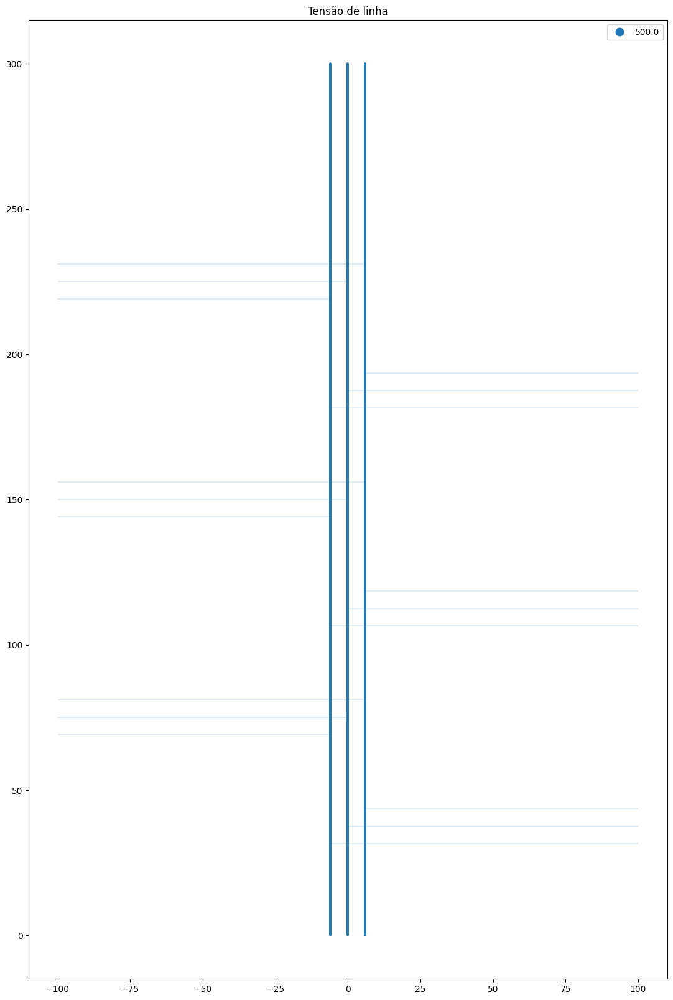

In [ ]:
cairo = subestacao('cairo.dxf', 'camadasCairo.csv', 'fontesCairo.csv')

In [ ]:
cairo.explorar(col='i')

In [ ]:
cairo.novagrade(desde=(-50,-50), ate=(50,350), h=1.0)

100.0 % dos pontos estão entre 0 e 8.33


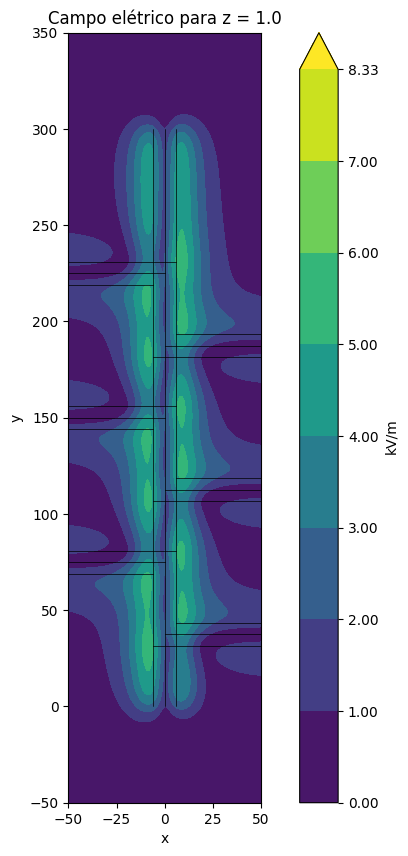

In [ ]:
cairo.CampoEletrico()

98.99980459758694 % dos pontos estão entre 0.00027176383009646087 e 7.160701704025268


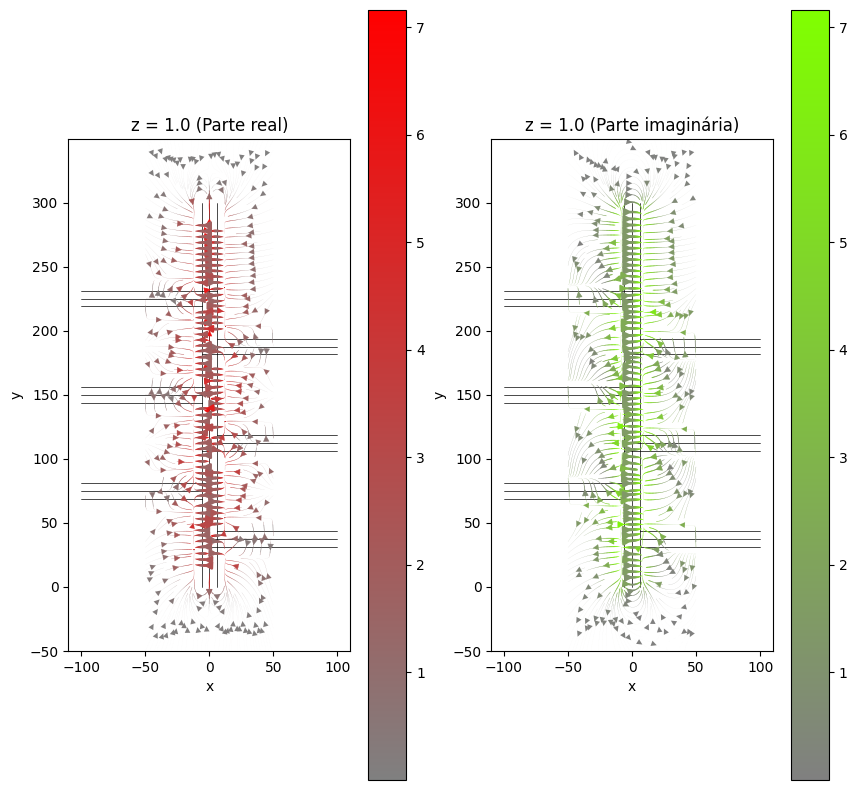

array([<Axes: title={'center': 'z = 1.0 (Parte real)'}, xlabel='x', ylabel='y'>,
       <Axes: title={'center': 'z = 1.0 (Parte imaginária)'}, xlabel='x', ylabel='y'>],
      dtype=object)

In [ ]:
cairo.grafico(cairo.E, tipo='vetor', density=3)

99.49999666859888 % dos pontos estão entre 0 e 42.8518814086911


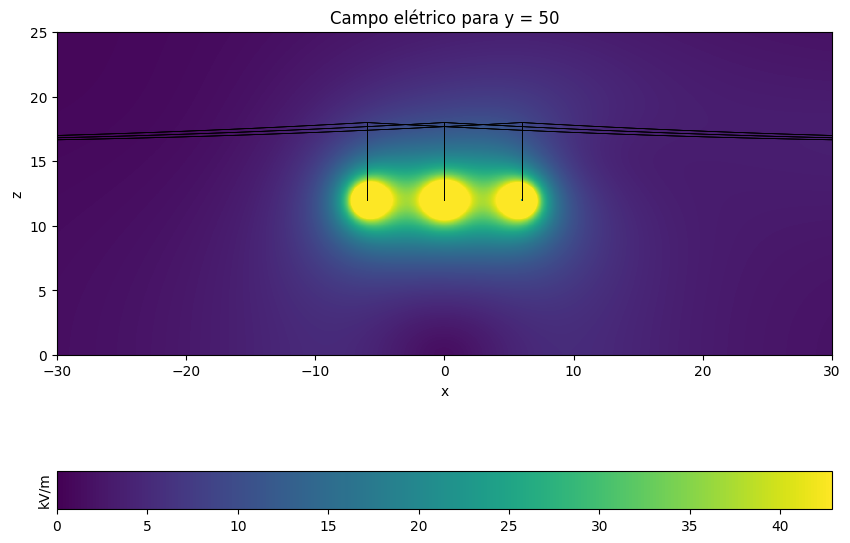

In [ ]:
cairo.CampoEletrico(desde=(-30,0), ate=(30,25), eixoh='y', h=50, \
                    limite=None, tipo='cor')

98.99999333719775 % dos pontos estão entre 0.008672664337791503 e 60.60171352386431


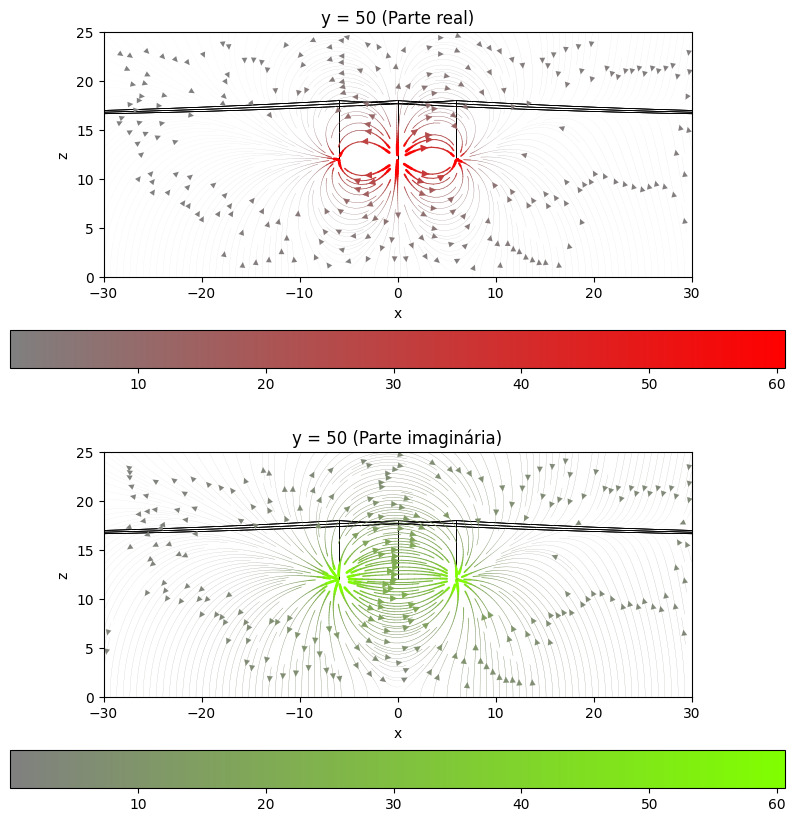

array([<Axes: title={'center': 'y = 50 (Parte real)'}, xlabel='x', ylabel='z'>,
       <Axes: title={'center': 'y = 50 (Parte imaginária)'}, xlabel='x', ylabel='z'>],
      dtype=object)

In [ ]:
cairo.grafico(cairo.E, tipo='vetor')

98.99847983546455 % dos pontos estão entre 0.02020503293722868 e 7.291462669372558


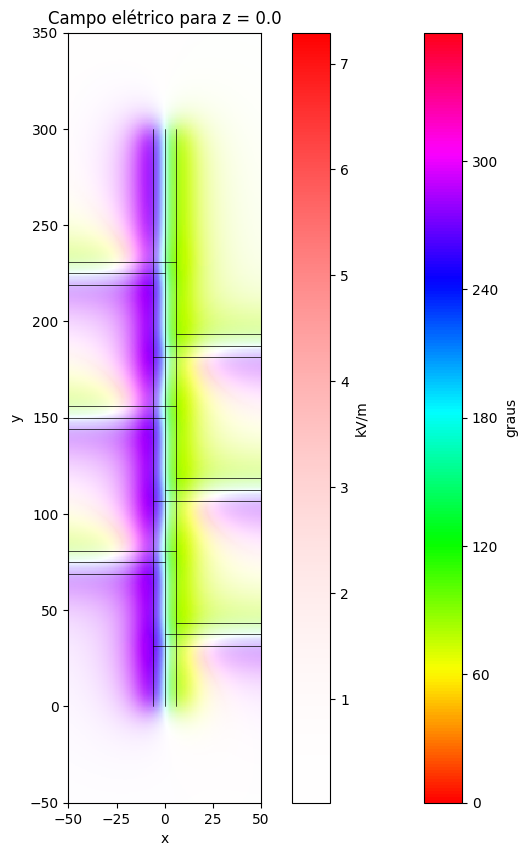

<Axes: title={'center': 'Campo elétrico para z = 0.0'}, xlabel='x', ylabel='y'>

In [ ]:
cairo.grafico(cairo.CampoEletrico(ret=True, desde=(-50,-50), ate=(50,350), \
                                  eixoh='z', h=0.0)[...,2], \
              tipo='complexo', titulo='Campo elétrico', unidade='kV/m')

99.49990229879347 % dos pontos estão entre 0 e 1.0944455027580258


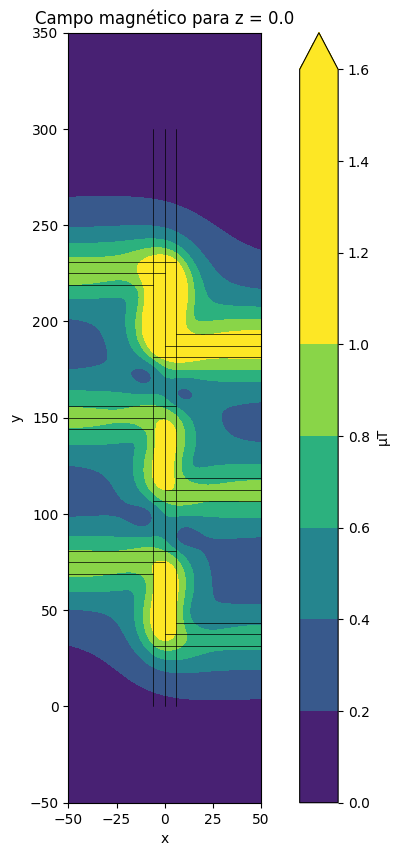

In [ ]:
cairo.CampoMagnetico()

99.49999666859888 % dos pontos estão entre 0 e 15.017804627418503


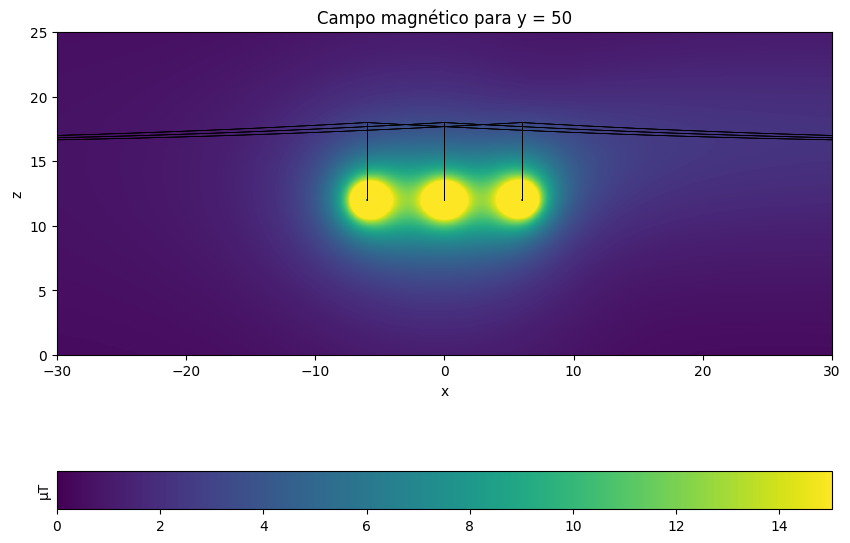

In [ ]:
cairo.CampoMagnetico(desde=(-30,0), ate=(30,25), eixoh='y', h=50, tipo='cor')

98.99999333719775 % dos pontos estão entre 1.6135660052540855e-08 e 2.123838123225139e-05


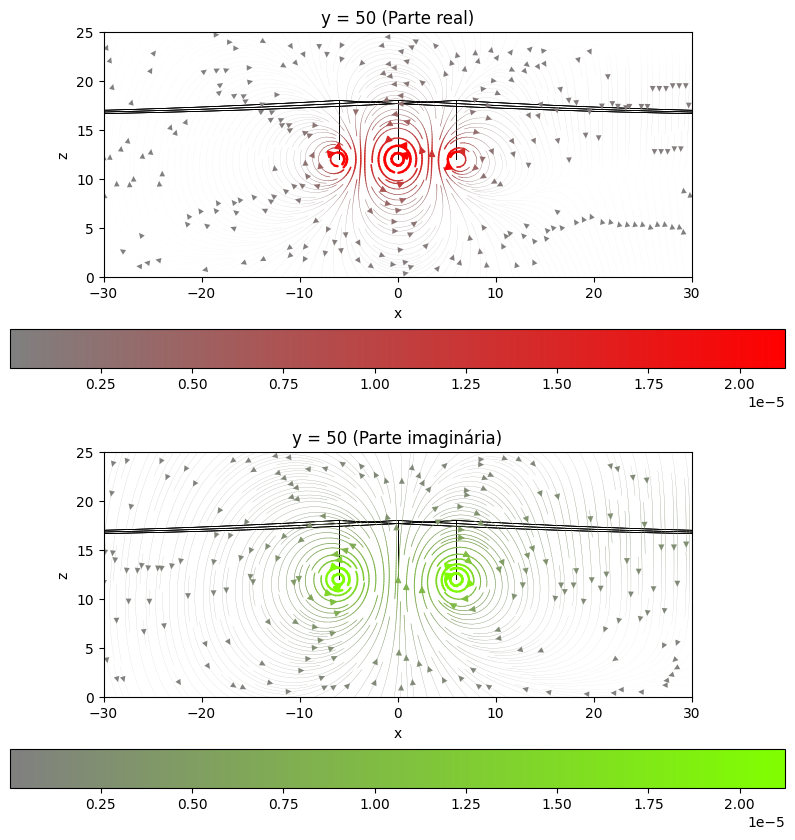

array([<Axes: title={'center': 'y = 50 (Parte real)'}, xlabel='x', ylabel='z'>,
       <Axes: title={'center': 'y = 50 (Parte imaginária)'}, xlabel='x', ylabel='z'>],
      dtype=object)

In [ ]:
cairo.grafico(cairo.B, tipo='vetor')

In [ ]:
cairo.novagrade(desde=(-50,-50), ate=(50,350), eixoh='z', h=1.5)

98.99847983546455 % dos pontos estão entre 0.0305128525570035 e 11.025911054611207


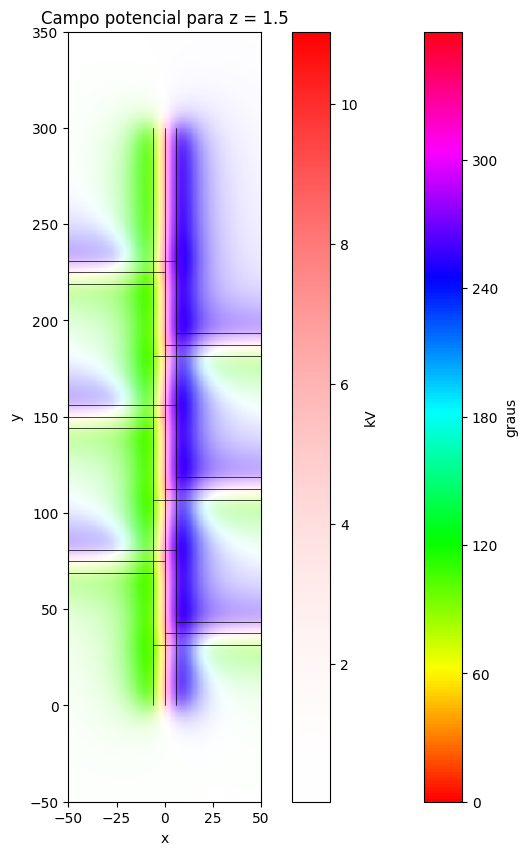

In [ ]:
cairo.Potencial()

In [ ]:
observadores = cp.linspace(cairo.segs.coords['pta'].values, \
                           cairo.segs.coords['ptb'].values, \
                           num=5, endpoint=False)[1:]

Vsegs = cairo.Potencial(ret=True, observadores=observadores)
ptsobs = np.apply_along_axis(shp.Point, -1, asnumpy(observadores))
obs = gpd.GeoSeries(ptsobs.flatten()).reset_index()
obs['Vfase'] = asnumpy(Vsegs.flatten())

obs['Vfase'] = obs['Vfase'].astype(str)
obs['arg'] = (np.angle(asnumpy(Vsegs)).flatten() * 180/np.pi) % 360
obs['amp'] = np.abs(asnumpy(Vsegs)).flatten()
obs['coords'] = obs.geometry.get_coordinates(include_z=True).apply(tuple, axis=1)
obs.explore(column='amp', cmap='viridis')


98.99994003477983 % dos pontos estão entre 0.47212479934096346 e 188.6081081390373


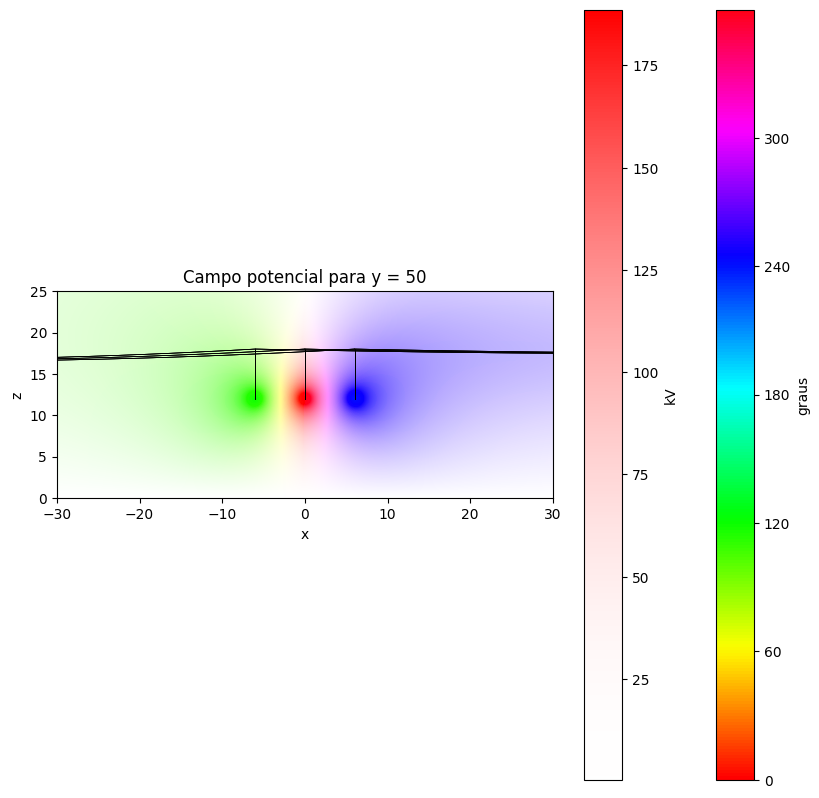

In [ ]:
cairo.Potencial(desde=(-30,0), ate=(30,25), eixoh='y', h=50)

98.99980459758694 % dos pontos estão entre 1.9061265561504115e-06 e 321.2605773925776


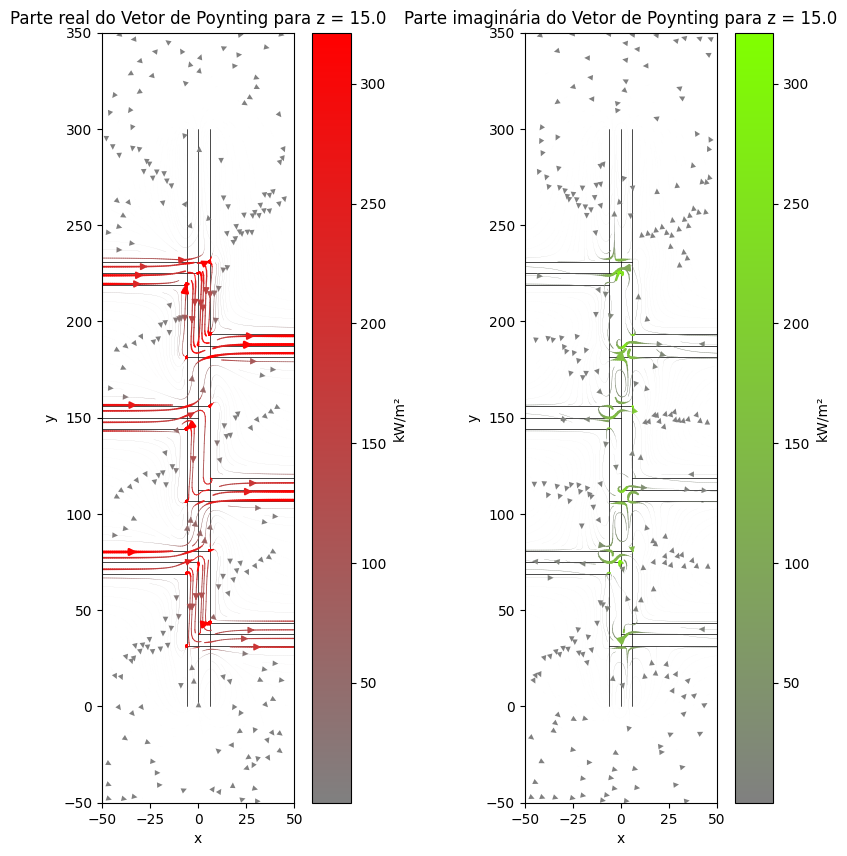

array([<Axes: title={'center': 'Parte real do Vetor de Poynting para z = 15.0'}, xlabel='x', ylabel='y'>,
       <Axes: title={'center': 'Parte imaginária do Vetor de Poynting para z = 15.0'}, xlabel='x', ylabel='y'>],
      dtype=object)

In [ ]:
cairo.novagrade(desde=(-50,-50), ate=(50,350), h=15.0, eixoh='z')

E = cairo.CampoEletrico(ret=True)
B = cairo.CampoMagnetico(ret=True)
Poynting = cp.cross(E, B.conj()) / (2*sp.constants.mu_0)
cairo.grafico(Poynting, tipo='vetor', density=3, unidade='kW/m²', \
              titulo="Vetor de Poynting")

98.99998750296804 % dos pontos estão entre 2.2370617103576658 e 4283.036752929709


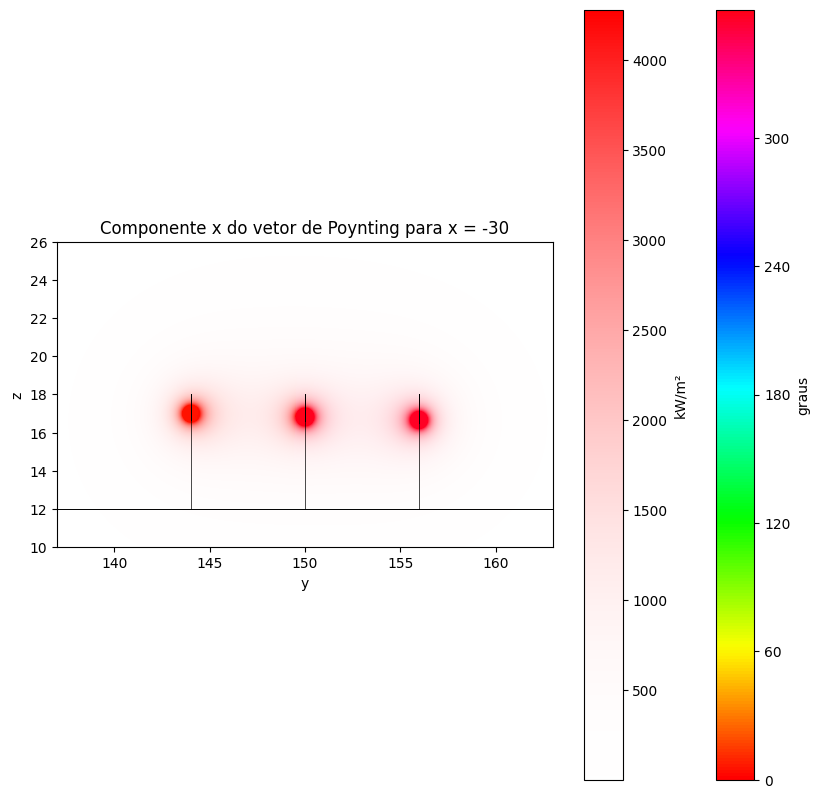

<Axes: title={'center': 'Componente x do vetor de Poynting para x = -30'}, xlabel='y', ylabel='z'>

In [ ]:
cairo.novagrade(desde=(137,10), ate=(163,26), h=-30, eixoh='x', npts=1e6)

E = cairo.CampoEletrico(ret=True)
B = cairo.CampoMagnetico(ret=True)
Poynting = cp.cross(E, B.conj()) / (2*sp.constants.mu_0)

cairo.grafico(Poynting[...,0], tipo='complexo', unidade='kW/m²',\
              titulo='Componente x do vetor de Poynting')

In [ ]:
# Potência fornecida pela linha mostrada acima:
cairo.malha.res_line.loc[8, 'p_from_mw']

125.00000000019158

In [ ]:
# Potência transmitida pelo vetor de Poynting mostrado acima:
Poynting[...,0].sum()*cairo.passo**2 / 1e3

array(126.82423+0.0458536j, dtype=complex64)

# Teste Babilônia Sul

iwamoto muliplier: 1.0120867585315987
iwamoto muliplier: 1.000025730725775
iwamoto muliplier: 1.0000000030701806


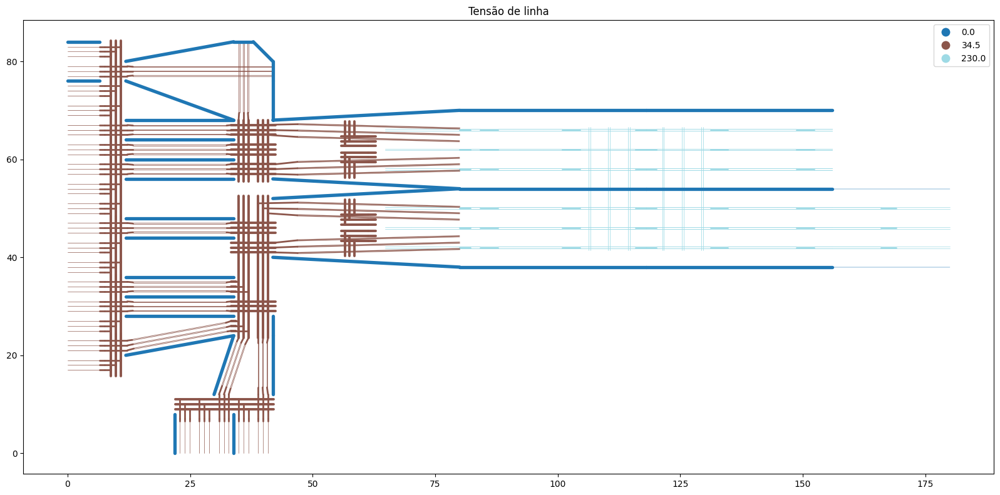

In [ ]:
bbs = subestacao('bbscircuitos.dxf', 'bbscamadas.csv', 'bbsfontes.csv')

<Axes: >

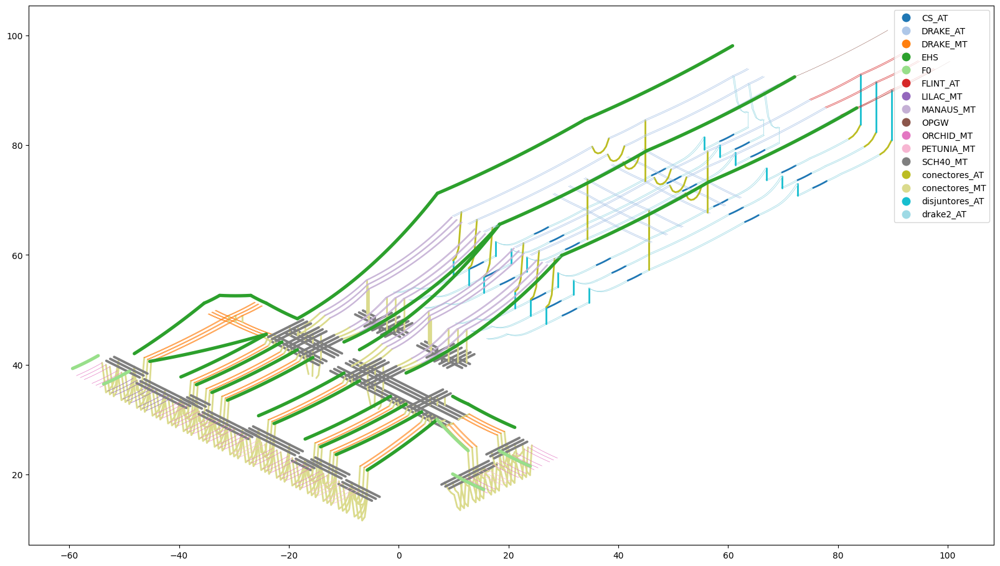

In [ ]:
bbs.mostrar(col='Camada', theta=45, phi=30)

<Axes: title={'center': 'Corrente (kA)'}>

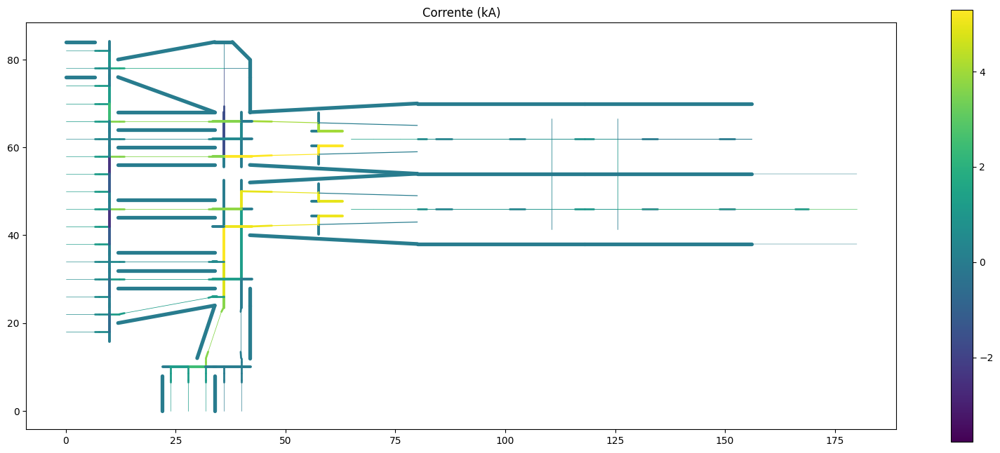

In [ ]:
bbs.mostrar(unifilar=True, col='i', figsize=(20,8), titulo='Corrente (kA)')

In [ ]:
bbs.explorar(unifilar=True, col='Camada')

<Axes: >

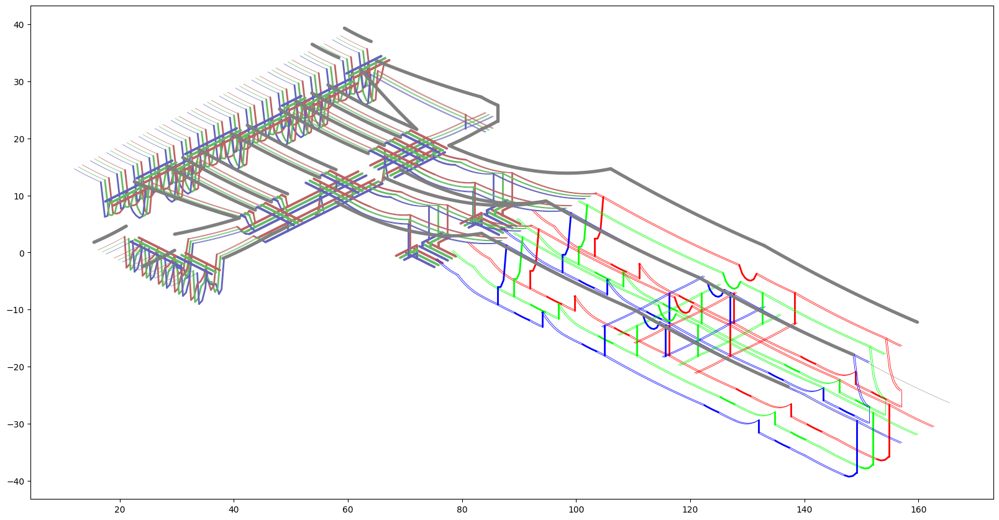

In [ ]:
bbs.mostrar(col='Vfase', theta=-45, phi=30, vmax=60)

In [ ]:
bbs.explorar(col='i', theta=-45, phi=30)

99.56173091406144 % dos pontos estão entre 0 e 8.33


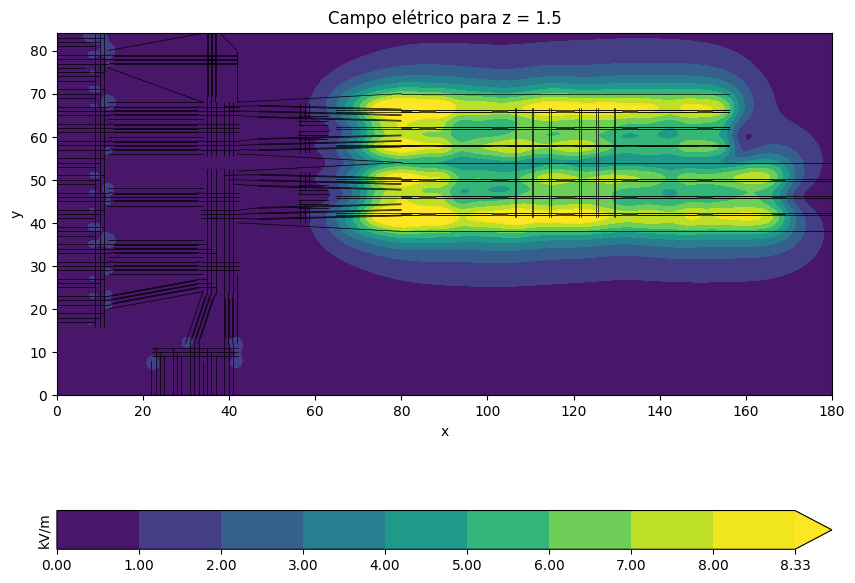

In [ ]:
bbs.CampoEletrico()

99.49979434515517 % dos pontos estão entre 0 e 1.4418558031320572


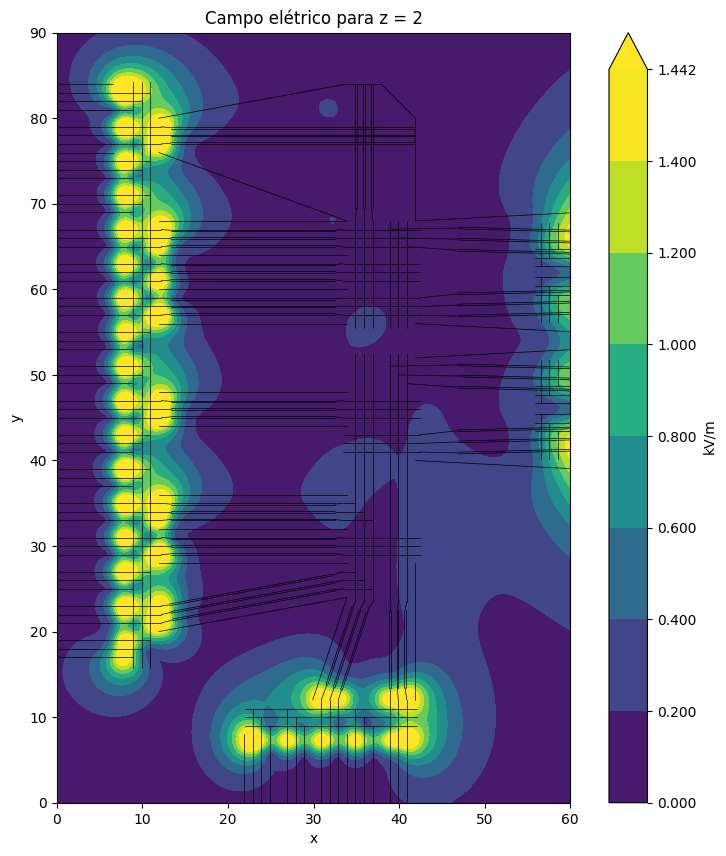

In [ ]:
bbs.novagrade(ate=(60,90), h=2)
bbs.CampoEletrico(limite=None)

99.49999555777244 % dos pontos estão entre 0 e 39.043425617218205


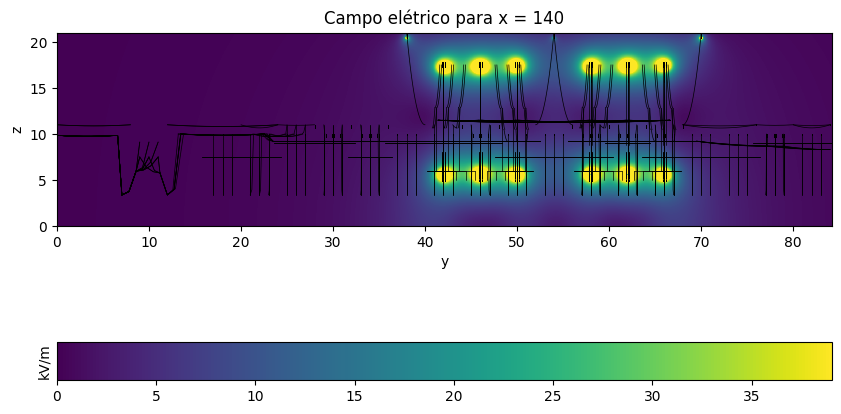

In [ ]:
bbs.novagrade(eixoh='x', h=140, desde=(0,0))
bbs.CampoEletrico(limite=None, graf='cor')

99.99980003359435 % dos pontos estão entre 0.015952127054333687 e 188.599609375


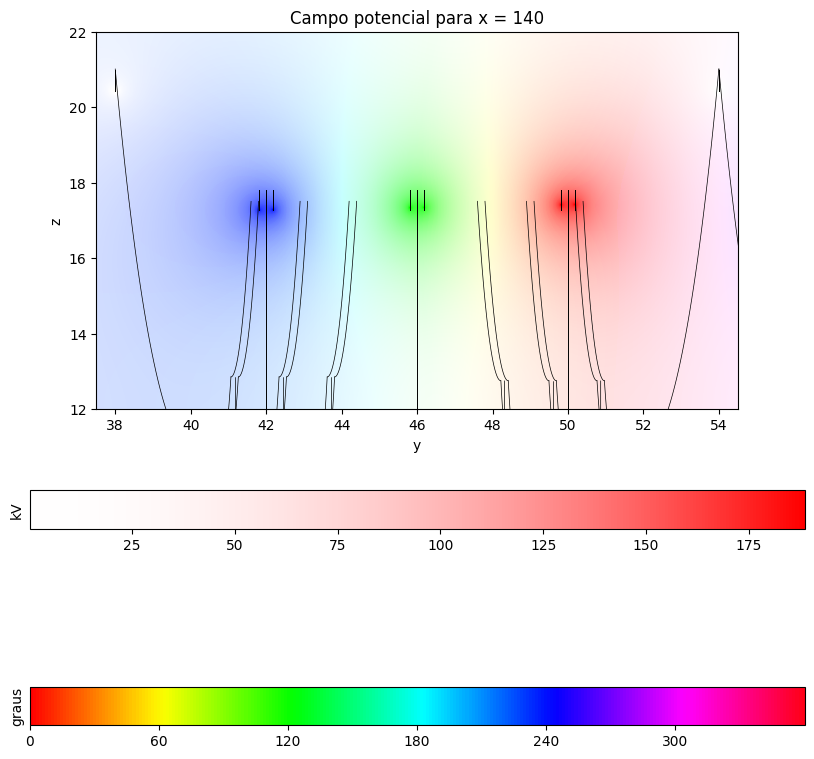

In [ ]:
bbs.Potencial(desde=(37.5,12), ate=(54.5,22), limite=None, prcent=100)

98.9999680053751 % dos pontos estão entre 0.11335886523127556 e 84.92679897308349


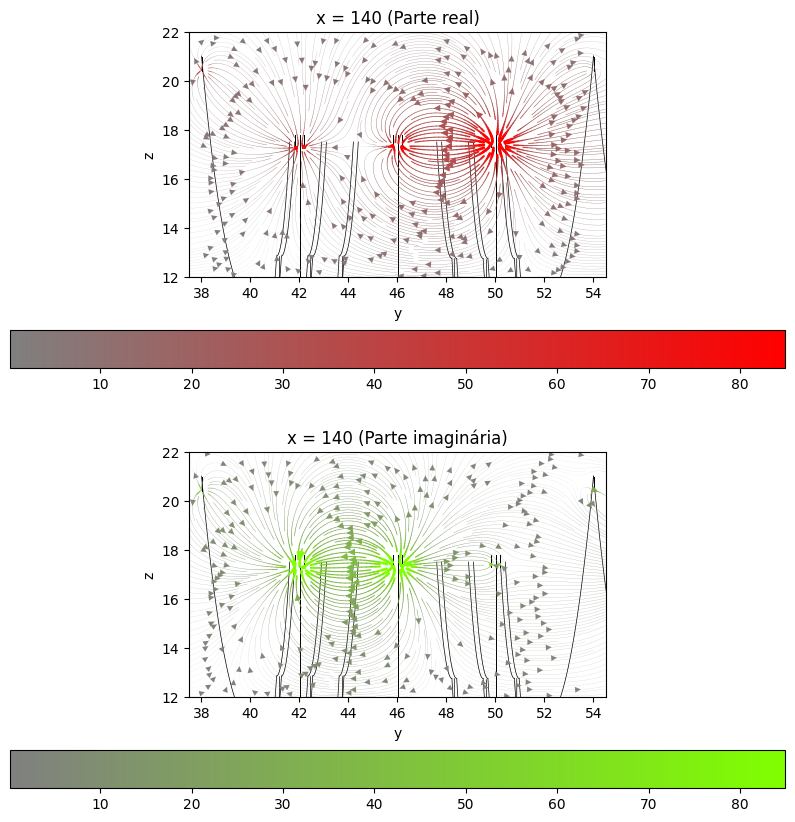

array([<Axes: title={'center': 'x = 140 (Parte real)'}, xlabel='y', ylabel='z'>,
       <Axes: title={'center': 'x = 140 (Parte imaginária)'}, xlabel='y', ylabel='z'>],
      dtype=object)

In [ ]:
# O campo elétrico foi armazenado como bbs.E e pode ser usado novamente
bbs.CampoEletrico(graf=None)
bbs.grafico(bbs.E, tipo='vetor')

98.99871604741666 % dos pontos estão entre 0.08230061642825603 e 11.308765459060654


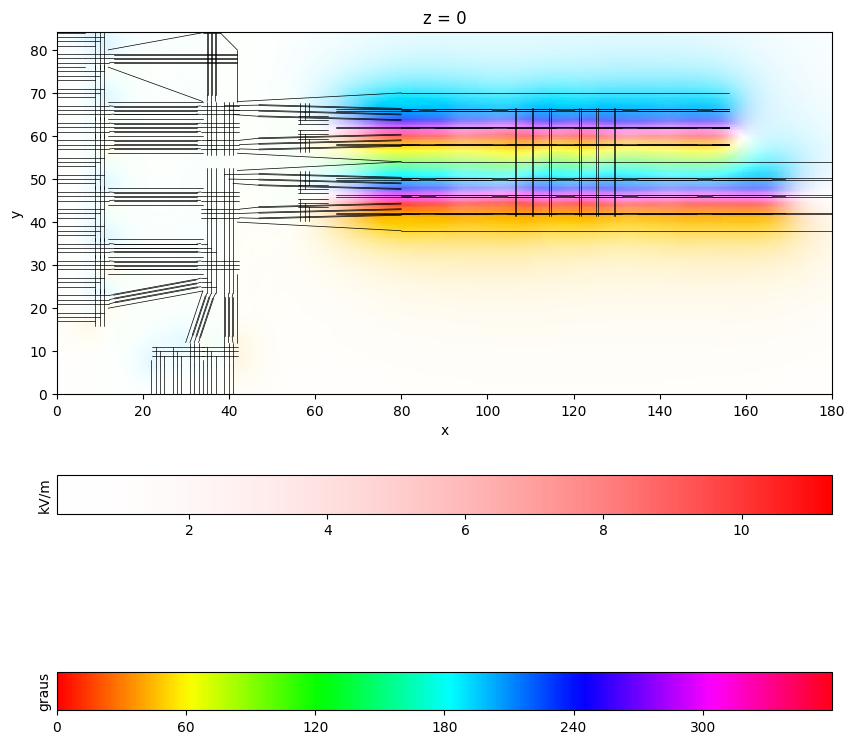

<Axes: title={'center': 'z = 0'}, xlabel='x', ylabel='y'>

In [ ]:
bbs.grafico(bbs.CampoEletrico(ret=True, eixoh='z', h=0)[...,2], tipo='complexo', unidade='kV/m')

In [ ]:
bbs.gradepadrao()

99.4996897944017 % dos pontos estão entre 0 e 51.53104309082036


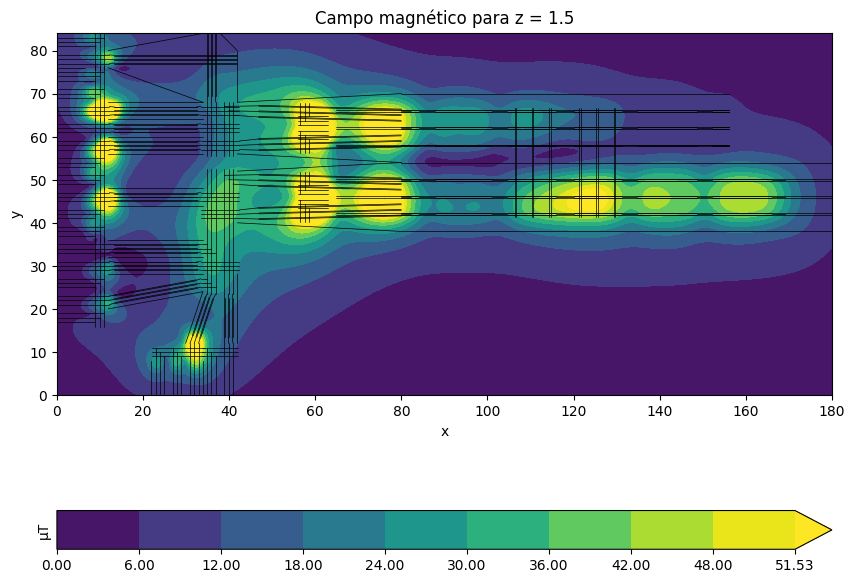

In [ ]:
bbs.CampoMagnetico()

98.94458767897373 % dos pontos estão entre 0 e 1000


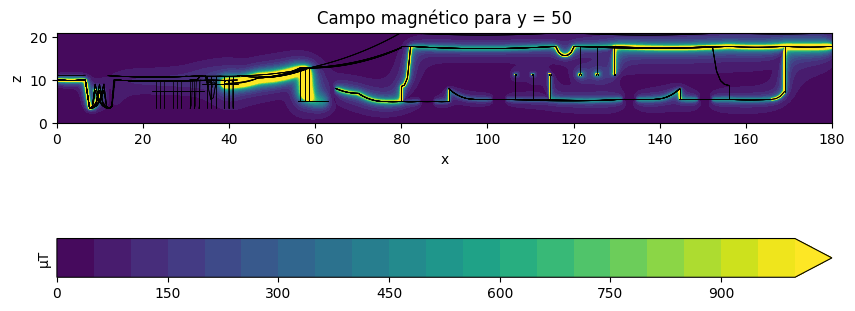

In [ ]:
bbs.CampoMagnetico(eixoh='y', h=50, desde=(0,0), levels=20, limite=1000)

99.49999555777244 % dos pontos estão entre 0 e 423.50811096191455


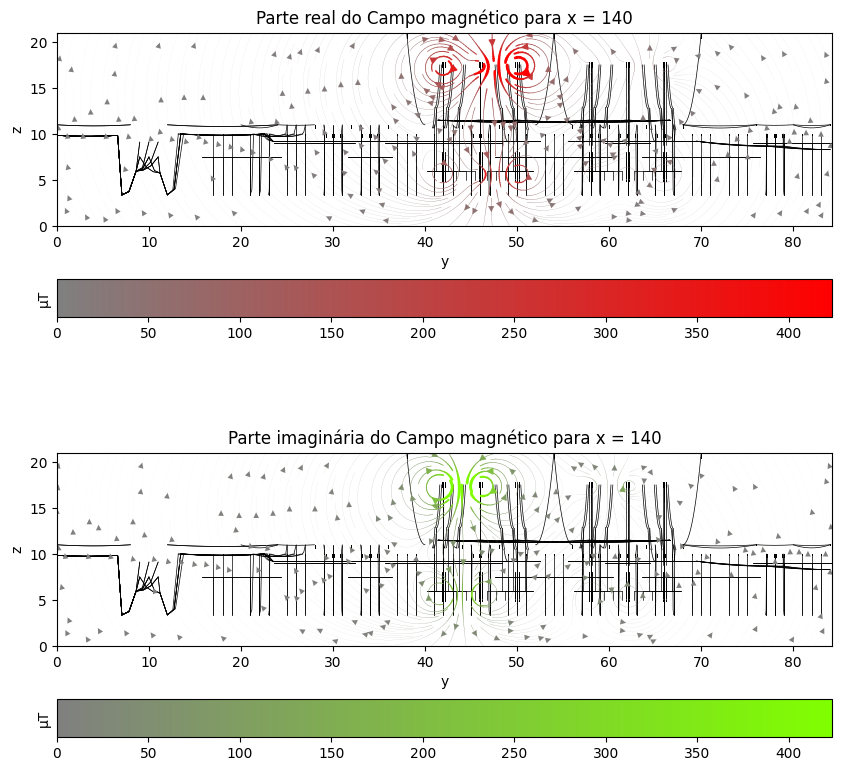

In [ ]:
bbs.CampoMagnetico(eixoh='x', h=140, desde=(0,0), tipo='vetor')

98.99992765515114 % dos pontos estão entre 0.08652019876986743 e 101.90570499420126


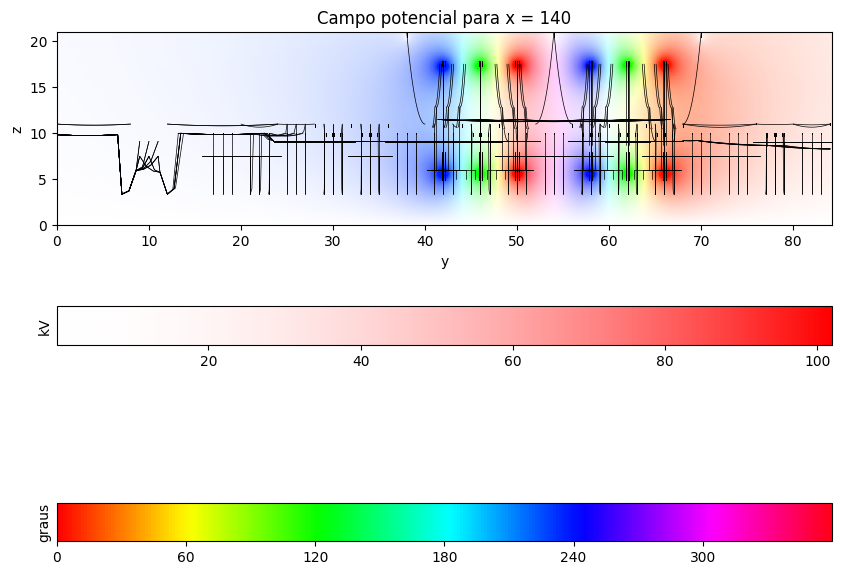

In [ ]:
bbs.Potencial()

In [ ]:
bbs.gradepadrao()

98.99937958880341 % dos pontos estão entre 0.0012631233991123735 e 251.63641754150393


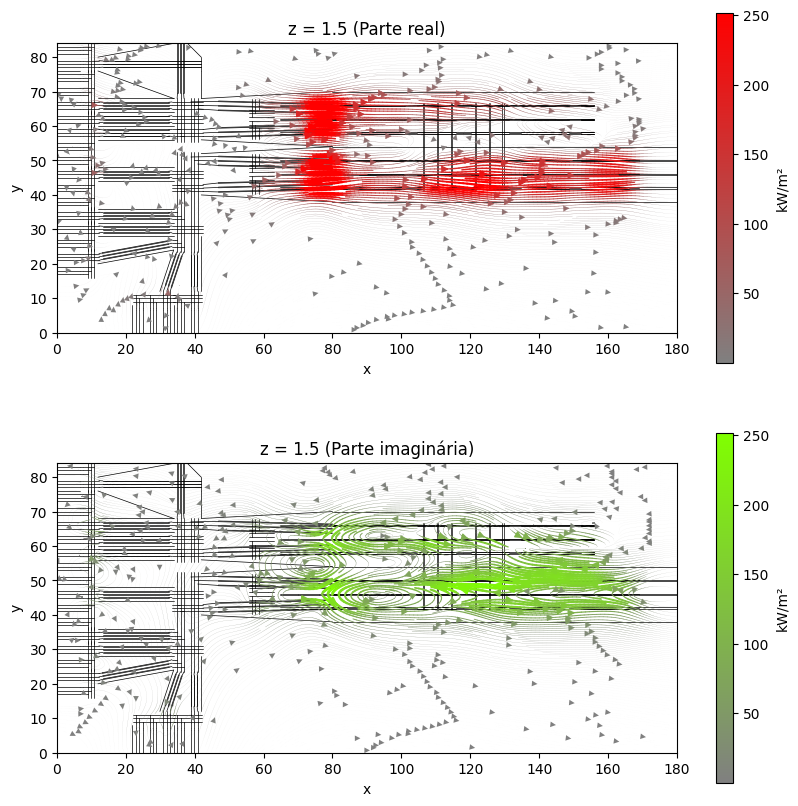

array([<Axes: title={'center': 'z = 1.5 (Parte real)'}, xlabel='x', ylabel='y'>,
       <Axes: title={'center': 'z = 1.5 (Parte imaginária)'}, xlabel='x', ylabel='y'>],
      dtype=object)

In [ ]:
Poynting = cp.cross(bbs.CampoEletrico(ret=True), \
                    bbs.CampoMagnetico(ret=True).conj()) / (2*sp.constants.mu_0)

bbs.grafico(Poynting, tipo='vetor', unidade='kW/m²', density=5)

98.99994800977416 % dos pontos estão entre 266.02129806518553 e 255645.692578124


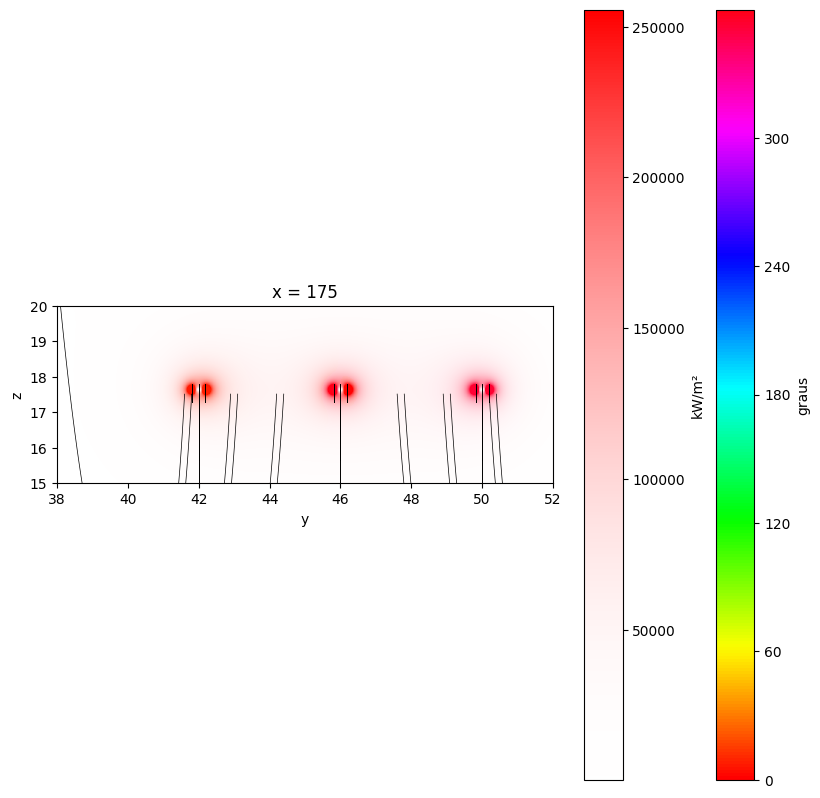

<Axes: title={'center': 'x = 175'}, xlabel='y', ylabel='z'>

In [ ]:
bbs.novagrade(desde=(38,15), ate=(52,20), h=175, eixoh='x', npts=5e5)

Poynting = cp.cross(bbs.CampoEletrico(ret=True), \
                    bbs.CampoMagnetico(ret=True).conj()) / (2*sp.constants.mu_0)

bbs.grafico(Poynting[...,0], tipo='complexo', unidade='kW/m²')

In [ ]:
# Potência transmitida pela linha mostrada acima
bbs.malha.res_line.loc[301, 'p_from_mw']

1179.0538817724394

In [ ]:
# Fluxo do vetor de Poynting através da grade acima
Poynting[...,0].sum()*bbs.passo**2 / 1e3

array(1137.2368+0.6203294j, dtype=complex64)